<a href="https://colab.research.google.com/github/huskeypm/herg/blob/main/herg_XF.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Porpoise:**This notebooks allows an end-user to reproduce key figures in our hERG manuscript, based on 'feature' sets that have been procured from simulation and sequence analyses. Several statistical and machine learning processes are defined below. 

**Usage:** Hit shift-enter a buncho times to conduct the analyses and generate the corresponding figures.

Many of the analyses use routines that are imported from the herg git project that is cloned below. 

*Contact pkekeneshuskey@luc.edu for support*


Summary of data figures in paper
- Figs 2 and 3 are generated from gnu plot files included with git repo. Comparable data is displayed in [Section 1](#section_1)
- Version of Fig 5 is computed in [Section 1](#section_1)
- Table 1 can be reassembled from code outputs in [Section 2](#section_2)
- Figs 6-9 is based on outputs from [Section 2](#section_2)


Clone python libraries in support of this notebook 

In [1]:
#!git clone https://github.com/huskeypm/herg.git

In [2]:
#!pip3 install pydotplus
#!pip3 install mlxtend


In [3]:
#cd /content/herg


In [4]:
#!git pull 

In [5]:
if 0: 
  from google.colab import drive
  drive.mount('/content/drive')

In [6]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2

import matplotlib.pylab as plt
import pandas as pd
import probUtil as dU
import mlUtil
import feature
import numpy as np

#from sklearn.cross_validation import train_test_split
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification

from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, plot_confusion_matrix, plot_roc_curve

from mlxtend.data import iris_data
from sklearn.utils import resample

import os
import math
from math import floor, ceil

# stuff for plotting trees
from six import StringIO
#from sklearn.externals.six import StringIO  
from IPython.display import Image  
from sklearn.tree import export_graphviz
import pydotplus
from pandas.plotting import scatter_matrix
import seaborn as sns
from sklearn import datasets
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

from matplotlib import rcParams

Load feature set for PAS domain variants. Features are explained in readme [TODO] . Most features are computed offline and stored in a txt file that is included with the git repo

In [7]:
dataFile = "feature_sets/features-latest-sets1n2.txt"
df = pd.read_csv(dataFile, sep="\s+", comment='#')




Add additional features. The imported library can be edited to conduct additional analyses

In [8]:
tags=["WATERS", "HBONDS", "RMSD", "SASA", "HELIX", "TURNS", "COILS", "THREE-TEN", "BETA"]
#tags=["WATERS", "HBONDS", "RMSD", "SASA", "HELIX", "TURNS", "BETA", "COILS", "THREE-TEN",# derived from MD 
tags+=["CONSERVATION","FOLDX", "HYDROPHOBICITY"] # derived from sequence
output = ["TRAFFICKING"]    
tags+=['APBS','SASASingleSite']

feature.CalcInitialAA(df,newTag="INITAA")
feature.Calccharge(df,newTag="CHARGE")
feature.Calchydrophobicity(df,newTag='HYDROPHOBICITY') #use feature.py to calculate hydrophobicity (same results as original data file)
rmsf={
    'RMSF36TO41' : 'rmsf_sub2.txt',
    'RMSF87TO92' : 'rmsf_sub3.txt',
    'RMSF73TO78' : 'rmsf_sub4.txt',
    'RMSF115TO120' : 'rmsf_sub.txt'} 
for key,val in rmsf.items():
    print("feature_sets/%s"%val,key)
    #feature.CalcRMSFLoc(df,"feature_sets/rmsf_sub2.txt", newTag="RMSF36TO41")
    feature.CalcRMSFLoc(df,"feature_sets/%s"%val, newTag=key)
    tags+=[key]



# include also APBS and SASASingleSite
feature.CalcAPBS(df,'feature_sets/apbs.dat',newTag="APBS")
feature.CalcSASASingleSite(df,'feature_sets/sasaSingleSite.dat',newTag="SASASingleSite")


feature_sets/rmsf_sub2.txt RMSF36TO41
a80p  not found in input list
c64w-q61g  not found in input list
d102a  not found in input list
i96v  not found in input list
feature_sets/rmsf_sub3.txt RMSF87TO92
a80p  not found in input list
c64w-q61g  not found in input list
d102a  not found in input list
i96v  not found in input list
feature_sets/rmsf_sub4.txt RMSF73TO78
a80p  not found in input list
c64w-q61g  not found in input list
d102a  not found in input list
i96v  not found in input list
feature_sets/rmsf_sub.txt RMSF115TO120
a80p  not found in input list
c64w-q61g  not found in input list
d102a  not found in input list
i96v  not found in input list
a57t  not found in input list
a57v  not found in input list
a80p  not found in input list
c64w-q61g  not found in input list
d102a  not found in input list
i42l  not found in input list
i42t  not found in input list
i96v  not found in input list
r56k  not found in input list
r56l  not found in input list
s55t  not found in input list
v41f-c3

In [9]:
# feature sets

### MD features ###
# set 1
tagsMD1=["WATERS", "HBONDS", "RMSD", "SASA", "HELIX", "TURNS", "COILS", "THREE-TEN", "BETA"]
# with also 'RMSF', 'APBS', and 'SASASingleSite'
tagsMD2=["WATERS", "HBONDS", "RMSD", "SASA", "HELIX", "TURNS", "COILS", "THREE-TEN", "BETA"]
for key,val in rmsf.items():
      tagsMD2+=[key]
tagsMD2+=['APBS','SASASingleSite']


### Bioinformatics features ###
tagsBio=["HYDROPHOBICITY", "FOLDX", "CONSERVATION"]


### All features ###
# set 1
tagsAll1=tagsMD1+tagsBio
# with also 'RMSF', 'APBS', and 'SASASingleSite'
tagsAll2=tagsMD2+tagsBio

In [10]:
df

,VARIANT,HELIX,TURNS,COILS,THREE-TEN,BETA,ISOLATED,RMSD,HBONDS,SASA,...,HYDROPHOBICITY,CLASS,TRAFFICKING,INITAA,RMSF36TO41,RMSF87TO92,RMSF73TO78,RMSF115TO120,APBS,SASASingleSite
0,a32t,21.1567,21.2058,14.4202,3.29401,39.6439,0.279349,1.23560,66.7186,6473.83,...,-0.43,1,1,0,1.36,0.80,0.79,1.94,-10837.766667,-4.01359
1,a57p,20.4290,21.8332,14.5935,3.53135,39.4690,0.144014,1.28151,66.0936,6477.76,...,-0.32,0,1,0,1.16,0.75,0.86,1.56,-13412.700000,101.72733
2,a78p,20.8206,21.3096,14.5379,3.19232,39.9190,0.220522,1.12505,65.8526,6479.56,...,-0.32,1,1,0,1.23,0.82,0.85,1.67,-13561.266667,28.40966
3,a85v,20.8686,21.4237,14.6775,3.12031,39.6774,0.232523,1.16450,65.4562,6544.62,...,0.29,1,1,0,1.31,0.87,0.88,1.52,-14364.766667,16.12533
4,c108r,22.1452,21.1476,15.3975,2.75727,38.2283,0.324033,1.58552,62.7131,6753.12,...,-1.84,1,0,1,1.30,0.91,1.14,1.53,-14268.533333,14.51022
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,v94g,21.3471,21.1671,14.3579,2.88329,39.9415,0.303030,1.15005,67.0823,6481.89,...,-0.38,1,0,17,1.27,0.93,1.00,1.63,-15318.233333,21.69200
71,wt,19.4789,21.9577,14.7117,3.29257,40.5025,0.056664,1.09132,66.7740,6568.87,...,0.00,0,1,20,1.12,1.35,0.83,1.51,-16051.300130,0.00000
72,y43c,21.0411,21.3291,14.3204,2.88329,40.1875,0.238524,1.14731,65.0498,6467.45,...,0.02,1,0,19,1.48,0.91,0.88,1.59,-13976.300000,54.30720
73,y54h,21.4147,21.2601,14.9385,2.89979,39.3144,0.172517,1.33484,65.8552,6512.28,...,-0.42,1,1,19,1.52,0.87,0.86,1.88,-16184.900000,30.63473


In [11]:
df.to_csv('./feature_sets/all_data.csv')

Display the first few variants and their corresponding features

### visualize data

findfont: Font family ['cursive'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'cursive' not found because none of the following families were found: Apple Chancery, Textile, Zapf Chancery, Sand, Script MT, Felipa, Comic Neue, Comic Sans MS, cursive
findfont: Font family ['cursive'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'cursive' not found because none of the following families were found: Apple Chancery, Textile, Zapf Chancery, Sand, Script MT, Felipa, Comic Neue, Comic Sans MS, cursive


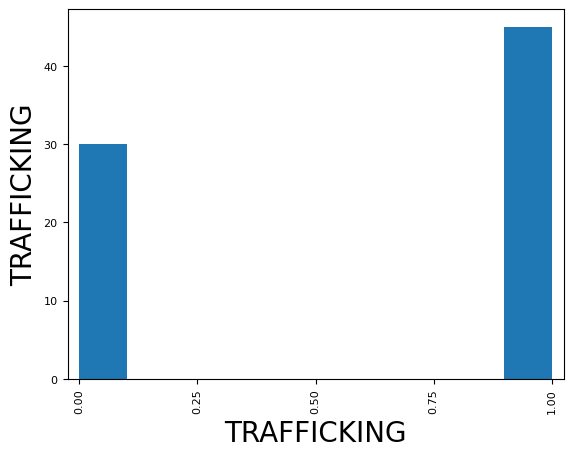

In [12]:
Y=df[['TRAFFICKING']]
scatter_matrix(Y)
#plt.show()
plt.savefig('target-data-distribution.pdf')

/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/x

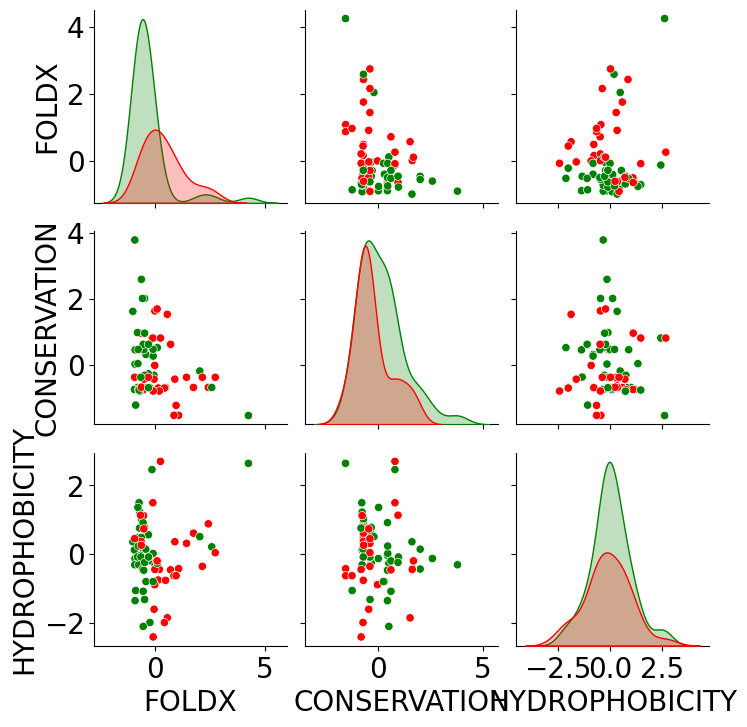

In [13]:
tagsPlot=tagsBio+['TRAFFICKING']
df_BIO = df[tagsPlot]
df_BIO_zscore=df_BIO.copy()
for col in df_BIO.columns:
    zs=dU.CalcZScore(df_BIO,tag=col)
    df_BIO_zscore[col]=zs
plot = sns.pairplot(df_BIO_zscore, hue='TRAFFICKING', palette=['Red', 'Green'],vars=['FOLDX', 'CONSERVATION', 'HYDROPHOBICITY']) 
plot._legend.remove()
plt.savefig('bioinformatics-data-distribution2.pdf')

/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/x

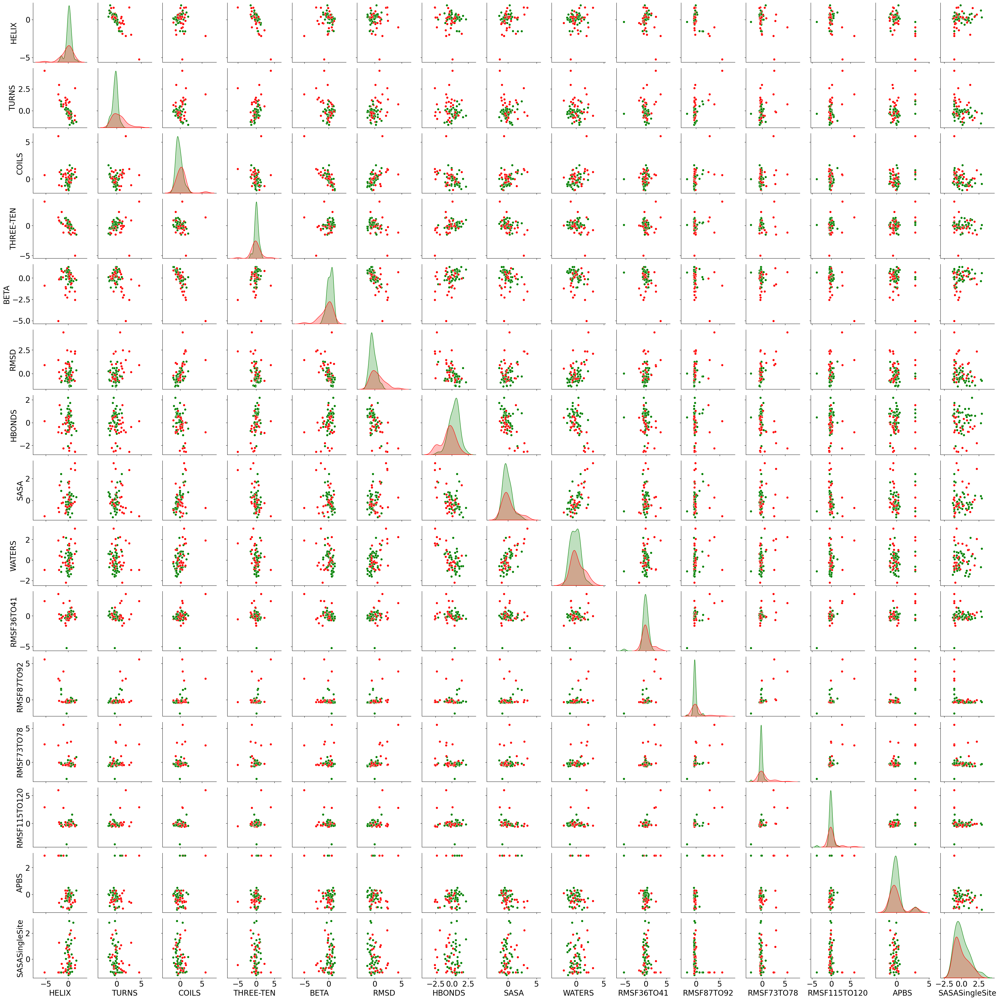

In [14]:
tagsPlot=tagsMD2+['TRAFFICKING']
df_MD = df[tagsPlot]
df_MD_zscore=df_MD.copy()
for col in df_MD.columns:
    df_MD_zscore[col]=dU.CalcZScore(df_MD,tag=col)
plot = sns.pairplot(df_MD_zscore, hue='TRAFFICKING', palette=['Red', 'Green'],vars=["HELIX","TURNS","COILS","THREE-TEN","BETA","RMSD","HBONDS","SASA","WATERS",'RMSF36TO41','RMSF87TO92','RMSF73TO78','RMSF115TO120','APBS','SASASingleSite']) 
plot._legend.remove()
plt.savefig('md-data-distribution2.pdf')


In [17]:
print(tagsMD2)
print(tagsMD2[:8])
print(tagsMD2[8:])

['WATERS', 'HBONDS', 'RMSD', 'SASA', 'HELIX', 'TURNS', 'COILS', 'THREE-TEN', 'BETA', 'RMSF36TO41', 'RMSF87TO92', 'RMSF73TO78', 'RMSF115TO120', 'APBS', 'SASASingleSite']
['WATERS', 'HBONDS', 'RMSD', 'SASA', 'HELIX', 'TURNS', 'COILS', 'THREE-TEN']
['BETA', 'RMSF36TO41', 'RMSF87TO92', 'RMSF73TO78', 'RMSF115TO120', 'APBS', 'SASASingleSite']


/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/x

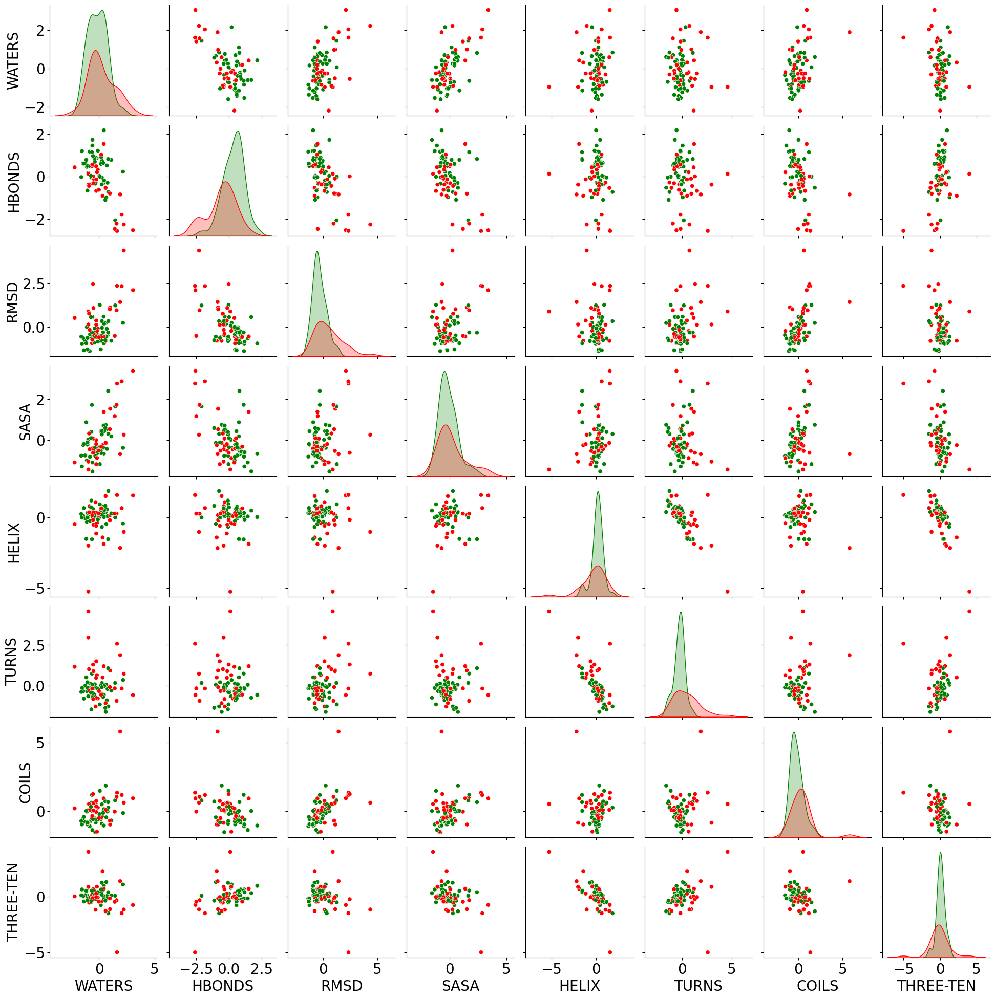

In [18]:
# split MD feats into two plots
tagsPlot=tagsMD2[:8]+['TRAFFICKING']
df_MD = df[tagsPlot]
df_MD_zscore=df_MD.copy()
for col in df_MD.columns:
    df_MD_zscore[col]=dU.CalcZScore(df_MD,tag=col)
plot = sns.pairplot(df_MD_zscore, hue='TRAFFICKING', palette=['Red', 'Green'],vars=tagsMD2[:8]) 
plot._legend.remove()
plt.savefig('md-data-distribution2_1.pdf')


/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/xfang2/anaconda3/lib/python3.9/site-packages/numpy/core/fromnumeric.py:3472: FutureWarning: In a future version, DataFrame.mean(axis=None) will return a scalar mean over the entire DataFrame. To retain the old behavior, use 'frame.mean(axis=0)' or just 'frame.mean()'
  return mean(axis=axis, dtype=dtype, out=out, **kwargs)
/home/x

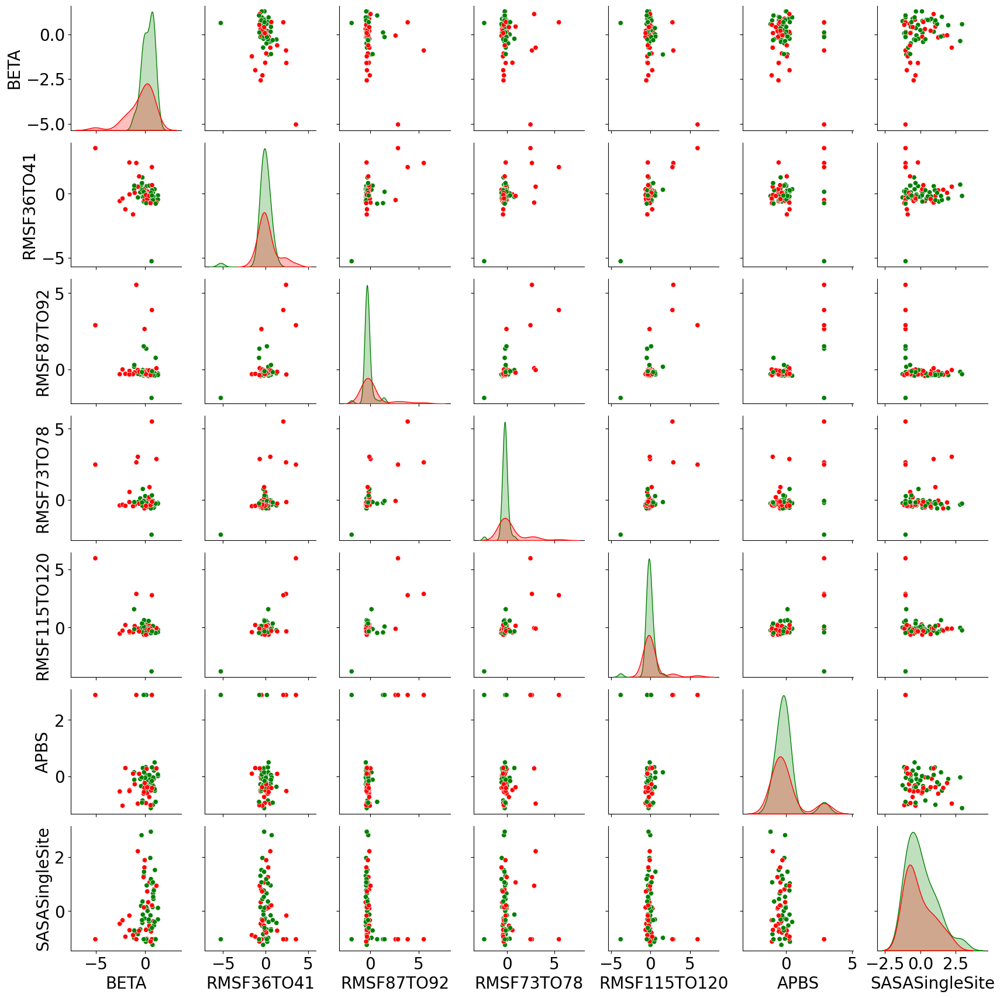

In [20]:
# split MD feats into two plots
tagsPlot=tagsMD2[8:]+['TRAFFICKING']
df_MD = df[tagsPlot]
df_MD_zscore=df_MD.copy()
for col in df_MD.columns:
    df_MD_zscore[col]=dU.CalcZScore(df_MD,tag=col)
plot = sns.pairplot(df_MD_zscore, hue='TRAFFICKING', palette=['Red', 'Green'],vars=tagsMD2[8:]) 
plot._legend.remove()
plt.savefig('md-data-distribution2_2.pdf')

In [21]:
tagsPlot

['WATERS',
 'HBONDS',
 'RMSD',
 'SASA',
 'HELIX',
 'TURNS',
 'COILS',
 'THREE-TEN',
 'BETA',
 'RMSF36TO41',
 'RMSF87TO92',
 'RMSF73TO78',
 'RMSF115TO120',
 'APBS',
 'SASASingleSite',
 'TRAFFICKING']

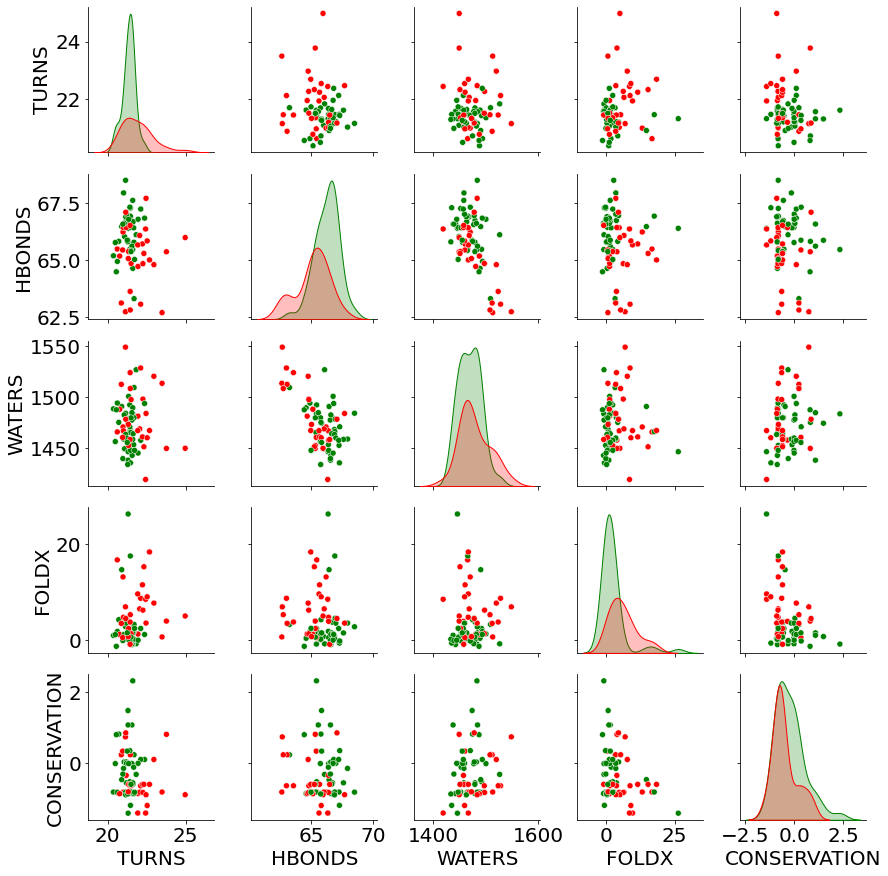

In [22]:
df_best = df[["TURNS","HBONDS","WATERS", "FOLDX", "CONSERVATION", "TRAFFICKING"]]
df_best_zscore=df_best.copy()
for col in df_best.columns:
    df_best_zscore[col]=dU.CalcZScore(df_best,tag=col)
plot = sns.pairplot(df_best, hue='TRAFFICKING', palette=['Red', 'Green'],vars=["TURNS","HBONDS","WATERS", "FOLDX", "CONSERVATION"]) 
plot._legend.remove()

#b = sns.violinplot(y = "Draughts", data = df)
#b.set_yticklabels(b.get_yticks(), size = 15)

plt.savefig('best-data-distribution2.pdf')


In [23]:
display=True  
random_state=50
rcParams['figure.dpi']=100#60

### Section 1: Build and Apply probabilistic classifier 

<a id=’section_1’></a>
[UNDER CONSTRUCTION]
Defines a conditional probability (see methods in the hERG paper) for each feature that represents the likelihood a variant is nontrafficking if its feature value is above some value. 

Displays 
- distribution of variants according to a given feature (converted to z-scores). Green are trafficking; red are non-trafficking. 
- All conditional probs are shown in one graph (Cond. probability)
- ROC curve gives the true and false positive rates for identifying a non-trafficking variant. 
- Also shown is a plot for the true/false positive/negative rates, but this is currently INCORRECT

Prints out
- indi_condprob_md.pdf; 
- roc_conditional_probability 
in the local file directory.

In [6]:
cases = dict() # for storing all outputs 

findfont: Font family ['cursive'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'cursive' not found because none of the following families were found: Apple Chancery, Textile, Zapf Chancery, Sand, Script MT, Felipa, Comic Neue, Comic Sans MS, cursive
/home/xfang2/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1667: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = value
/home/xfang2/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

TESTING  stats
Accuracy(NT) 0.782608695652174
Precision(NT) 1.0
Recall(NT) 0.4444444444444444
F1 score(NT) 0.6153846153846154
Accuracy(T) 0.782608695652174
Precision(T) 0.7368421052631579
Recall(T) 1.0
F1 score(T) 0.8484848484848485


/home/xfang2/repos/herg/probUtil.py:250: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


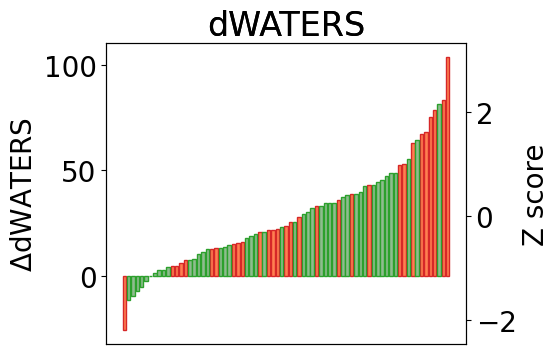

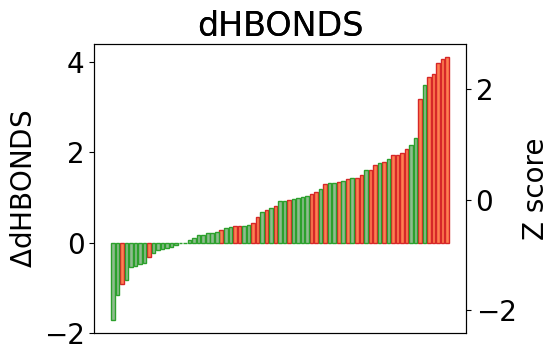

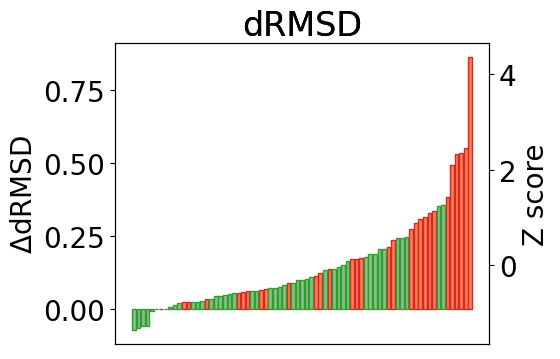

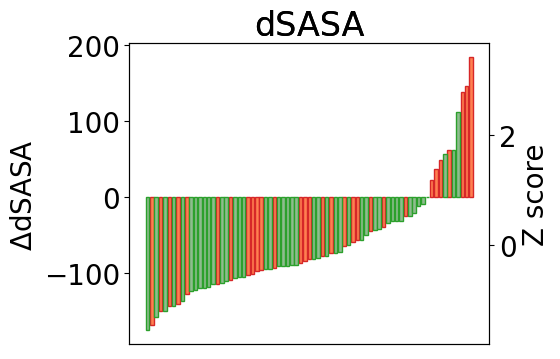

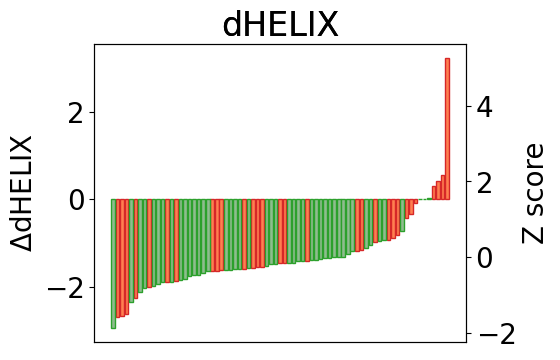

...

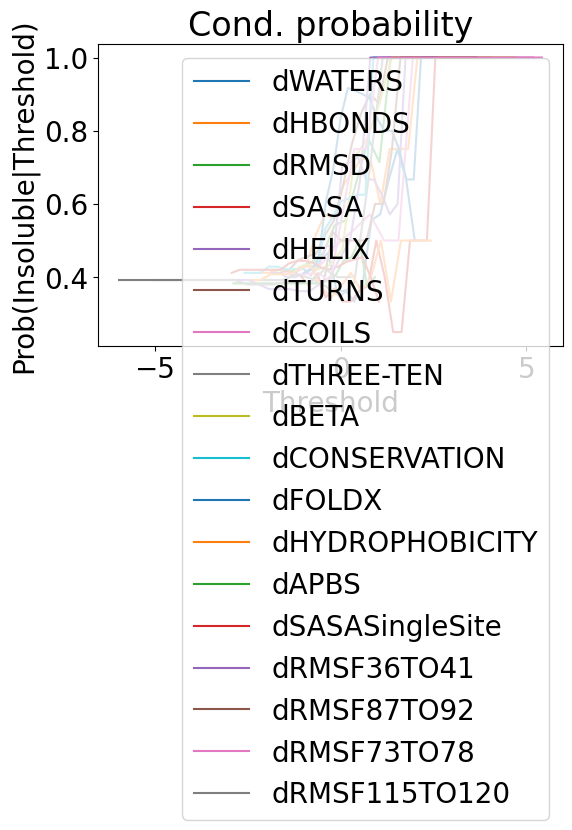

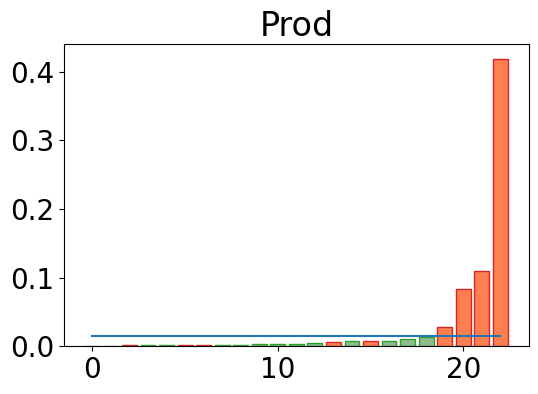

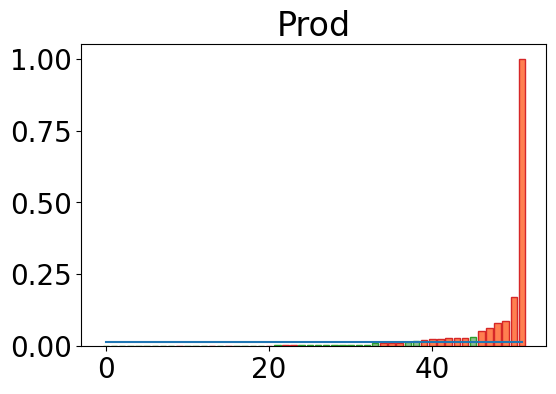

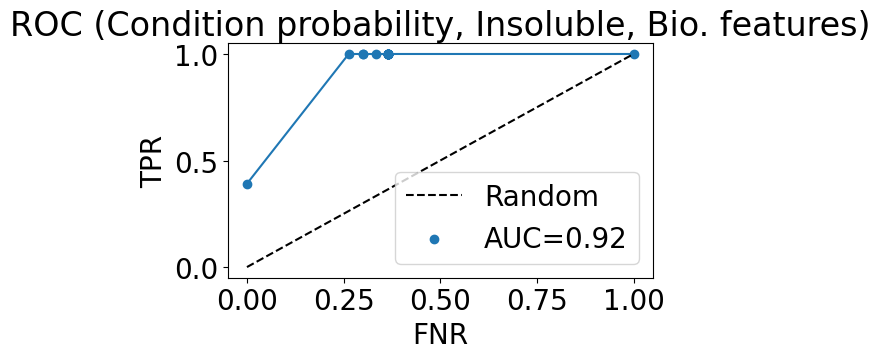

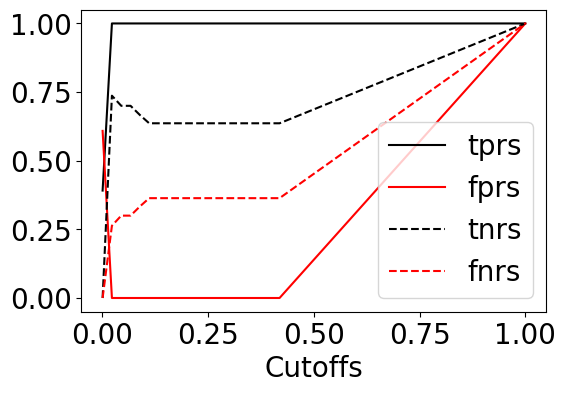

In [25]:
outputs = dU.ProbClassifier(df,tags,display=display,split=True)
cases['Prob'] = outputs

/home/xfang2/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


TESTING  stats
Accuracy(NT) 0.6956521739130435
Precision(NT) 0.625
Recall(NT) 0.5555555555555556
F1 score(NT) 0.5882352941176471
Accuracy(T) 0.6956521739130435
Precision(T) 0.7333333333333333
Recall(T) 0.7857142857142857
F1 score(T) 0.7586206896551724


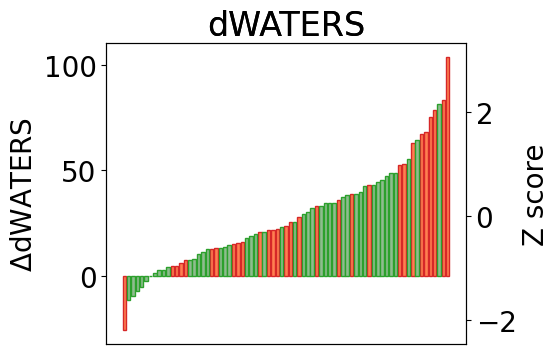

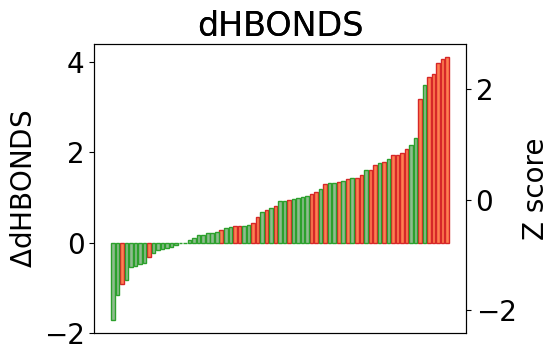

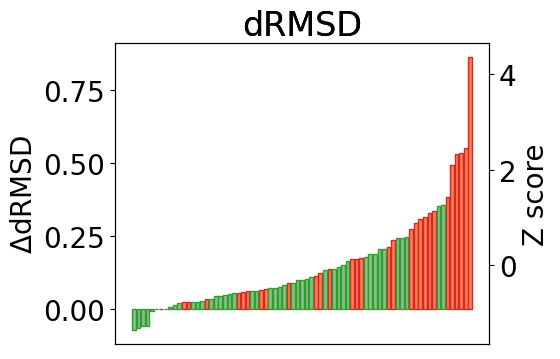

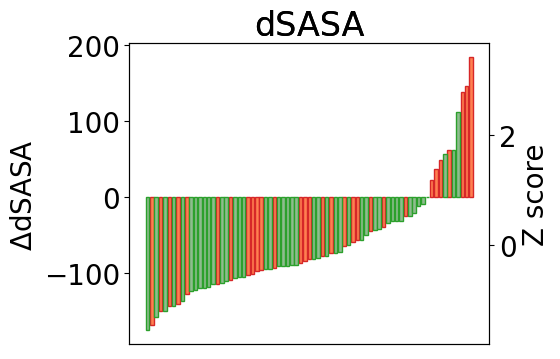

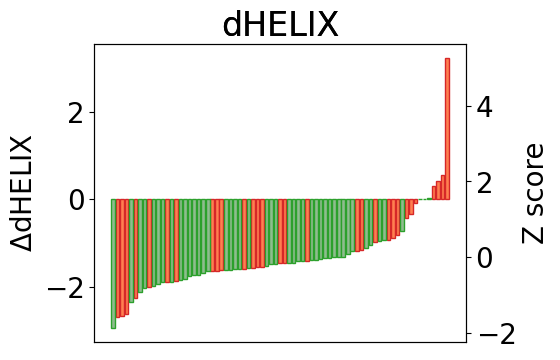

...

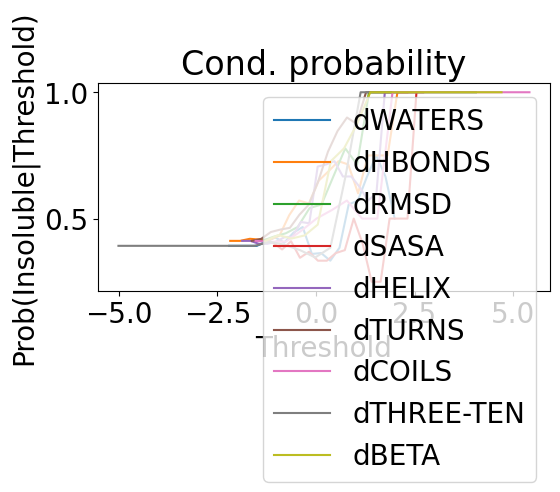

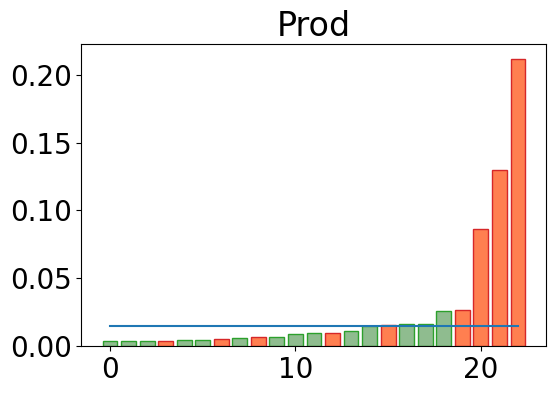

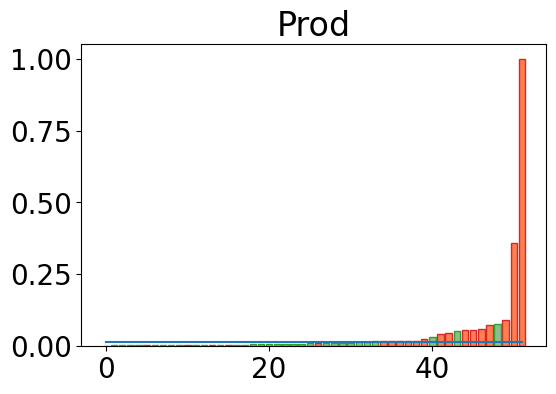

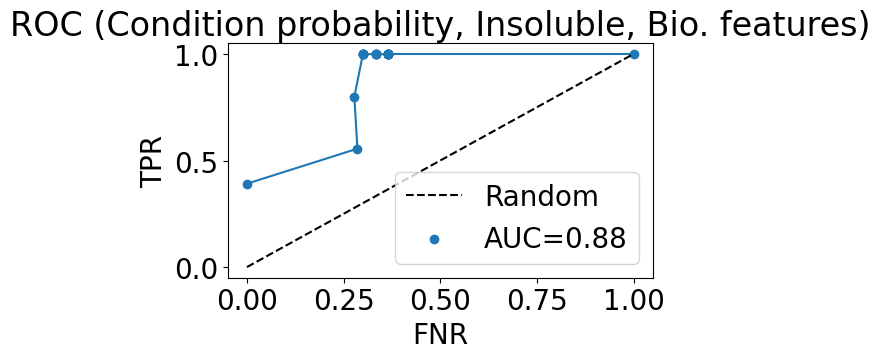

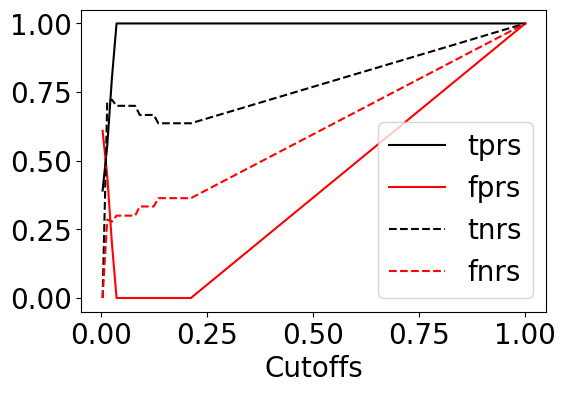

In [26]:
# MD features
# representative ROC and prod
outputs = dU.ProbClassifier(df,tagsMD1,display=display,split=True,bootstrap=False)

Bootstrap with  500


/home/xfang2/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


AUC:  0.7444996308709798
       accT     precT      recT       f1T       acc      prec       rec  \
0  0.695652  0.714286  0.937500  0.810811  0.695652  0.500000  0.142857   
1  0.652174  0.700000  0.875000  0.777778  0.652174  0.333333  0.142857   
2  0.391304  0.368421  0.777778  0.500000  0.391304  0.500000  0.142857   
3  0.565217  0.545455  1.000000  0.705882  0.565217  1.000000  0.090909   
4  0.652174  0.666667  0.933333  0.777778  0.652174  0.500000  0.125000   

         f1  AccTraining  AccTesting  
0  0.222222     0.653846    0.695652  
1  0.200000     0.673077    0.652174  
2  0.222222     0.807692    0.391304  
3  0.166667     0.673077    0.565217  
4  0.200000     0.711538    0.652174  
accT avg:  0.6387826086956528
precT avg:  0.6407266257130935
recT avg:  0.9195524649928675
f1T avg:  0.7473533589159794
acc avg:  0.6387826086956528
prec avg:  0.6559528527028531
rec avg:  0.24136856754356767
f1 avg:  0.3224863190473104
AccTraining avg:  0.6988461538461509
AccTesting avg: 

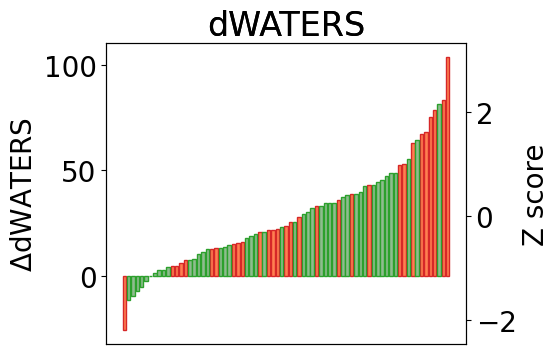

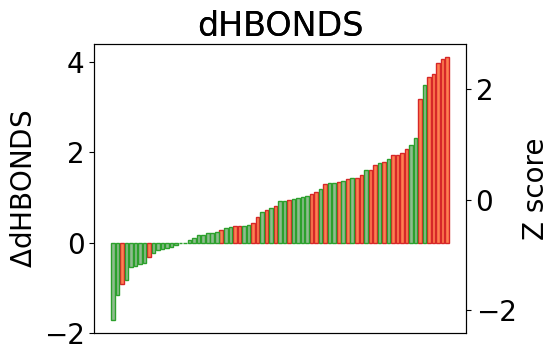

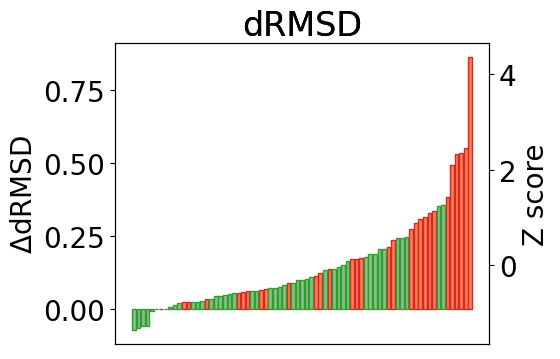

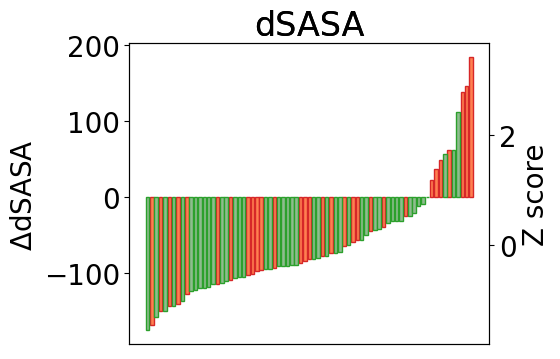

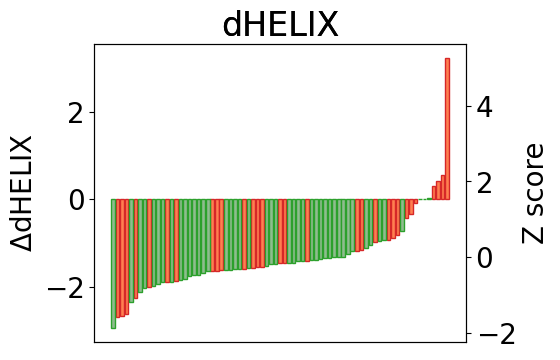

...

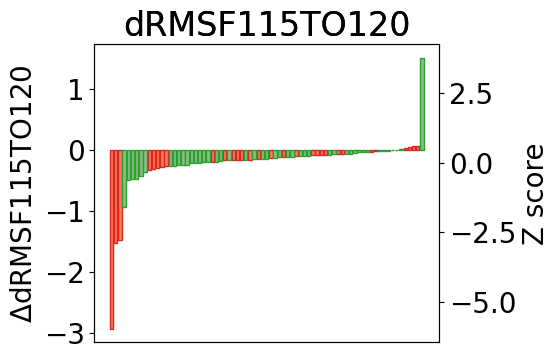

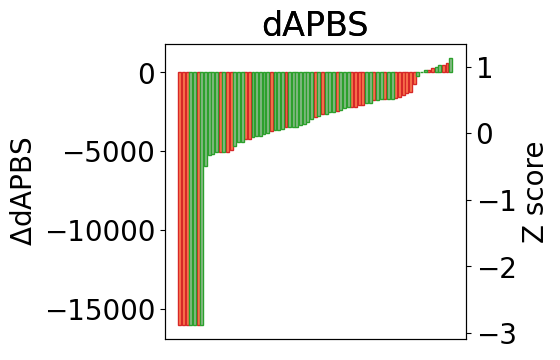

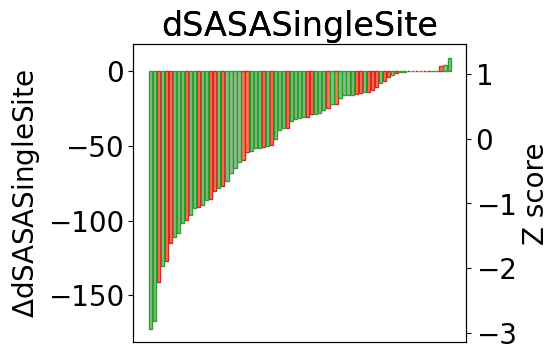

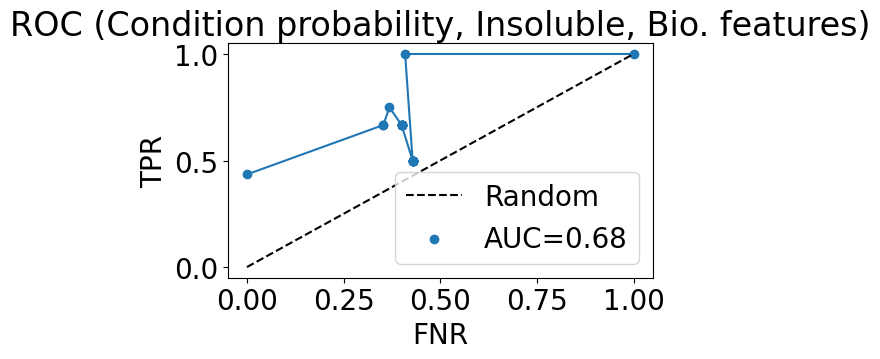

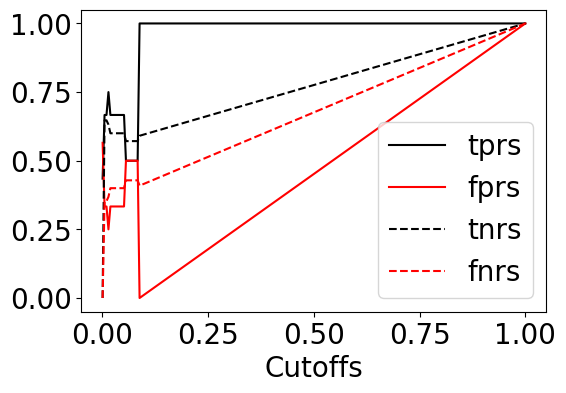

In [27]:
# MD features
outputs = dU.ProbClassifier(df,tagsMD2,display=display,split=True,bootstrap=True)

/home/xfang2/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
/home/xfang2/repos/herg/probUtil.py:225: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


TESTING  stats
Accuracy(NT) 0.782608695652174
Precision(NT) 1.0
Recall(NT) 0.4444444444444444
F1 score(NT) 0.6153846153846154
Accuracy(T) 0.782608695652174
Precision(T) 0.7368421052631579
Recall(T) 1.0
F1 score(T) 0.8484848484848485


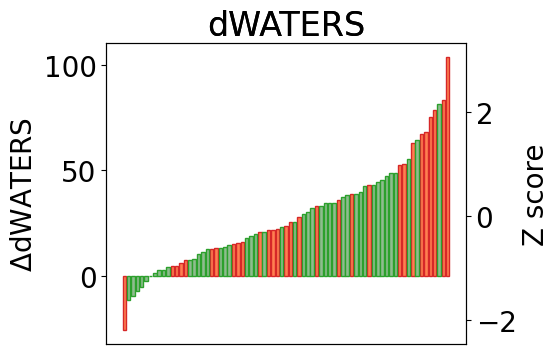

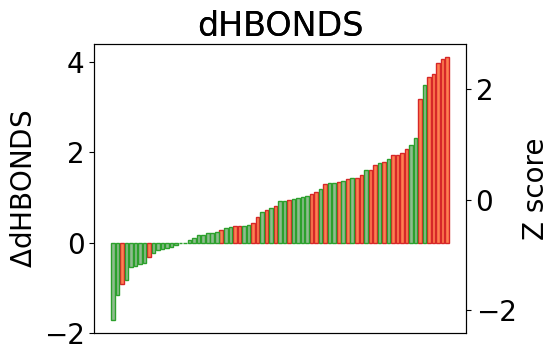

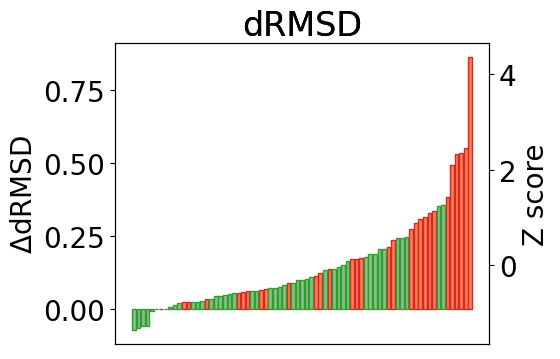

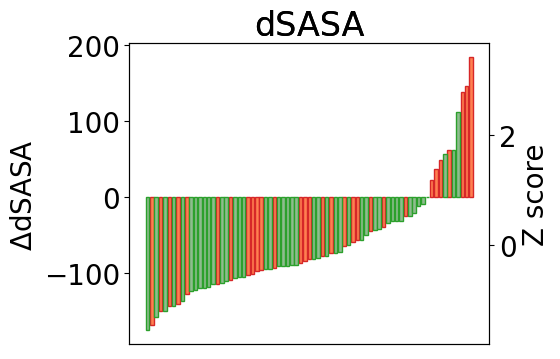

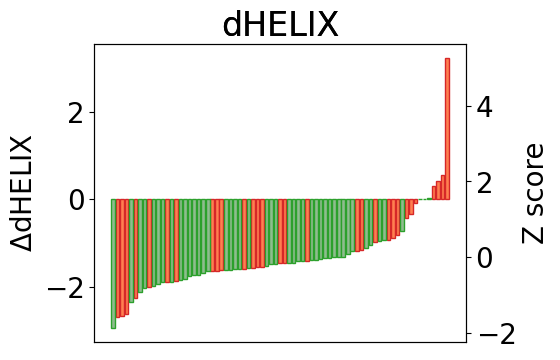

...

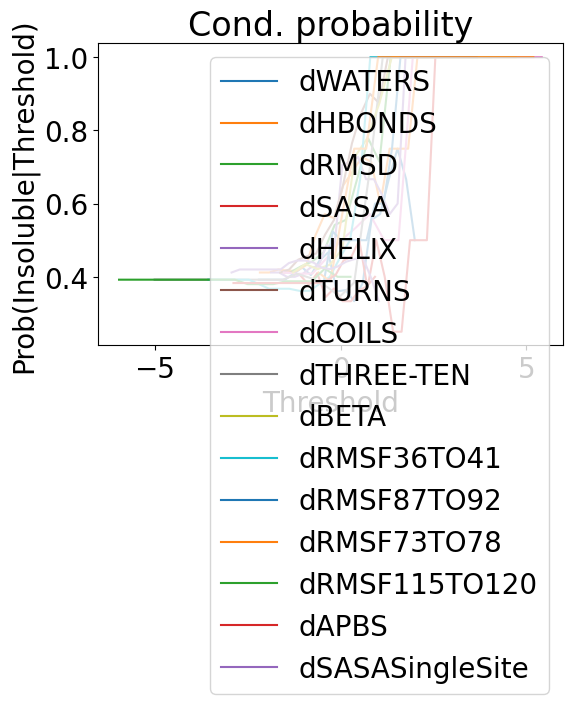

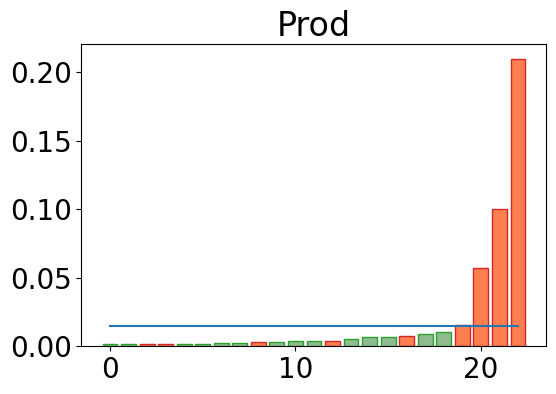

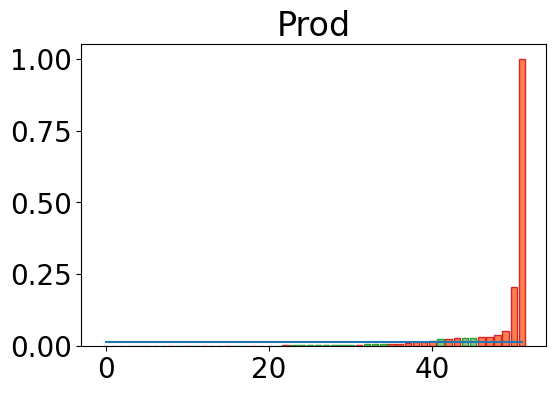

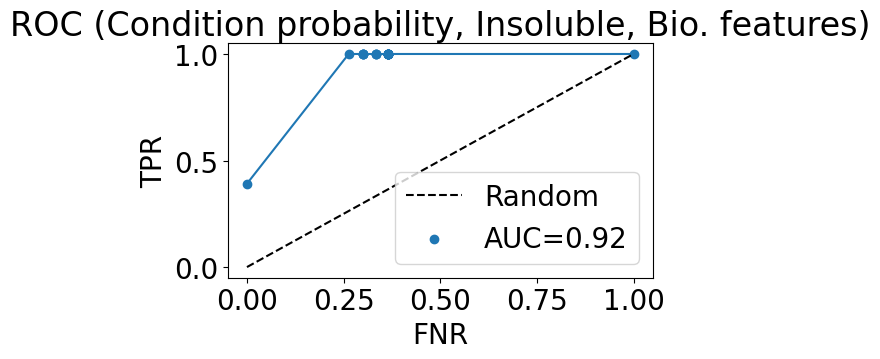

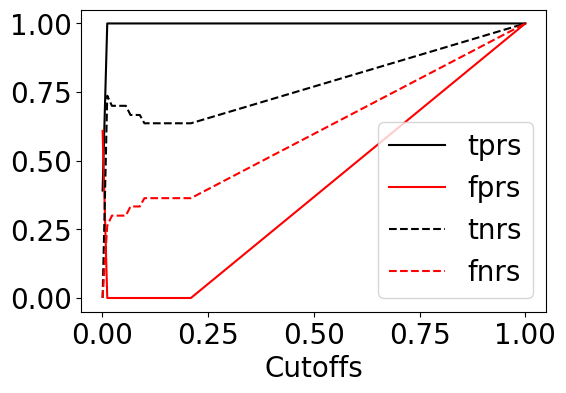

In [28]:
# MD features
# representative ROC and prod
outputs = dU.ProbClassifier(df,tagsMD2,display=display,split=True,bootstrap=False)

Bootstrap with  500


/home/xfang2/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


AUC:  0.5686956465774567
       accT  precT      recT    f1T       acc      prec       rec        f1  \
0  0.391304    0.5  0.071429  0.125  0.391304  0.380952  0.888889  0.533333   
1  0.478261    0.0  0.000000  0.000  0.478261  0.478261  1.000000  0.647059   
2  0.434783    0.0  0.000000  0.000  0.434783  0.434783  1.000000  0.606061   
3  0.434783    0.0  0.000000  0.000  0.434783  0.434783  1.000000  0.606061   
4  0.434783    0.0  0.000000  0.000  0.434783  0.454545  0.909091  0.606061   

   AccTraining  AccTesting  
0     0.423077    0.391304  
1     0.384615    0.478261  
2     0.384615    0.434783  
3     0.403846    0.434783  
4     0.403846    0.434783  
accT avg:  0.3699130434782626
precT avg:  0.09760714285714289
recT avg:  0.02219017077693547
f1T avg:  0.03510405164151291
acc avg:  0.3699130434782626
prec avg:  0.3762257354033783
rec avg:  0.9065063492063494
f1 avg:  0.5249213321134435
AccTraining avg:  0.426153846153846
AccTesting avg:  0.3699130434782626


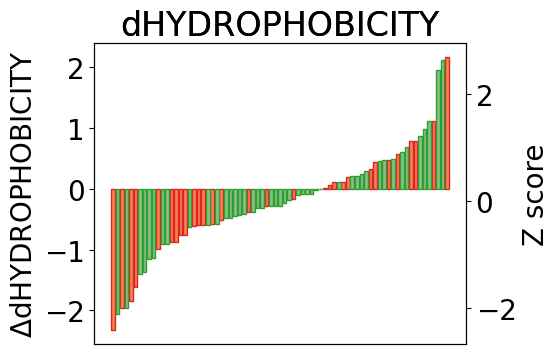

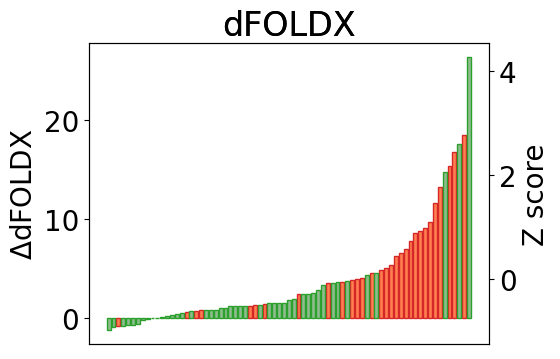

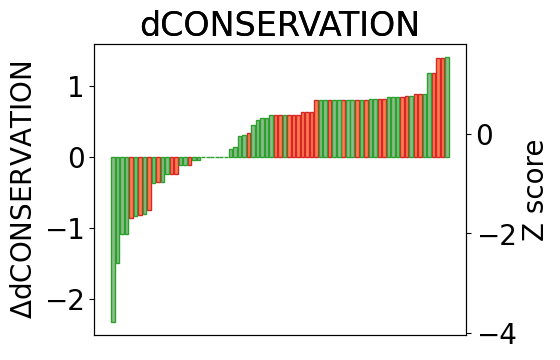

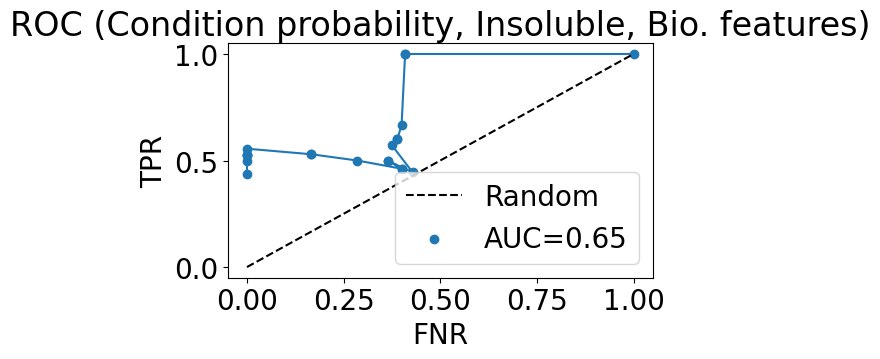

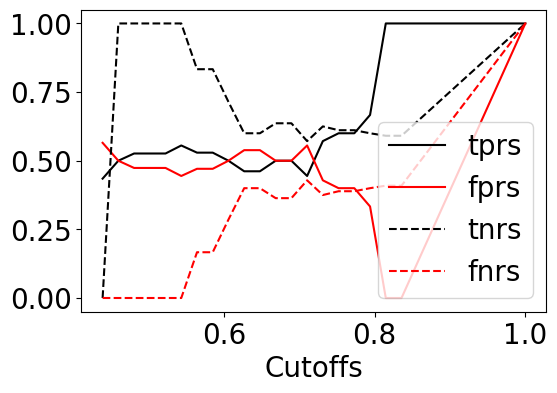

In [29]:
# Bioinformatics features
outputs = dU.ProbClassifier(df,tagsBio,display=display,split=True,bootstrap=True)

/home/xfang2/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


TESTING  stats
Accuracy(NT) 0.391304347826087
Precision(NT) 0.391304347826087
Recall(NT) 1.0
F1 score(NT) 0.5625
Accuracy(T) 0.391304347826087
Precision(T) 0.0
Recall(T) 0.0
F1 score(T) 0.0


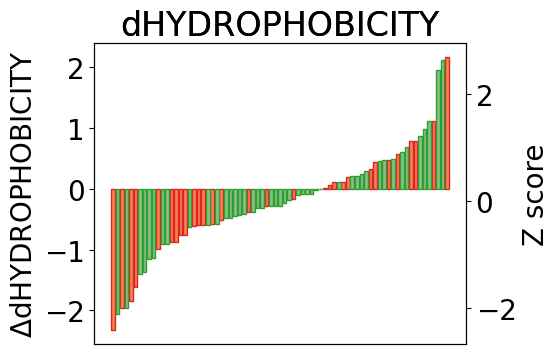

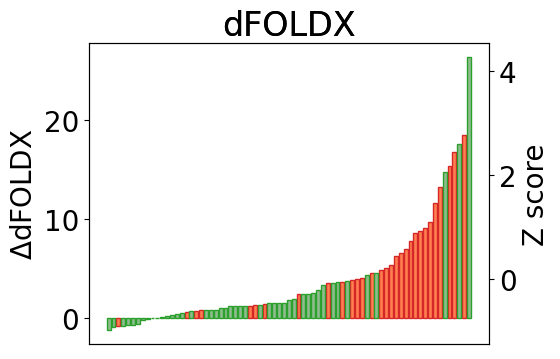

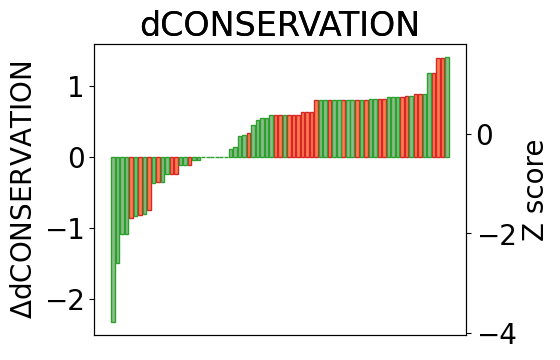

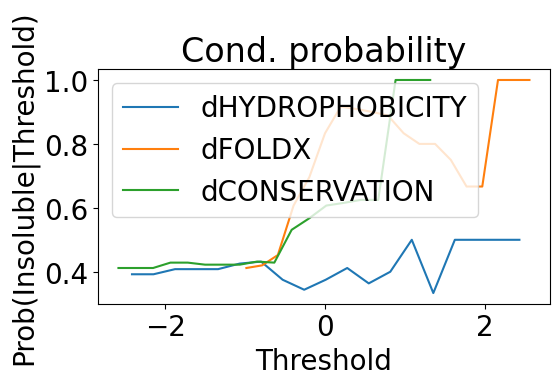

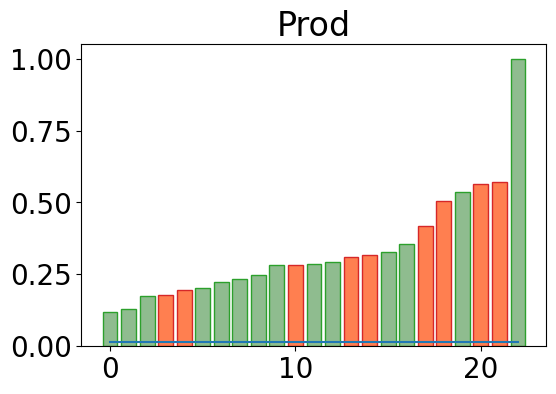

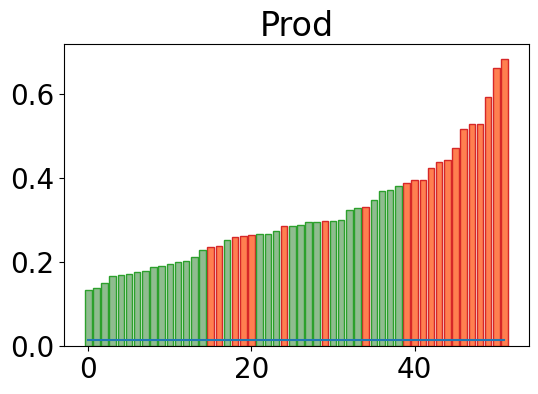

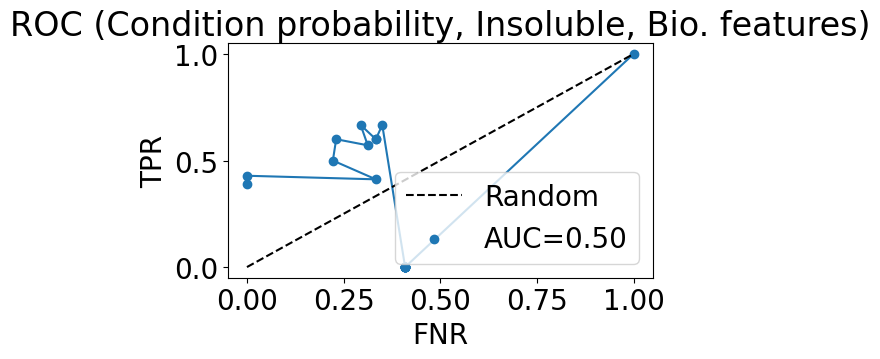

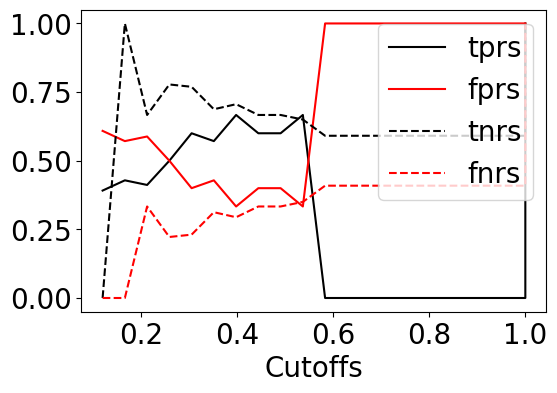

In [30]:
# Bio features
# representative ROC and prod
outputs = dU.ProbClassifier(df,tagsBio,display=display,split=True,bootstrap=False)

Bootstrap with  500


/home/xfang2/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


AUC:  0.7548545159550608
       accT     precT      recT       f1T       acc      prec       rec  \
0  0.608696  0.571429  1.000000  0.727273  0.608696  1.000000  0.181818   
1  0.826087  0.764706  1.000000  0.866667  0.826087  1.000000  0.600000   
2  0.826087  0.866667  0.866667  0.866667  0.826087  0.750000  0.750000   
3  0.608696  0.615385  0.666667  0.640000  0.608696  0.600000  0.545455   
4  0.652174  0.647059  0.846154  0.733333  0.652174  0.666667  0.400000   

         f1  AccTraining  AccTesting  
0  0.307692     0.711538    0.608696  
1  0.750000     0.711538    0.826087  
2  0.750000     0.711538    0.826087  
3  0.571429     0.807692    0.608696  
4  0.500000     0.750000    0.652174  
accT avg:  0.6726956521739154
precT avg:  0.6864659872007558
recT avg:  0.8667828443829992
f1T avg:  0.754820499733579
acc avg:  0.6726956521739154
prec avg:  0.7020638472638481
rec avg:  0.4112855144855152
f1 avg:  0.48196437384649105
AccTraining avg:  0.7545769230769237
AccTesting avg:  

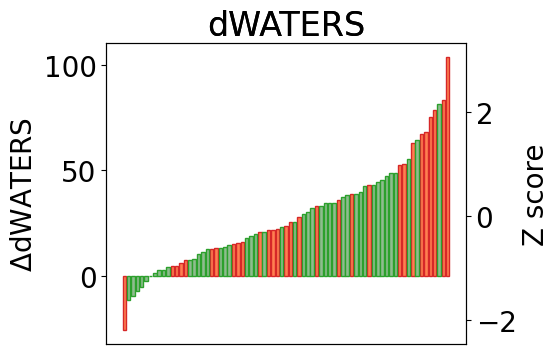

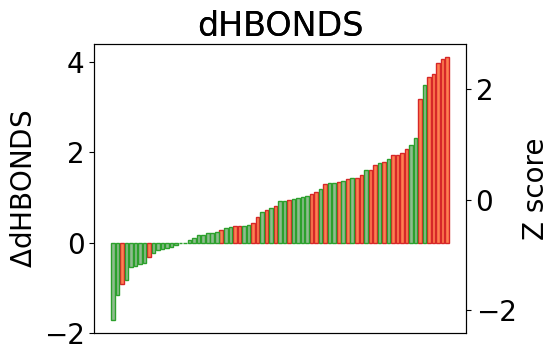

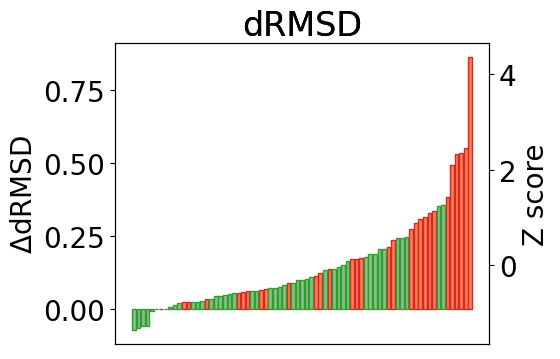

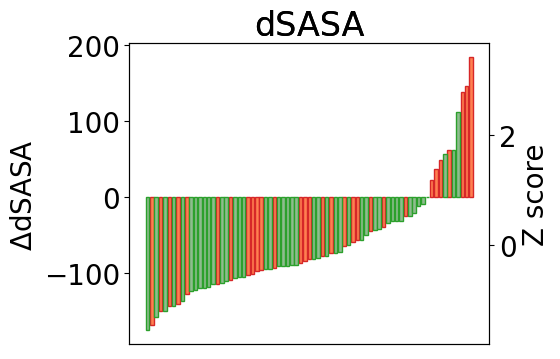

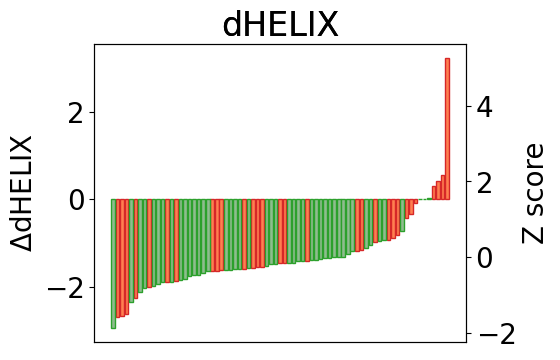

...

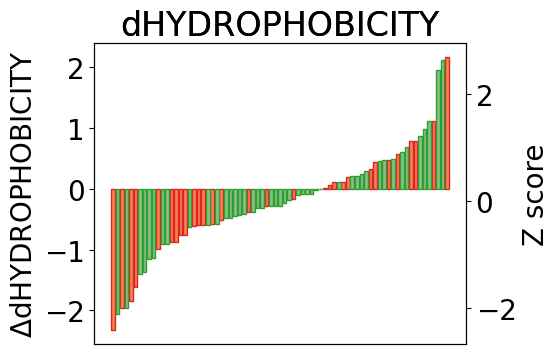

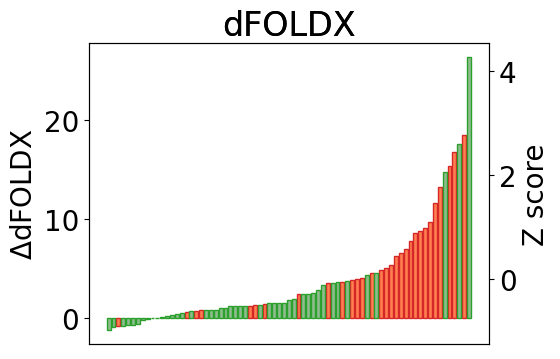

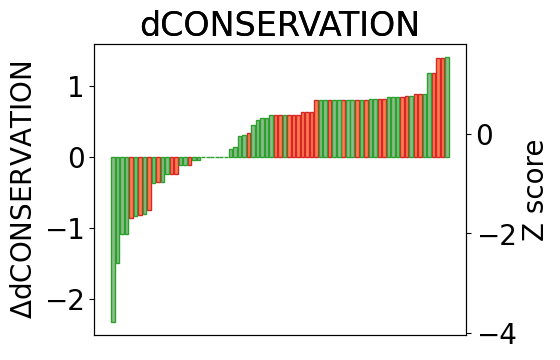

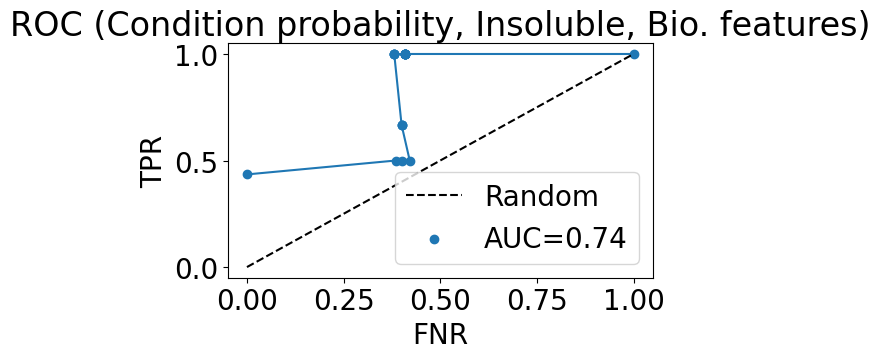

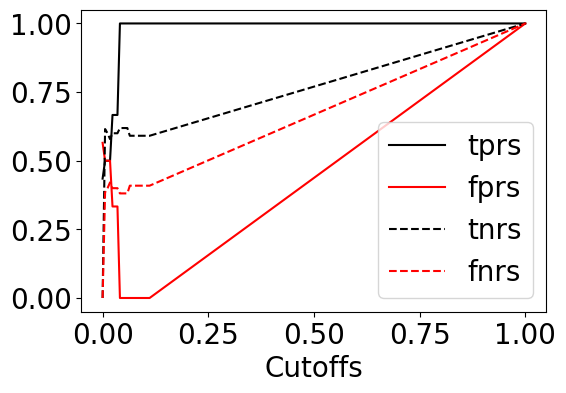

In [31]:
# All features
outputs = dU.ProbClassifier(df,tagsAll1,display=display,split=True,bootstrap=True)

Bootstrap with  500


/home/xfang2/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


AUC:  0.774720412338293
       accT     precT      recT       f1T       acc  prec       rec        f1  \
0  0.521739  0.521739  1.000000  0.685714  0.521739   0.0  0.000000  0.000000   
1  0.739130  0.700000  1.000000  0.823529  0.739130   1.0  0.333333  0.500000   
2  0.782609  0.833333  0.882353  0.857143  0.782609   0.6  0.500000  0.545455   
3  0.652174  0.636364  1.000000  0.777778  0.652174   1.0  0.111111  0.200000   
4  0.565217  0.565217  1.000000  0.722222  0.565217   0.0  0.000000  0.000000   

   AccTraining  AccTesting  
0     0.692308    0.521739  
1     0.711538    0.739130  
2     0.769231    0.782609  
3     0.730769    0.652174  
4     0.673077    0.565217  
accT avg:  0.6545217391304364
precT avg:  0.6500220911646933
recT avg:  0.9378121962746578
f1T avg:  0.7601304236663458
acc avg:  0.6545217391304364
prec avg:  0.7151041014541016
rec avg:  0.2514275835275838
f1 avg:  0.3431297799880387
AccTraining avg:  0.7199999999999971
AccTesting avg:  0.6545217391304364


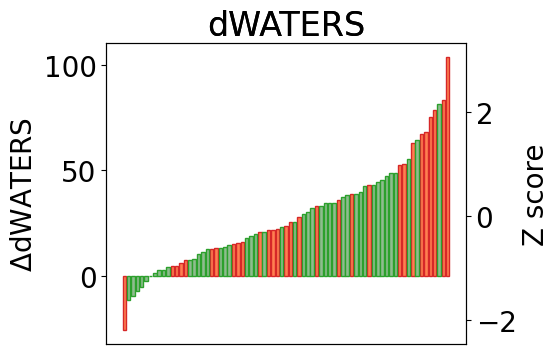

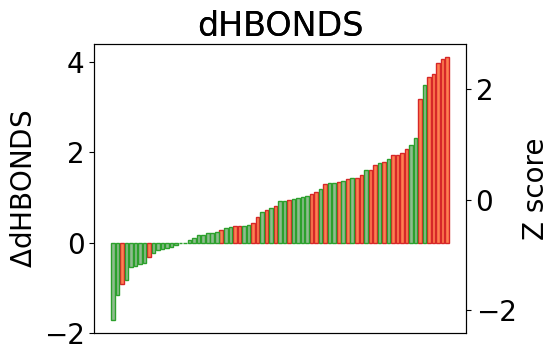

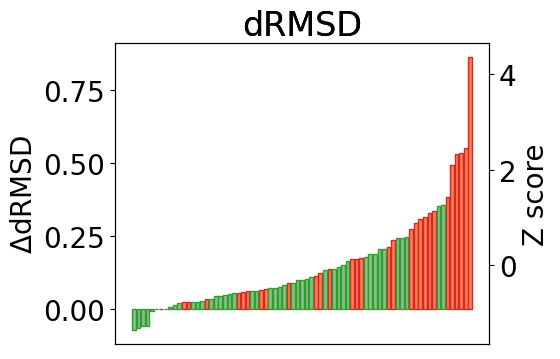

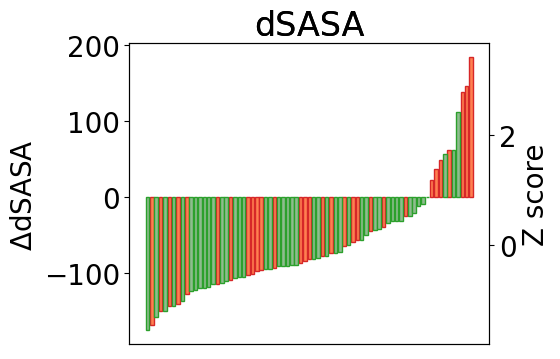

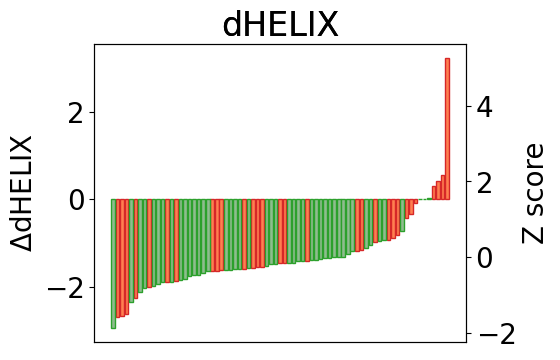

...

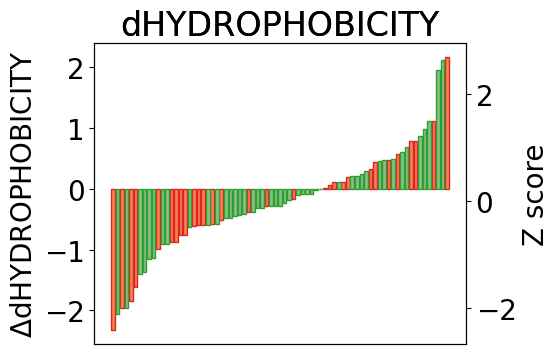

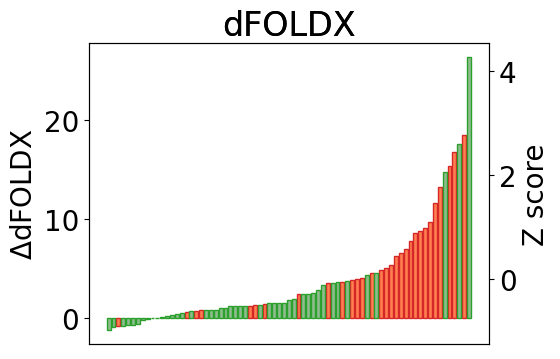

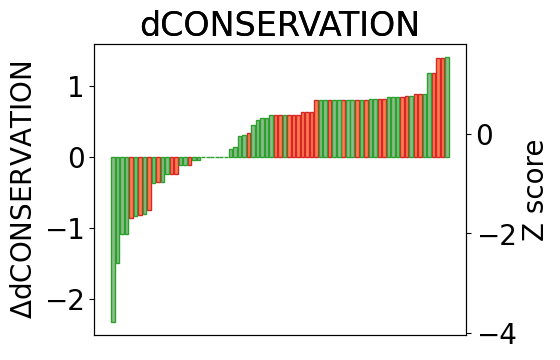

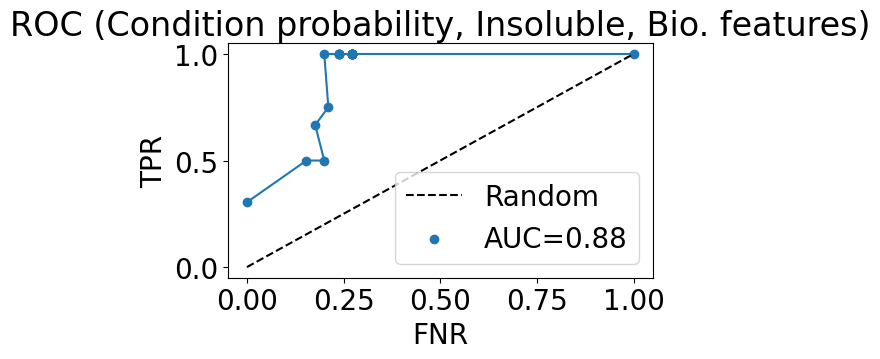

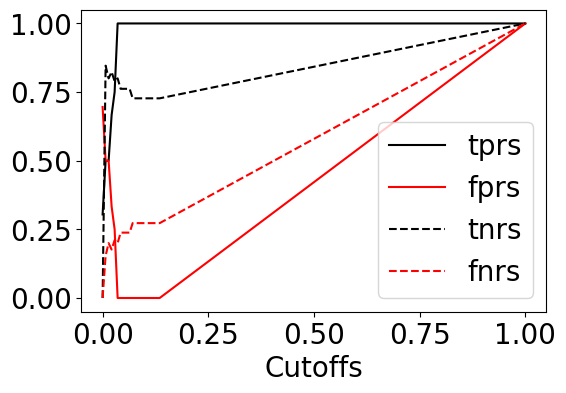

In [32]:
# All features
outputs = dU.ProbClassifier(df,tagsAll2,display=display,split=True,bootstrap=True)

/home/xfang2/anaconda3/lib/python3.9/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)
/home/xfang2/repos/herg/probUtil.py:225: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations. 
  plt.tight_layout()


TESTING  stats
Accuracy(NT) 0.782608695652174
Precision(NT) 1.0
Recall(NT) 0.4444444444444444
F1 score(NT) 0.6153846153846154
Accuracy(T) 0.782608695652174
Precision(T) 0.7368421052631579
Recall(T) 1.0
F1 score(T) 0.8484848484848485


/home/xfang2/repos/herg/probUtil.py:250: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure()


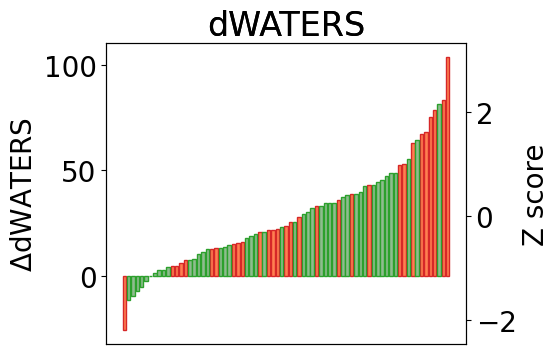

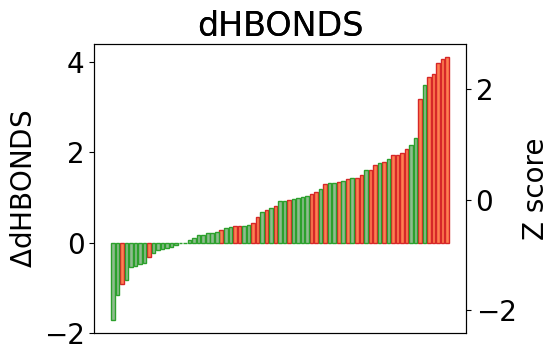

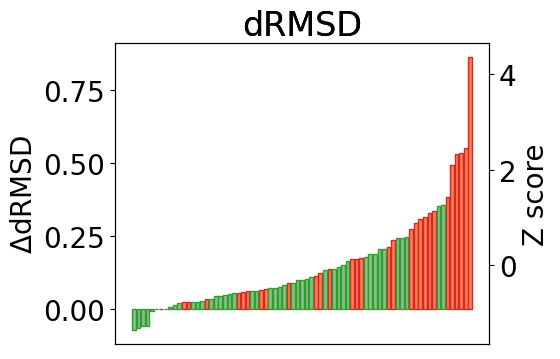

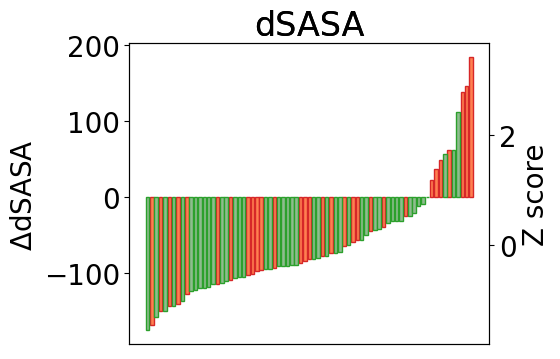

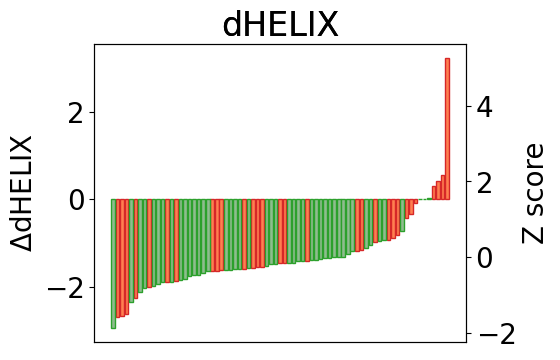

...

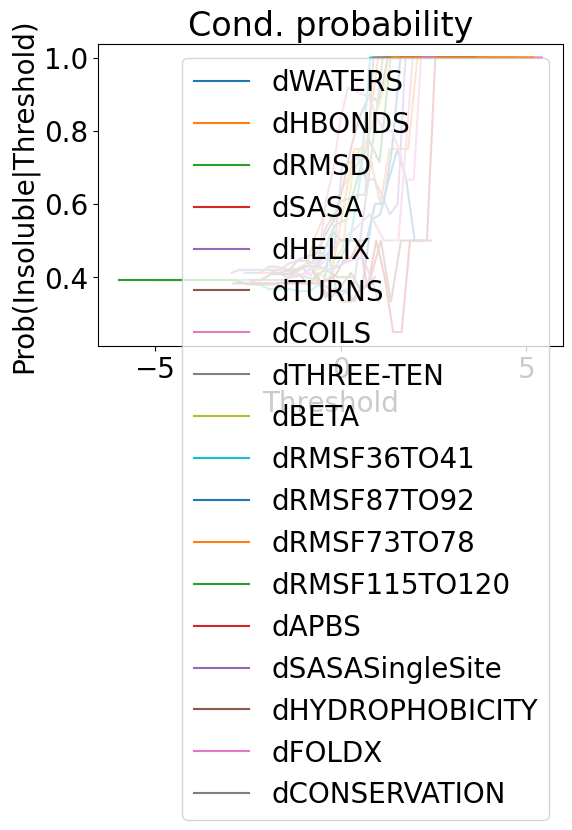

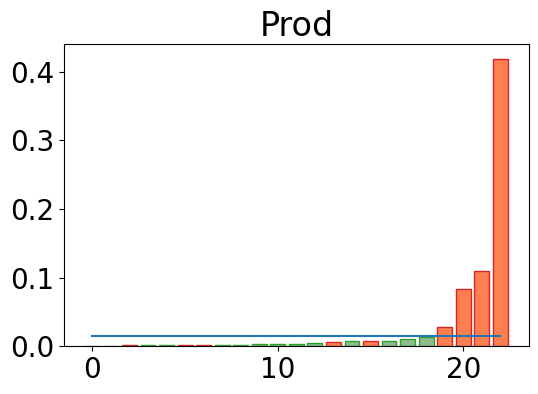

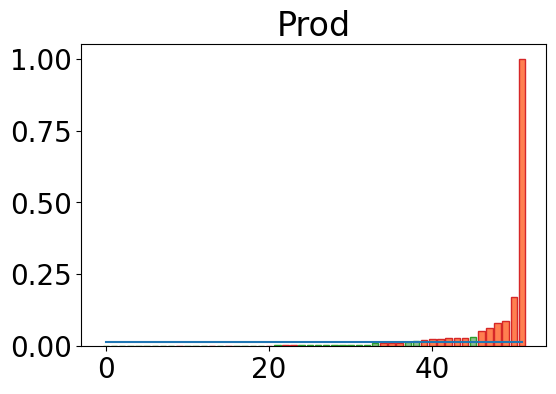

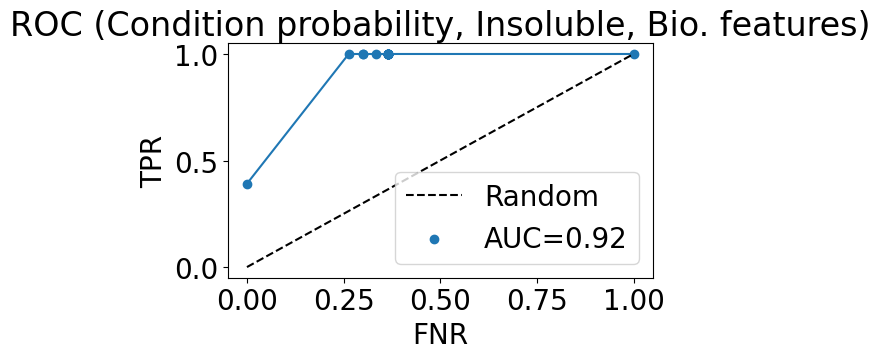

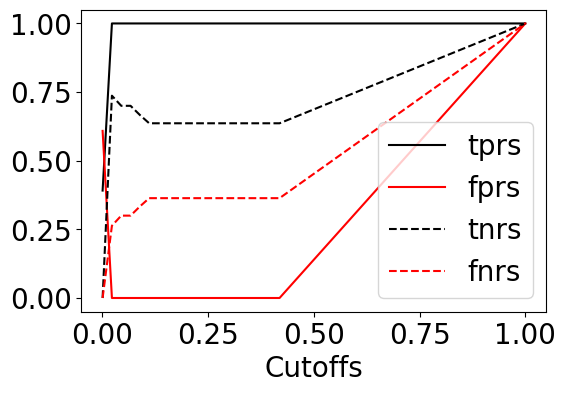

In [33]:
# All features
# representative ROC and prod
outputs = dU.ProbClassifier(df,tagsAll2,display=display,split=True,bootstrap=False)

### Section 2: Build and Apply machine-learning classifiers 
<a id=’section_2’></a>

Outputs
- Metrics for classification performance (precision, recall etc). Terms are defined in Methods of hERG paper
- Cross-validation matrix
- ROC curve
- Most important features used in classifier


In [34]:
# done on Kal's local machine and the end result "rmsf_sub*.txt" is under /feature_sets
regenRMSF=False

if regenRMSF:
    #read a rmsf file to a pandas data frame
    rmsfile = "feature_sets/rmsf-matrix.txt"
    dfrmsf = pd.read_csv(rmsfile, sep="\s+", comment='#')
    dfrmsf.head()

    #extract a subset of rows from rmsf file
    dfrmsf_sub = dfrmsf.loc[89:94,] # actual residues in the sequence 115 to 120 
    dfrmsf_sub2 = dfrmsf.loc[10:15,]# actual residues in the sequence 36 to 41
    dfrmsf_sub3 = dfrmsf.loc[61:66,]# actual residues in the sequence 87 to 92
    dfrmsf_sub4 = dfrmsf.loc[47:52,]# actual residues in the sequence 73 to 78

    #calculate the mean of the rows 89 to 94 for each variant
    dfrmsf_sub_mean = dfrmsf_sub.mean().round(2)
    dfrmsf_sub2_mean = dfrmsf_sub2.mean().round(2)
    dfrmsf_sub3_mean = dfrmsf_sub3.mean().round(2)
    dfrmsf_sub4_mean = dfrmsf_sub4.mean().round(2)

    #dfrmsf_sub_mean
    dfrmsf_sub_mean.shape

    #save the mean of rows 89 to 94 to a file
    dfrmsf_sub_mean.to_csv('feature_sets/rmsf_sub.txt', sep='\t', header=["RMSF115TO120"])
    dfrmsf_sub2_mean.to_csv('feature_sets/rmsf_sub2.txt', sep='\t', header=["RMSF36TO41"])
    dfrmsf_sub3_mean.to_csv('feature_sets/rmsf_sub3.txt', sep='\t', header=["RMSF87TO92"])
    dfrmsf_sub4_mean.to_csv('feature_sets/rmsf_sub4.txt', sep='\t', header=["RMSF73TO78"])

    dfrmsf_sub_mean.columns=['RMSF115TO120']

In [35]:
if 0:
    df['HELIX'] = df['HELIX'].round(2)
    df['TURNS'] = df['TURNS'].round(2)
    df['COILS'] = df['COILS'].round(2)
    df['THREE-TEN'] = df['THREE-TEN'].round(2)
    df['BETA'] = df['BETA'].round(2)
    df['RMSD'] = df['RMSD'].round(2)
    df['HBONDS'] = df['HBONDS'].round()
    df['SASA'] = df['SASA'].round()
    df['WATERS'] = df['WATERS'].round()
    df['FOLDX'] = df['FOLDX'].round(2)
    df['CONSERVATION'] = df['CONSERVATION'].round(2)
    df['HYDROPHOBICITY'] = df['HYDROPHOBICITY'].round(2)
    
    df.head()

In [7]:
features=["HELIX","TURNS","COILS","THREE-TEN","BETA","RMSD","HBONDS","SASA","WATERS","FOLDX","CONSERVATION","HYDROPHOBICITY"]
output = ["TRAFFICKING"]

### some parameters

In [8]:
display=True
random_state=50

In [9]:
mlData={}
clfs=['DT','RF','SVM']

## Decision tree


Example with PAS data

In [10]:
mlData['DT']={}

Decision tree classifier
Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.7391304347826086
                 precision    recall  f1-score   support

non-trafficking       0.88      0.58      0.70        12
    trafficking       0.67      0.91      0.77        11

       accuracy                           0.74        23
      macro avg       0.77      0.75      0.73        23
   weighted avg       0.78      0.74      0.73        23



findfont: Font family ['cursive'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'cursive' not found because none of the following families were found: Apple Chancery, Textile, Zapf Chancery, Sand, Script MT, Felipa, Comic Neue, Comic Sans MS, cursive
findfont: Font family ['cursive'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'cursive' not found because none of the following families were found: Apple Chancery, Textile, Zapf Chancery, Sand, Script MT, Felipa, Comic Neue, Comic Sans MS, cursive


NameError: name 'cases' is not defined

<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

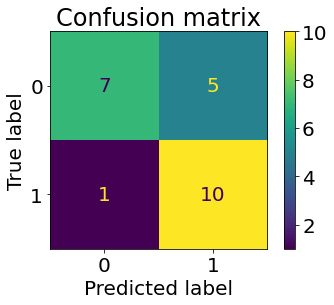

<Figure size 432x288 with 0 Axes>

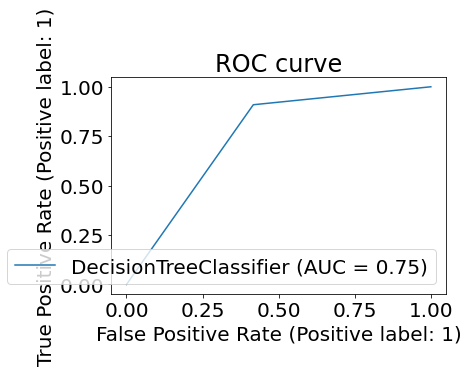

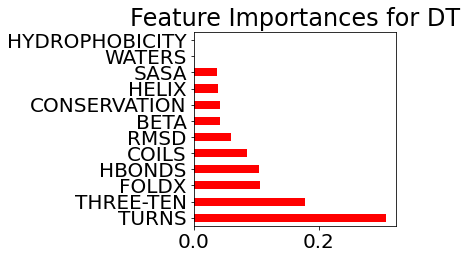

In [11]:
outputs = mlUtil.MLClassifier(df,features,output,classifier="DT", display=display, random_state=random_state) 
cases['DT'] = outputs

Decision tree classifier
Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.34782608695652173
                 precision    recall  f1-score   support

non-trafficking       0.33      0.25      0.29        12
    trafficking       0.36      0.45      0.40        11

       accuracy                           0.35        23
      macro avg       0.35      0.35      0.34        23
   weighted avg       0.34      0.35      0.34        23



<Figure size 432x288 with 0 Axes>

<Figure size 432x288 with 0 Axes>

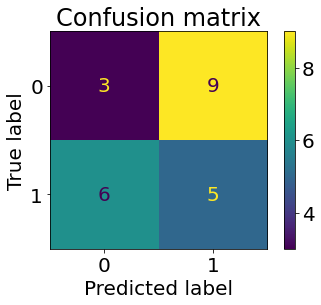

<Figure size 432x288 with 0 Axes>

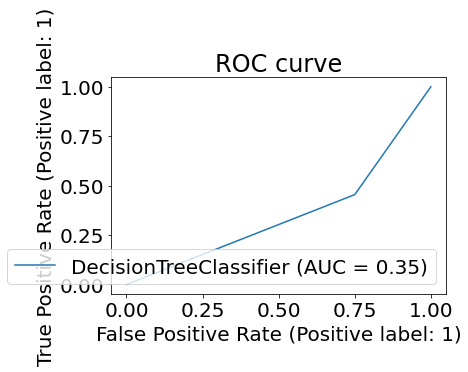

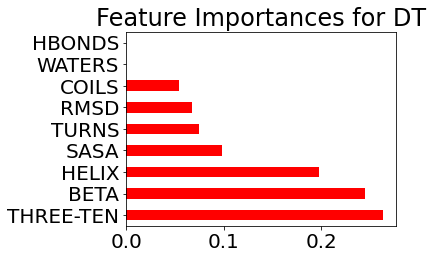

In [12]:
# MD 
outputs = mlUtil.MLClassifier(df,tagsMD1,output,classifier="DT", display=display, random_state=random_state) 

Decision tree classifier
Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.5652173913043478
                 precision    recall  f1-score   support

non-trafficking       0.67      0.33      0.44        12
    trafficking       0.53      0.82      0.64        11

       accuracy                           0.57        23
      macro avg       0.60      0.58      0.54        23
   weighted avg       0.60      0.57      0.54        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be remov

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

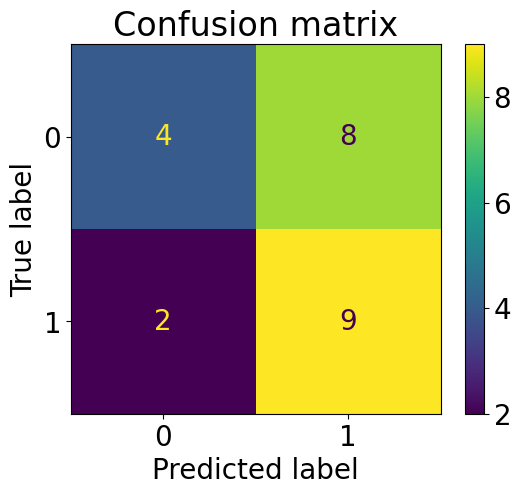

<Figure size 640x480 with 0 Axes>

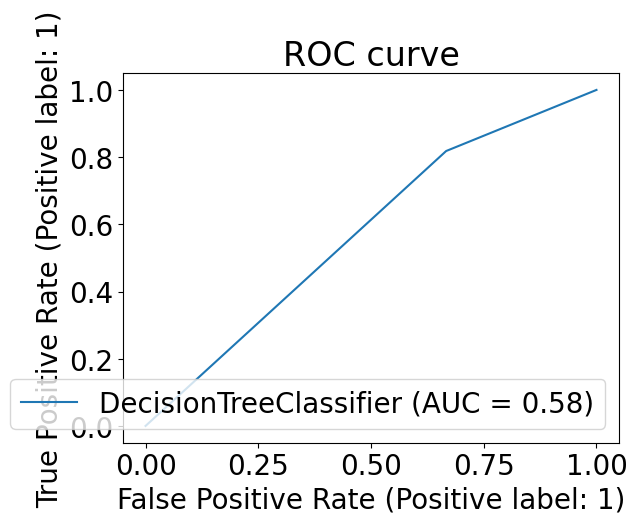

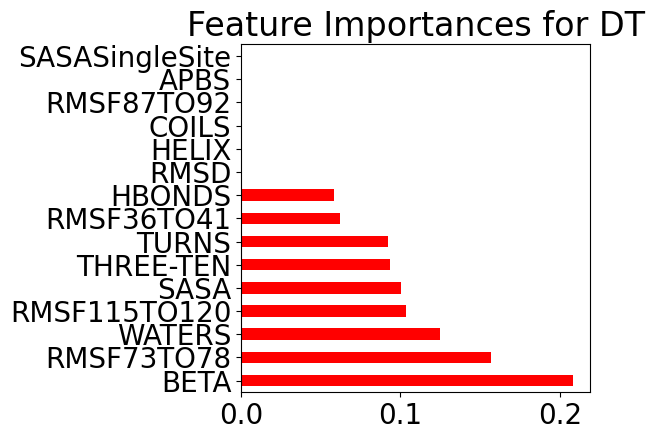

In [11]:
# MD 
outputs = mlUtil.MLClassifier(df,tagsMD2,output,classifier="DT", display=display, random_state=random_state) 
mlData['DT']['MD']=outputs

Decision tree classifier
Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.6086956521739131
                 precision    recall  f1-score   support

non-trafficking       1.00      0.25      0.40        12
    trafficking       0.55      1.00      0.71        11

       accuracy                           0.61        23
      macro avg       0.78      0.62      0.55        23
   weighted avg       0.78      0.61      0.55        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be remov

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

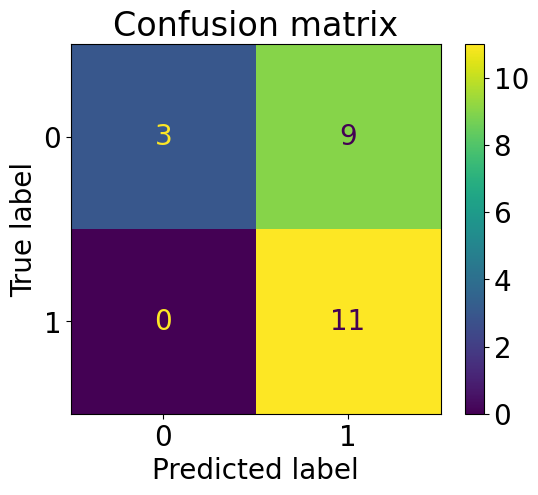

<Figure size 640x480 with 0 Axes>

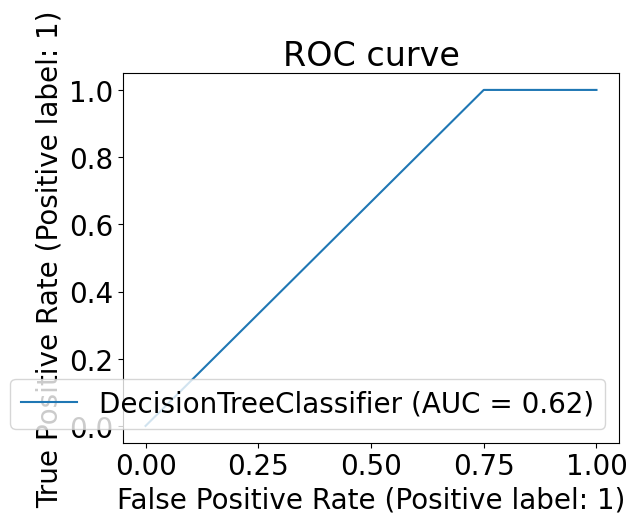

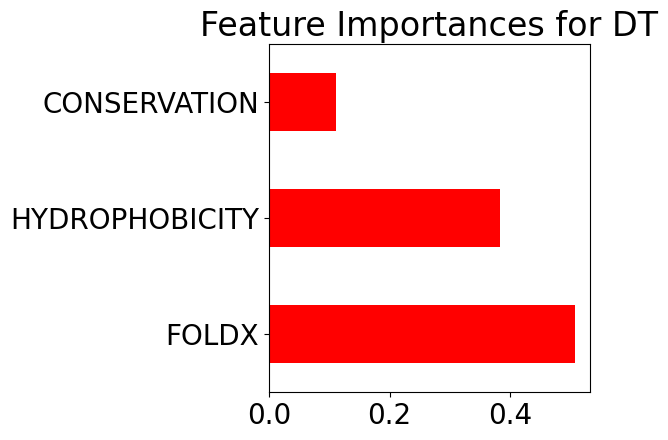

In [12]:
# Bio
outputs = mlUtil.MLClassifier(df,tagsBio,output,classifier="DT", display=display, random_state=random_state) 
mlData['DT']['Bio']=outputs

Decision tree classifier
Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.5652173913043478
                 precision    recall  f1-score   support

non-trafficking       0.67      0.33      0.44        12
    trafficking       0.53      0.82      0.64        11

       accuracy                           0.57        23
      macro avg       0.60      0.58      0.54        23
   weighted avg       0.60      0.57      0.54        23



<Figure size 600x400 with 0 Axes>

<Figure size 600x400 with 0 Axes>

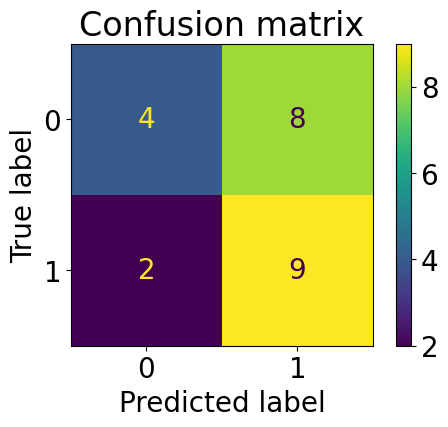

<Figure size 600x400 with 0 Axes>

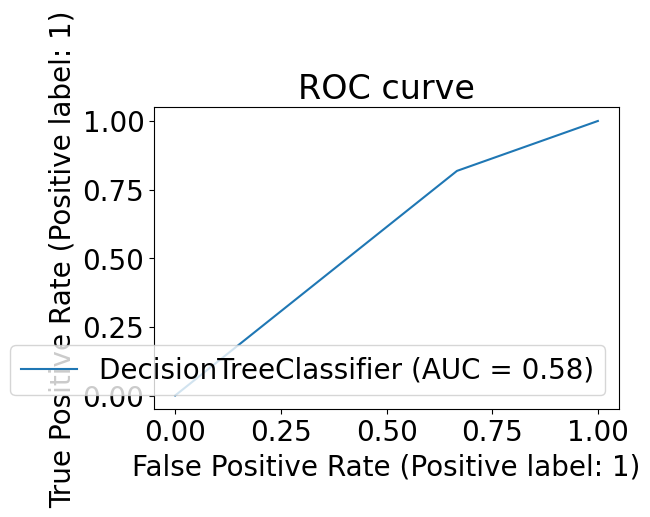

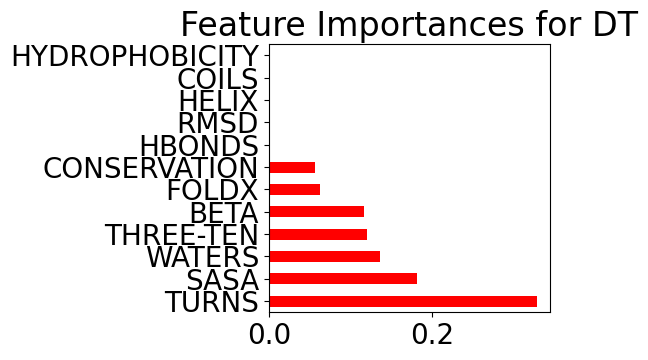

In [44]:
# All
outputs = mlUtil.MLClassifier(df,tagsAll1,output,classifier="DT", display=display, random_state=random_state) 

Decision tree classifier
Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.5652173913043478
                 precision    recall  f1-score   support

non-trafficking       0.62      0.42      0.50        12
    trafficking       0.53      0.73      0.62        11

       accuracy                           0.57        23
      macro avg       0.58      0.57      0.56        23
   weighted avg       0.58      0.57      0.56        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be remov

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

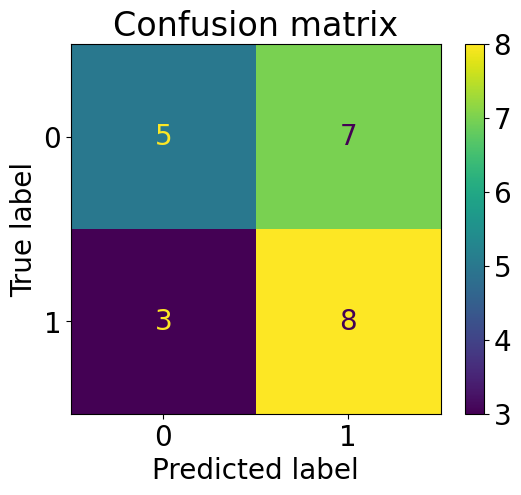

<Figure size 640x480 with 0 Axes>

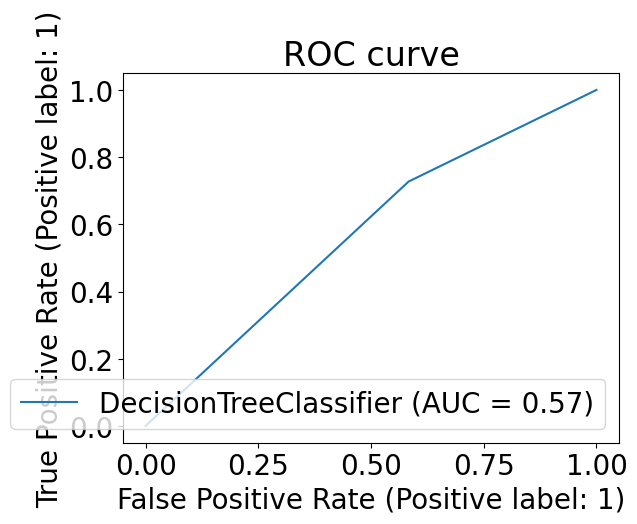

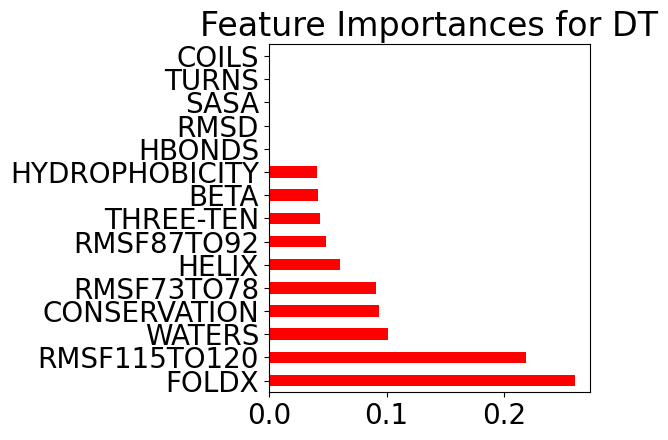

In [13]:
# All
outputs = mlUtil.MLClassifier(df,tagsAll2,output,classifier="DT", display=display, random_state=random_state) 
mlData['DT']['All']=outputs

#### plot ROC curves

findfont: Font family ['cursive'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'cursive' not found because none of the following families were found: Apple Chancery, Textile, Zapf Chancery, Sand, Script MT, Felipa, Comic Neue, Comic Sans MS, cursive
findfont: Font family ['cursive'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'cursive' not found because none of the following families were found: Apple Chancery, Textile, Zapf Chancery, Sand, Script MT, Felipa, Comic Neue, Comic Sans MS, cursive


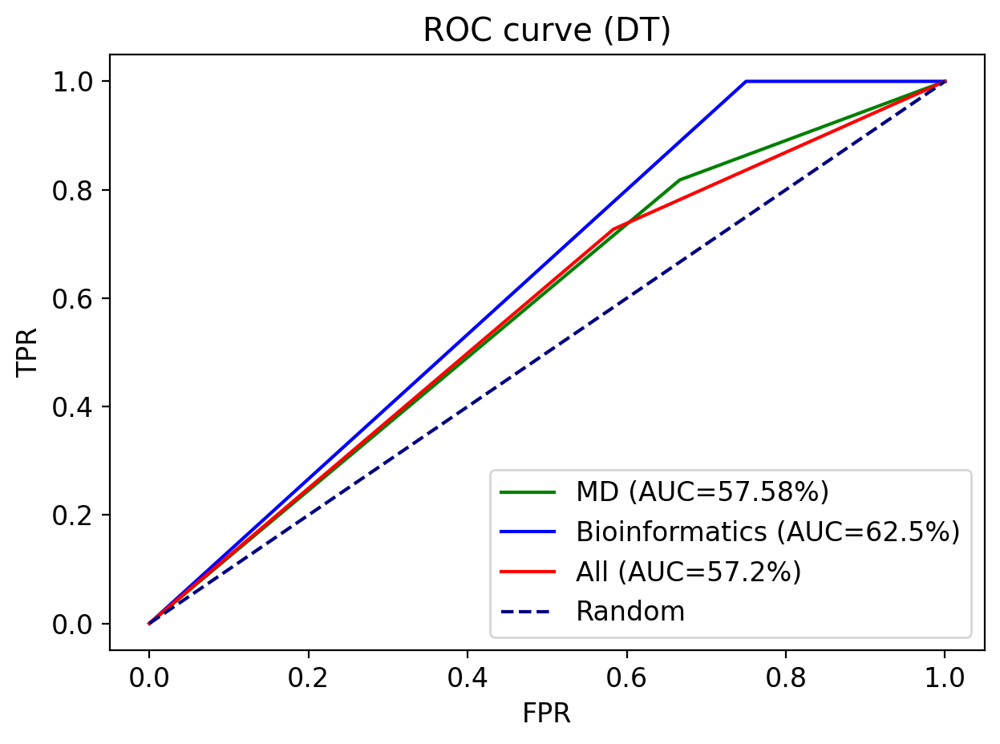

In [14]:
# compare different feature sets
labels=['MD','Bioinformatics','All']
cols=['green','blue','red']

#rcParams['figure.figsize']=7,4
rcParams['font.size']=12
rcParams['figure.dpi']=200
plt.figure()
plt.title('ROC curve (DT)')
for i,key in enumerate(mlData['DT'].keys()):
    fpr,tpr,auc=mlData['DT'][key]['fprs'], mlData['DT'][key]['tprs'], mlData['DT'][key]['auc']
    auc=np.around(auc*100,decimals=2)
    plt.plot(fpr,tpr,label="{} (AUC={}%)".format(labels[i],auc),color=cols[i])

plt.plot([0, 1], [0, 1], color='navy', linestyle='--', label='Random')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.legend(loc=4)
plt.tight_layout()
plt.savefig('roc_DT.png')
rcParams['figure.dpi']=100

/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anacond

findfont: Generic family 'cursive' not found because none of the following families were found: Apple Chancery, Textile, Zapf Chancery, Sand, Script MT, Felipa, Comic Neue, Comic Sans MS, cursive


Decision tree classifier
Training sample accuracy
Overall accuracy  0.9423076923076923
Test Accuracy
Overall accuracy  0.5652173913043478
                 precision    recall  f1-score   support

non-trafficking       0.56      0.75      0.64        12
    trafficking       0.57      0.36      0.44        11

       accuracy                           0.57        23
      macro avg       0.57      0.56      0.54        23
   weighted avg       0.57      0.57      0.55        23

Decision tree classifier
Training sample accuracy
Overall accuracy  0.7115384615384616
Test Accuracy
Overall accuracy  0.6956521739130435
                 precision    recall  f1-score   support

non-trafficking       0.73      0.67      0.70        12
    trafficking       0.67      0.73      0.70        11

       accuracy                           0.70        23
      macro avg       0.70      0.70      0.70        23
   weighted avg       0.70      0.70      0.70        23

Decision tree classifier
Training 

/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anacond

Training sample accuracy
Overall accuracy  0.8269230769230769
Test Accuracy
Overall accuracy  0.5217391304347826
                 precision    recall  f1-score   support

non-trafficking       0.53      0.67      0.59        12
    trafficking       0.50      0.36      0.42        11

       accuracy                           0.52        23
      macro avg       0.52      0.52      0.51        23
   weighted avg       0.52      0.52      0.51        23

Decision tree classifier
Training sample accuracy
Overall accuracy  0.9615384615384616
Test Accuracy
Overall accuracy  0.4782608695652174
                 precision    recall  f1-score   support

non-trafficking       0.50      0.33      0.40        12
    trafficking       0.47      0.64      0.54        11

       accuracy                           0.48        23
      macro avg       0.48      0.48      0.47        23
   weighted avg       0.48      0.48      0.47        23

Decision tree classifier
Training sample accuracy
Overall a

/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anacond

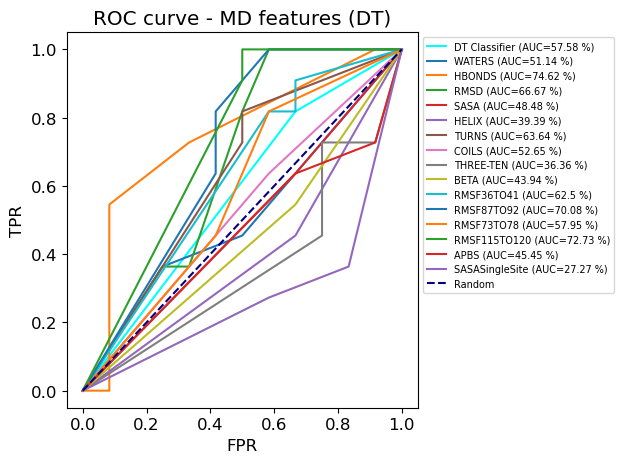

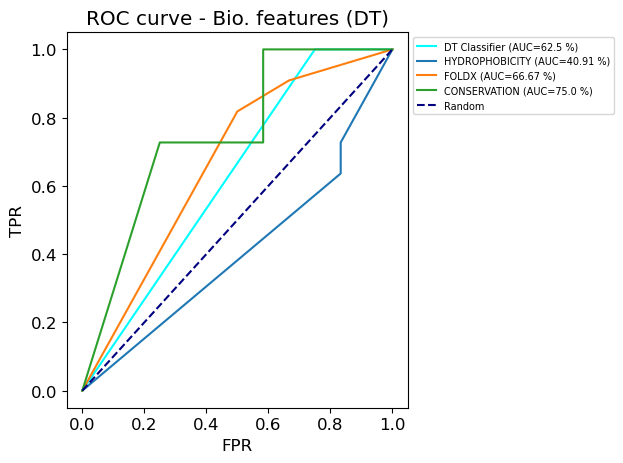

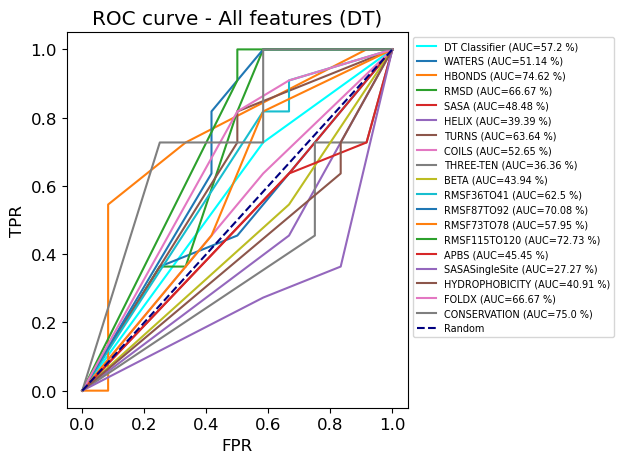

In [15]:
# plot individual features for different feature sets
featSets=[tagsMD2,tagsBio,tagsAll2]
keys=['MD','Bio','All']
labels=['MD', 'Bio.', 'All']
clf='DT'
rcParams['figure.dpi']=100

for i,key in enumerate(keys):
    feats=featSets[i]    
    plt.figure()
    ax=plt.subplot()
    ax.set_xlabel('FPR')
    ax.set_ylabel('TPR')
    ax.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
    ax.set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
    ax.set_title('ROC curve - {} features ({})'.format(labels[i], clf))

    # plot classifier ROC
    tpr, fpr, auc = mlData[clf][key]['tprs'], mlData[clf][key]['fprs'], mlData[clf][key]['auc']
    auc=np.around(auc*100,decimals=2)
    plt.plot (fpr, tpr, color='cyan', label="{} Classifier (AUC={} %)".format(clf,auc))

    # plot feature ROC
    for feat in feats:
        outputs = mlUtil.MLClassifier(df,[feat],output,classifier=clf, display=False, random_state=random_state)
        tpr, fpr, auc = outputs['tprs'], outputs['fprs'], outputs['auc']
        auc=np.around(auc*100,decimals=2)
        plt.plot(fpr,tpr,label="{} (AUC={} %)".format(feat, auc))

    # plot random line
    plt.plot([0, 1], [0, 1], color='navy', linestyle='--', label='Random')
    plt.legend(bbox_to_anchor=(1,1), loc='upper left',fontsize=7)
    plt.tight_layout()
    plt.savefig('{}_indiFeature_{}.png'.format(clf,key))

rcParams['figure.dpi']=100

## Random forest classifier 

In [16]:
mlData['RF']={}

k-fold crossvalidation results
[1.         0.5        0.75       0.75       0.625      0.85714286
 0.71428571 0.57142857 0.71428571 0.71428571] 

results mean
0.7196428571428571 

Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.7391304347826086
                 precision    recall  f1-score   support

non-trafficking       0.88      0.58      0.70        12
    trafficking       0.67      0.91      0.77        11

       accuracy                           0.74        23
      macro avg       0.77      0.75      0.73        23
   weighted avg       0.78      0.74      0.73        23



<Figure size 600x400 with 0 Axes>

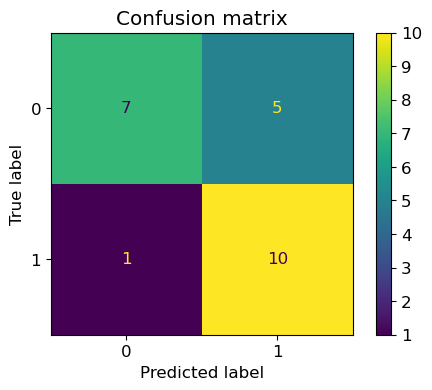

<Figure size 600x400 with 0 Axes>

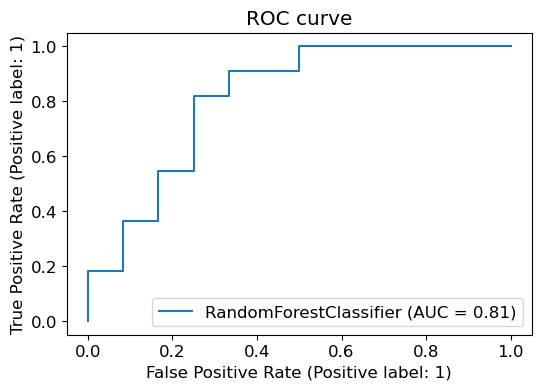

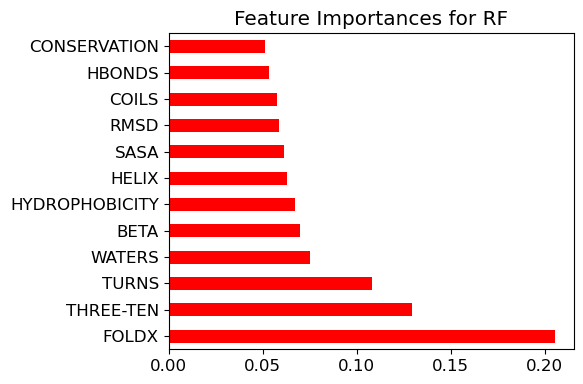

In [49]:
outputs = mlUtil.MLClassifier(df,features,output,classifier="RF",display=display) 
cases['RF'] = outputs


k-fold crossvalidation results
[0.625      0.75       0.75       0.625      0.625      1.
 0.42857143 0.57142857 0.57142857 0.71428571] 

results mean
0.6660714285714285 

Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.6521739130434783
                 precision    recall  f1-score   support

non-trafficking       0.83      0.42      0.56        12
    trafficking       0.59      0.91      0.71        11

       accuracy                           0.65        23
      macro avg       0.71      0.66      0.63        23
   weighted avg       0.72      0.65      0.63        23



<Figure size 600x400 with 0 Axes>

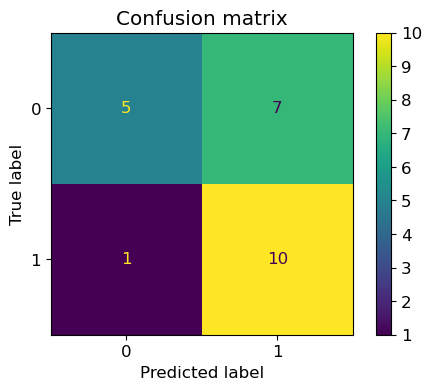

<Figure size 600x400 with 0 Axes>

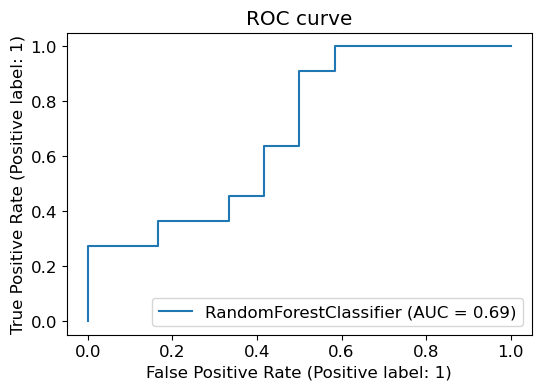

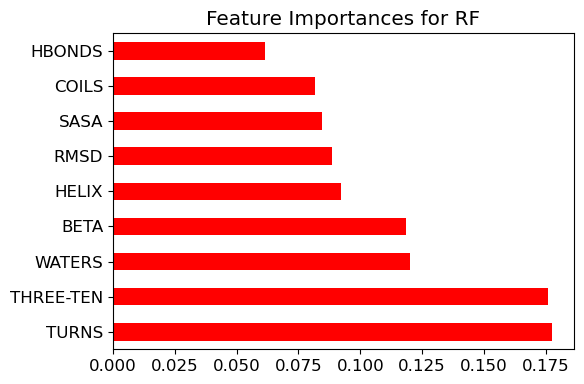

In [50]:
# MD
outputs = mlUtil.MLClassifier(df,tagsMD1,output,classifier="RF",display=display) 

k-fold crossvalidation results
[0.75       0.875      0.75       0.625      0.625      1.
 0.57142857 0.57142857 0.42857143 0.71428571] 

results mean
0.6910714285714286 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  1.0
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6956521739130435


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       1.00      0.42      0.59        12
    trafficking       0.61      1.00      0.76        11

       accuracy                           0.70        23
      macro avg       0.81      0.71      0.67        23
   weighted avg       0.81      0.70      0.67        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


<Figure size 640x480 with 0 Axes>

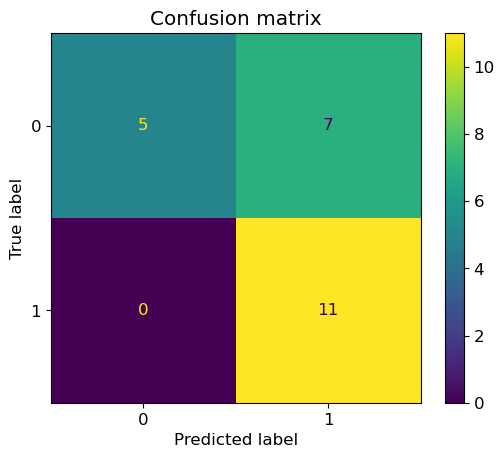

<Figure size 640x480 with 0 Axes>

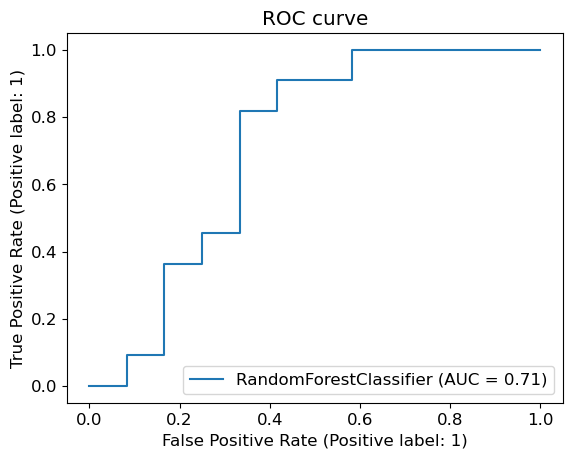

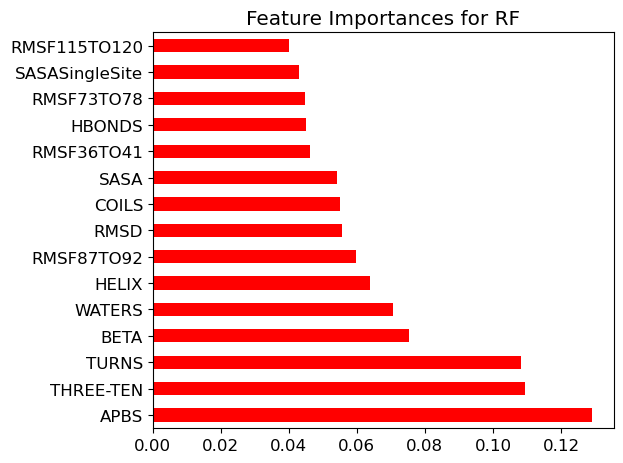

In [17]:
# MD
outputs = mlUtil.MLClassifier(df,tagsMD2,output,classifier="RF",display=display) 
mlData['RF']['MD']=outputs

k-fold crossvalidation results
[0.75       0.5        0.875      1.         0.75       0.71428571
 0.57142857 0.85714286 0.71428571 0.57142857] 

results mean
0.7303571428571428 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  1.0
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6956521739130435


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       1.00      0.42      0.59        12
    trafficking       0.61      1.00      0.76        11

       accuracy                           0.70        23
      macro avg       0.81      0.71      0.67        23
   weighted avg       0.81      0.70      0.67        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


<Figure size 640x480 with 0 Axes>

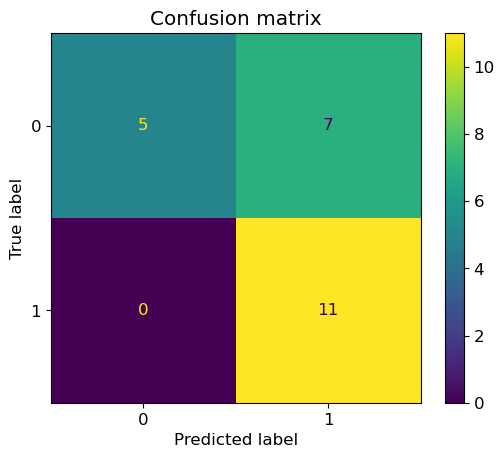

<Figure size 640x480 with 0 Axes>

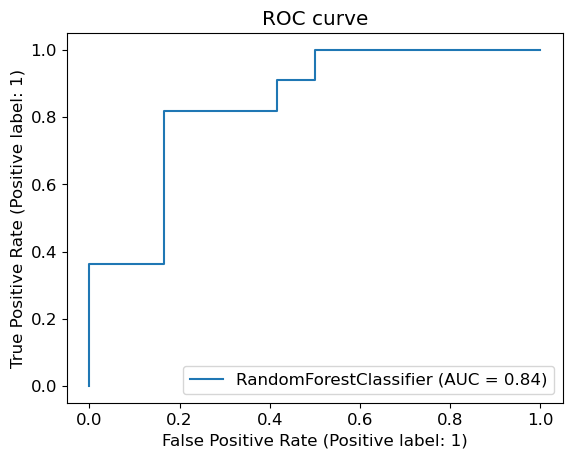

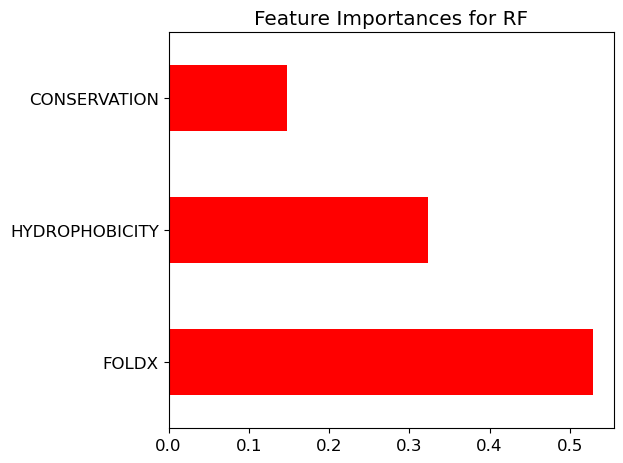

In [18]:
# Bio
outputs = mlUtil.MLClassifier(df,tagsBio,output,classifier="RF",display=display) 
mlData['RF']['Bio']=outputs

k-fold crossvalidation results
[1.         0.5        0.75       0.75       0.625      0.85714286
 0.71428571 0.57142857 0.71428571 0.71428571] 

results mean
0.7196428571428571 

Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.7391304347826086
                 precision    recall  f1-score   support

non-trafficking       0.88      0.58      0.70        12
    trafficking       0.67      0.91      0.77        11

       accuracy                           0.74        23
      macro avg       0.77      0.75      0.73        23
   weighted avg       0.78      0.74      0.73        23



<Figure size 600x400 with 0 Axes>

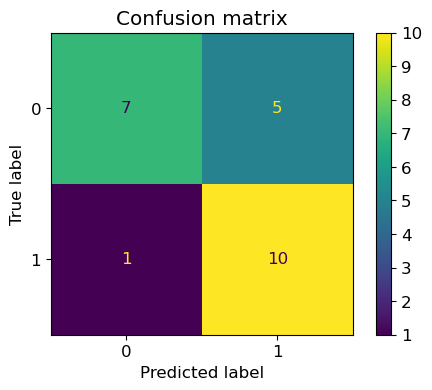

<Figure size 600x400 with 0 Axes>

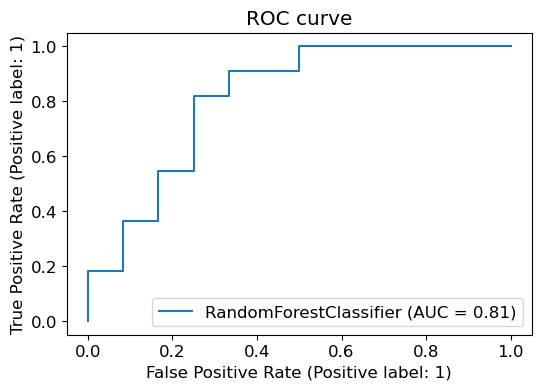

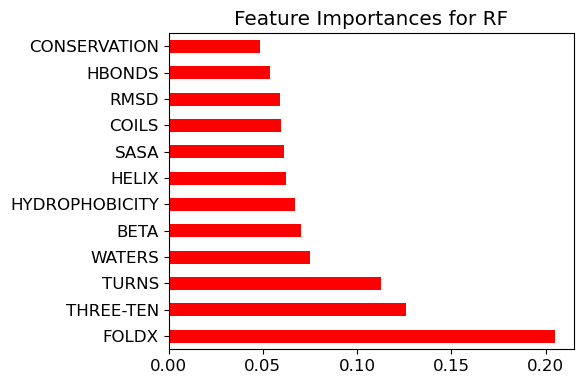

In [53]:
# All
outputs = mlUtil.MLClassifier(df,tagsAll1,output,classifier="RF",display=display) 

k-fold crossvalidation results
[1.         0.625      0.75       0.625      0.625      1.
 0.57142857 0.57142857 0.71428571 0.71428571] 

results mean
0.7196428571428571 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  1.0
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.7391304347826086


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       1.00      0.50      0.67        12
    trafficking       0.65      1.00      0.79        11

       accuracy                           0.74        23
      macro avg       0.82      0.75      0.73        23
   weighted avg       0.83      0.74      0.72        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predictions or ConfusionMatrixDisplay.from_estimator.
  warnings.warn(msg, category=FutureWarning)
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


<Figure size 640x480 with 0 Axes>

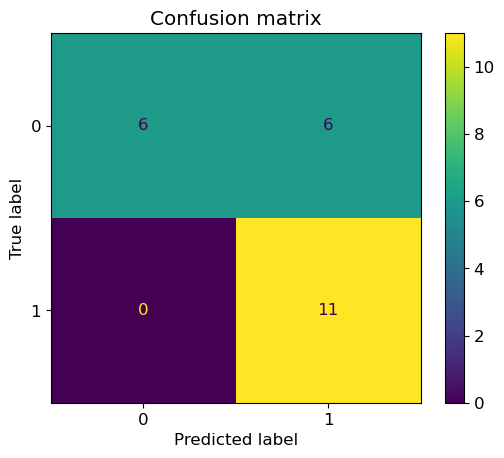

<Figure size 640x480 with 0 Axes>

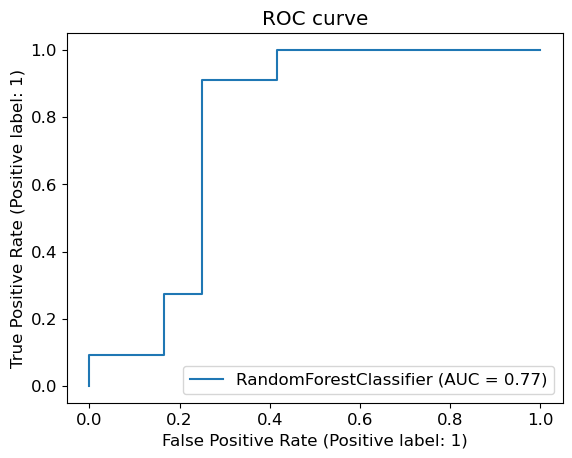

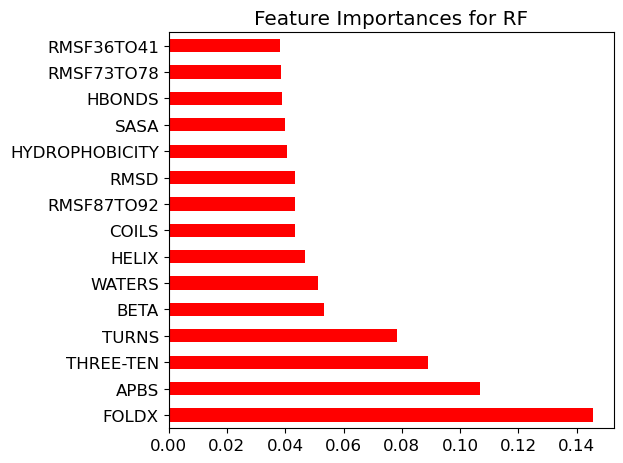

In [19]:
# All
outputs = mlUtil.MLClassifier(df,tagsAll2,output,classifier="RF",display=display) 
mlData['RF']['All']=outputs

#### plot ROC curves

MD
Bio
All


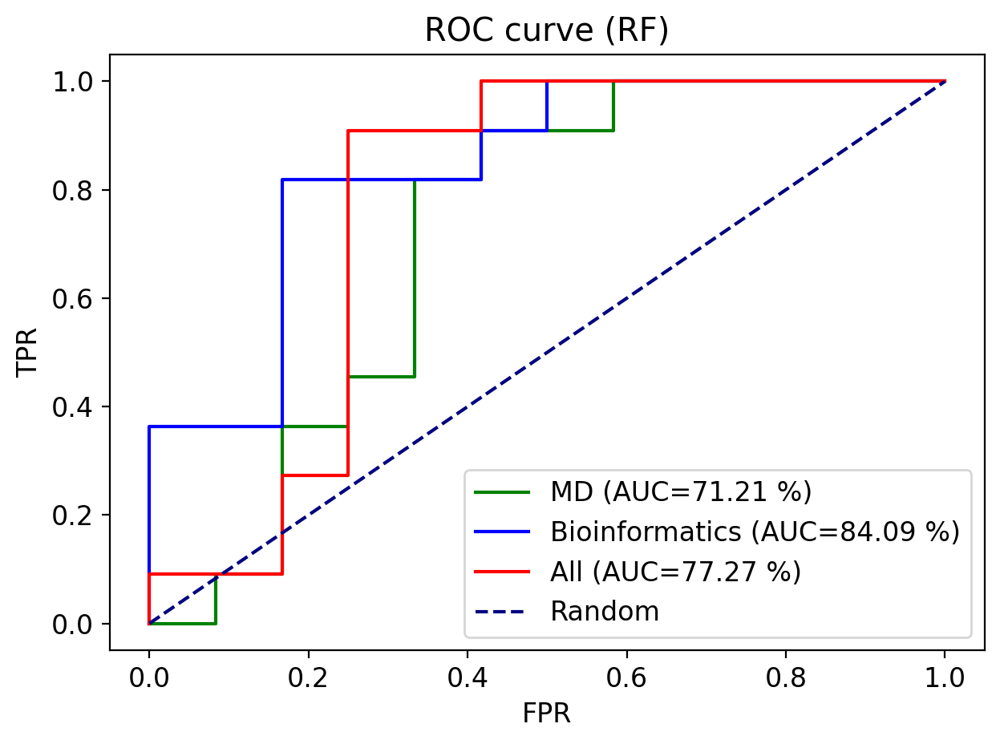

In [20]:
# compare different feature sets
labels=['MD','Bioinformatics','All']
cols=['green','blue','red']

#rcParams['figure.figsize']=7,4
rcParams['font.size']=12
rcParams['figure.dpi']=200
plt.figure()
plt.title('ROC curve (RF)')
for i,key in enumerate(mlData['RF'].keys()):
    print(key)
    fpr,tpr,auc=mlData['RF'][key]['fprs'], mlData['RF'][key]['tprs'], mlData['RF'][key]['auc']
    auc=np.around(auc*100,decimals=2)
    plt.plot(fpr,tpr,label="{} (AUC={} %)".format(labels[i],auc),color=cols[i])

plt.plot([0, 1], [0, 1], color='navy', linestyle='--', label='Random')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.legend(loc=4)
plt.tight_layout()
plt.savefig('roc_RF.png')
rcParams['figure.dpi']=100

k-fold crossvalidation results
[0.5        0.625      0.875      0.75       0.375      0.57142857
 0.85714286 0.42857143 0.42857143 0.71428571] 

results mean
0.6125 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9423076923076923
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6086956521739131


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.60      0.75      0.67        12
    trafficking       0.62      0.45      0.53        11

       accuracy                           0.61        23
      macro avg       0.61      0.60      0.60        23
   weighted avg       0.61      0.61      0.60        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.875      0.625      0.75       0.625      0.625      1.
 0.71428571 0.85714286 0.14285714 0.71428571] 

results mean
0.6928571428571428 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.7115384615384616
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6956521739130435


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.73      0.67      0.70        12
    trafficking       0.67      0.73      0.70        11

       accuracy                           0.70        23
      macro avg       0.70      0.70      0.70        23
   weighted avg       0.70      0.70      0.70        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.75       0.75       0.625      0.75       0.5        0.57142857
 0.57142857 0.71428571 0.57142857 0.42857143] 

results mean
0.6232142857142857 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.8269230769230769
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6521739130434783


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.75      0.50      0.60        12
    trafficking       0.60      0.82      0.69        11

       accuracy                           0.65        23
      macro avg       0.68      0.66      0.65        23
   weighted avg       0.68      0.65      0.64        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.75       0.75       0.75       0.625      0.375      0.57142857
 0.57142857 0.14285714 0.42857143 0.42857143] 

results mean
0.5392857142857144 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9615384615384616
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.4782608695652174


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.50      0.25      0.33        12
    trafficking       0.47      0.73      0.57        11

       accuracy                           0.48        23
      macro avg       0.49      0.49      0.45        23
   weighted avg       0.49      0.48      0.45        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.625      0.5        0.5        0.375      0.875      0.42857143
 0.57142857 0.71428571 0.28571429 0.71428571] 

results mean
0.5589285714285714 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9807692307692307
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.391304347826087


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.40      0.33      0.36        12
    trafficking       0.38      0.45      0.42        11

       accuracy                           0.39        23
      macro avg       0.39      0.39      0.39        23
   weighted avg       0.39      0.39      0.39        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.75       0.5        0.75       0.75       0.625      0.85714286
 0.57142857 0.42857143 0.71428571 0.42857143] 

results mean
0.6375000000000001 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9807692307692307
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6521739130434783


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.75      0.50      0.60        12
    trafficking       0.60      0.82      0.69        11

       accuracy                           0.65        23
      macro avg       0.68      0.66      0.65        23
   weighted avg       0.68      0.65      0.64        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.75       0.75       0.5        0.75       0.75       0.42857143
 0.57142857 0.42857143 0.14285714 0.28571429] 

results mean
0.5357142857142858 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9807692307692307
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.5217391304347826


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.56      0.42      0.48        12
    trafficking       0.50      0.64      0.56        11

       accuracy                           0.52        23
      macro avg       0.53      0.53      0.52        23
   weighted avg       0.53      0.52      0.52        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.625      0.375      0.5        0.375      0.75       0.85714286
 0.57142857 0.28571429 0.28571429 0.71428571] 

results mean
0.5339285714285714 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9423076923076923
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.391304347826087


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.25      0.08      0.12        12
    trafficking       0.42      0.73      0.53        11

       accuracy                           0.39        23
      macro avg       0.34      0.41      0.33        23
   weighted avg       0.33      0.39      0.32        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.625      0.5        0.75       0.625      0.375      0.57142857
 0.42857143 0.57142857 0.28571429 0.71428571] 

results mean
0.5446428571428571 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9807692307692307
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.43478260869565216


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.44      0.33      0.38        12
    trafficking       0.43      0.55      0.48        11

       accuracy                           0.43        23
      macro avg       0.44      0.44      0.43        23
   weighted avg       0.44      0.43      0.43        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.5        0.375      0.375      0.625      0.625      0.28571429
 0.28571429 0.71428571 0.28571429 0.57142857] 

results mean
0.46428571428571425 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.8269230769230769
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.5652173913043478


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.67      0.33      0.44        12
    trafficking       0.53      0.82      0.64        11

       accuracy                           0.57        23
      macro avg       0.60      0.58      0.54        23
   weighted avg       0.60      0.57      0.54        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.75       0.625      0.625      0.875      0.75       0.71428571
 0.71428571 0.85714286 0.42857143 0.71428571] 

results mean
0.7053571428571429 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.8846153846153846
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6956521739130435


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.86      0.50      0.63        12
    trafficking       0.62      0.91      0.74        11

       accuracy                           0.70        23
      macro avg       0.74      0.70      0.69        23
   weighted avg       0.75      0.70      0.68        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.375      0.375      0.625      0.625      0.625      0.71428571
 0.28571429 0.85714286 0.14285714 0.42857143] 

results mean
0.505357142857143 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.8461538461538461
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6086956521739131


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.71      0.42      0.53        12
    trafficking       0.56      0.82      0.67        11

       accuracy                           0.61        23
      macro avg       0.64      0.62      0.60        23
   weighted avg       0.64      0.61      0.59        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.625      0.625      0.75       0.625      0.5        0.71428571
 1.         0.71428571 0.57142857 0.42857143] 

results mean
0.6553571428571429 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.8846153846153846
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6956521739130435


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       1.00      0.42      0.59        12
    trafficking       0.61      1.00      0.76        11

       accuracy                           0.70        23
      macro avg       0.81      0.71      0.67        23
   weighted avg       0.81      0.70      0.67        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.625      0.375      0.875      0.625      0.625      0.71428571
 0.71428571 0.28571429 0.14285714 0.42857143] 

results mean
0.5410714285714286 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9807692307692307
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.391304347826087


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.25      0.08      0.12        12
    trafficking       0.42      0.73      0.53        11

       accuracy                           0.39        23
      macro avg       0.34      0.41      0.33        23
   weighted avg       0.33      0.39      0.32        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.25       0.125      0.375      0.5        0.375      0.57142857
 0.         0.28571429 0.42857143 0.14285714] 

results mean
0.3053571428571428 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9807692307692307
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.2608695652173913


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.22      0.17      0.19        12
    trafficking       0.29      0.36      0.32        11

       accuracy                           0.26        23
      macro avg       0.25      0.27      0.26        23
   weighted avg       0.25      0.26      0.25        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.375      0.75       0.625      0.625      0.625      0.28571429
 0.57142857 0.42857143 0.57142857 0.42857143] 

results mean
0.5285714285714286 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9423076923076923
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.43478260869565216


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.40      0.17      0.24        12
    trafficking       0.44      0.73      0.55        11

       accuracy                           0.43        23
      macro avg       0.42      0.45      0.39        23
   weighted avg       0.42      0.43      0.39        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.625      0.375      0.625      0.75       0.75       0.42857143
 0.71428571 0.71428571 0.57142857 0.42857143] 

results mean
0.5982142857142858 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9807692307692307
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6086956521739131


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.80      0.33      0.47        12
    trafficking       0.56      0.91      0.69        11

       accuracy                           0.61        23
      macro avg       0.68      0.62      0.58        23
   weighted avg       0.68      0.61      0.58        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.75       0.625      0.25       0.625      0.25       0.71428571
 0.28571429 0.71428571 0.42857143 0.57142857] 

results mean
0.5214285714285715 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.8076923076923077
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6521739130434783


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       1.00      0.33      0.50        12
    trafficking       0.58      1.00      0.73        11

       accuracy                           0.65        23
      macro avg       0.79      0.67      0.62        23
   weighted avg       0.80      0.65      0.61        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.5        0.625      0.875      0.75       0.375      0.57142857
 0.85714286 0.42857143 0.42857143 0.71428571] 

results mean
0.6125 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9423076923076923
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6086956521739131


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.60      0.75      0.67        12
    trafficking       0.62      0.45      0.53        11

       accuracy                           0.61        23
      macro avg       0.61      0.60      0.60        23
   weighted avg       0.61      0.61      0.60        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.875      0.625      0.75       0.625      0.625      1.
 0.71428571 0.85714286 0.14285714 0.71428571] 

results mean
0.6928571428571428 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.7115384615384616
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6956521739130435


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.73      0.67      0.70        12
    trafficking       0.67      0.73      0.70        11

       accuracy                           0.70        23
      macro avg       0.70      0.70      0.70        23
   weighted avg       0.70      0.70      0.70        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.75       0.75       0.625      0.75       0.5        0.57142857
 0.57142857 0.71428571 0.57142857 0.42857143] 

results mean
0.6232142857142857 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.8269230769230769
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6521739130434783


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.75      0.50      0.60        12
    trafficking       0.60      0.82      0.69        11

       accuracy                           0.65        23
      macro avg       0.68      0.66      0.65        23
   weighted avg       0.68      0.65      0.64        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.75       0.75       0.75       0.625      0.375      0.57142857
 0.57142857 0.14285714 0.42857143 0.42857143] 

results mean
0.5392857142857144 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9615384615384616
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.4782608695652174


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.50      0.25      0.33        12
    trafficking       0.47      0.73      0.57        11

       accuracy                           0.48        23
      macro avg       0.49      0.49      0.45        23
   weighted avg       0.49      0.48      0.45        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.625      0.5        0.5        0.375      0.875      0.42857143
 0.57142857 0.71428571 0.28571429 0.71428571] 

results mean
0.5589285714285714 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9807692307692307
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.391304347826087


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.40      0.33      0.36        12
    trafficking       0.38      0.45      0.42        11

       accuracy                           0.39        23
      macro avg       0.39      0.39      0.39        23
   weighted avg       0.39      0.39      0.39        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.75       0.5        0.75       0.75       0.625      0.85714286
 0.57142857 0.42857143 0.71428571 0.42857143] 

results mean
0.6375000000000001 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9807692307692307
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6521739130434783


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.75      0.50      0.60        12
    trafficking       0.60      0.82      0.69        11

       accuracy                           0.65        23
      macro avg       0.68      0.66      0.65        23
   weighted avg       0.68      0.65      0.64        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.75       0.75       0.5        0.75       0.75       0.42857143
 0.57142857 0.42857143 0.14285714 0.28571429] 

results mean
0.5357142857142858 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9807692307692307
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.5217391304347826


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.56      0.42      0.48        12
    trafficking       0.50      0.64      0.56        11

       accuracy                           0.52        23
      macro avg       0.53      0.53      0.52        23
   weighted avg       0.53      0.52      0.52        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.625      0.375      0.5        0.375      0.75       0.85714286
 0.57142857 0.28571429 0.28571429 0.71428571] 

results mean
0.5339285714285714 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9423076923076923
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.391304347826087


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.25      0.08      0.12        12
    trafficking       0.42      0.73      0.53        11

       accuracy                           0.39        23
      macro avg       0.34      0.41      0.33        23
   weighted avg       0.33      0.39      0.32        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.625      0.5        0.75       0.625      0.375      0.57142857
 0.42857143 0.57142857 0.28571429 0.71428571] 

results mean
0.5446428571428571 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9807692307692307
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.43478260869565216


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.44      0.33      0.38        12
    trafficking       0.43      0.55      0.48        11

       accuracy                           0.43        23
      macro avg       0.44      0.44      0.43        23
   weighted avg       0.44      0.43      0.43        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.5        0.375      0.375      0.625      0.625      0.28571429
 0.28571429 0.71428571 0.28571429 0.57142857] 

results mean
0.46428571428571425 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.8269230769230769
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.5652173913043478


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.67      0.33      0.44        12
    trafficking       0.53      0.82      0.64        11

       accuracy                           0.57        23
      macro avg       0.60      0.58      0.54        23
   weighted avg       0.60      0.57      0.54        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.75       0.625      0.625      0.875      0.75       0.71428571
 0.71428571 0.85714286 0.42857143 0.71428571] 

results mean
0.7053571428571429 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.8846153846153846
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6956521739130435


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.86      0.50      0.63        12
    trafficking       0.62      0.91      0.74        11

       accuracy                           0.70        23
      macro avg       0.74      0.70      0.69        23
   weighted avg       0.75      0.70      0.68        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.375      0.375      0.625      0.625      0.625      0.71428571
 0.28571429 0.85714286 0.14285714 0.42857143] 

results mean
0.505357142857143 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.8461538461538461
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6086956521739131


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.71      0.42      0.53        12
    trafficking       0.56      0.82      0.67        11

       accuracy                           0.61        23
      macro avg       0.64      0.62      0.60        23
   weighted avg       0.64      0.61      0.59        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.625      0.625      0.75       0.625      0.5        0.71428571
 1.         0.71428571 0.57142857 0.42857143] 

results mean
0.6553571428571429 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.8846153846153846
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6956521739130435


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       1.00      0.42      0.59        12
    trafficking       0.61      1.00      0.76        11

       accuracy                           0.70        23
      macro avg       0.81      0.71      0.67        23
   weighted avg       0.81      0.70      0.67        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.625      0.375      0.875      0.625      0.625      0.71428571
 0.71428571 0.28571429 0.14285714 0.42857143] 

results mean
0.5410714285714286 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9807692307692307
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.391304347826087


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.25      0.08      0.12        12
    trafficking       0.42      0.73      0.53        11

       accuracy                           0.39        23
      macro avg       0.34      0.41      0.33        23
   weighted avg       0.33      0.39      0.32        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.25       0.125      0.375      0.5        0.375      0.57142857
 0.         0.28571429 0.42857143 0.14285714] 

results mean
0.3053571428571428 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9807692307692307
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.2608695652173913


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.22      0.17      0.19        12
    trafficking       0.29      0.36      0.32        11

       accuracy                           0.26        23
      macro avg       0.25      0.27      0.26        23
   weighted avg       0.25      0.26      0.25        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.375      0.75       0.625      0.625      0.625      0.28571429
 0.57142857 0.42857143 0.57142857 0.42857143] 

results mean
0.5285714285714286 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9423076923076923
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.43478260869565216


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.40      0.17      0.24        12
    trafficking       0.44      0.73      0.55        11

       accuracy                           0.43        23
      macro avg       0.42      0.45      0.39        23
   weighted avg       0.42      0.43      0.39        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.625      0.375      0.625      0.75       0.75       0.42857143
 0.71428571 0.71428571 0.57142857 0.42857143] 

results mean
0.5982142857142858 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.9807692307692307
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6086956521739131


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.80      0.33      0.47        12
    trafficking       0.56      0.91      0.69        11

       accuracy                           0.61        23
      macro avg       0.68      0.62      0.58        23
   weighted avg       0.68      0.61      0.58        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


k-fold crossvalidation results
[0.75       0.625      0.25       0.625      0.25       0.71428571
 0.28571429 0.71428571 0.42857143 0.57142857] 

results mean
0.5214285714285715 

Training sample accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.8076923076923077
Test Accuracy


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


Overall accuracy  0.6521739130434783


/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       1.00      0.33      0.50        12
    trafficking       0.58      1.00      0.73        11

       accuracy                           0.65        23
      macro avg       0.79      0.67      0.62        23
   weighted avg       0.80      0.65      0.61        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


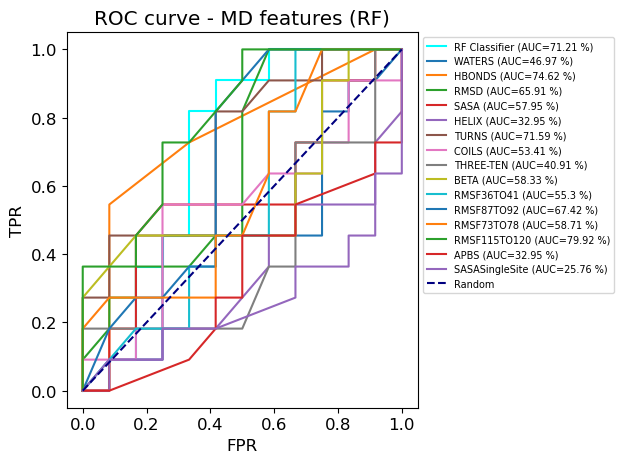

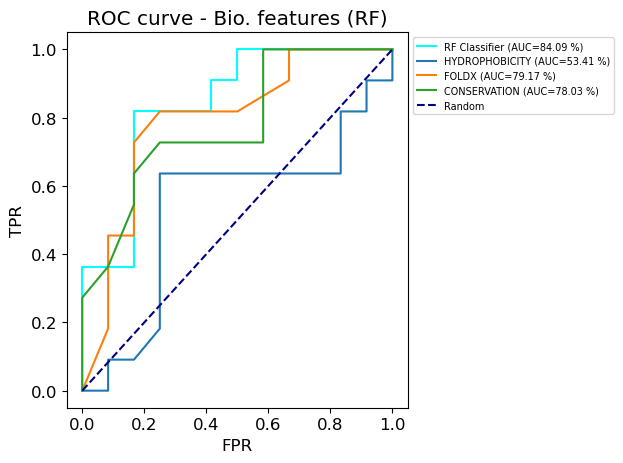

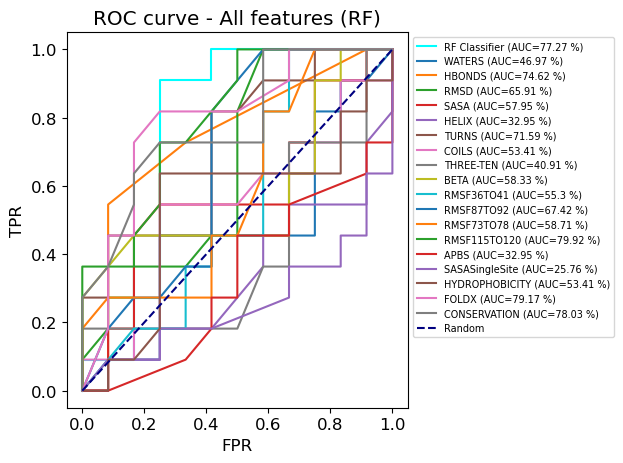

In [21]:
# plot individual features for different feature sets
featSets=[tagsMD2,tagsBio,tagsAll2]
keys=['MD','Bio','All']
labels=['MD', 'Bio.', 'All']
clf='RF'
rcParams['figure.dpi']=100

for i,key in enumerate(keys):
    feats=featSets[i]    
    plt.figure()
    ax=plt.subplot()
    ax.set_xlabel('FPR')
    ax.set_ylabel('TPR')
    ax.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
    ax.set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
    ax.set_title('ROC curve - {} features ({})'.format(labels[i], clf))

    # plot classifier ROC
    tpr, fpr, auc = mlData[clf][key]['tprs'], mlData[clf][key]['fprs'], mlData[clf][key]['auc']
    auc=np.around(auc*100,decimals=2)
    plt.plot (fpr, tpr, color='cyan', label="{} Classifier (AUC={} %)".format(clf,auc))

    # plot feature ROC
    for feat in feats:
        outputs = mlUtil.MLClassifier(df,[feat],output,classifier=clf, display=False, random_state=random_state)
        tpr, fpr, auc = outputs['tprs'], outputs['fprs'], outputs['auc']
        auc=np.around(auc*100,decimals=2)
        plt.plot(fpr,tpr,label="{} (AUC={} %)".format(feat,auc))

    # plot random line
    plt.plot([0, 1], [0, 1], color='navy', linestyle='--', label='Random')
    plt.legend(bbox_to_anchor=(1,1), loc='upper left',fontsize=7)
    plt.tight_layout()
    plt.savefig('{}_indiFeature_{}.png'.format(clf,key))

rcParams['figure.dpi']=100

## Support vector machines

In [22]:
mlData['SVM']={}

/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:255: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'


Training sample accuracy
Overall accuracy  0.75
Test Accuracy
Overall accuracy  0.782608695652174
                 precision    recall  f1-score   support

non-trafficking       1.00      0.58      0.74        12
    trafficking       0.69      1.00      0.81        11

       accuracy                           0.78        23
      macro avg       0.84      0.79      0.78        23
   weighted avg       0.85      0.78      0.77        23



<Figure size 600x400 with 0 Axes>

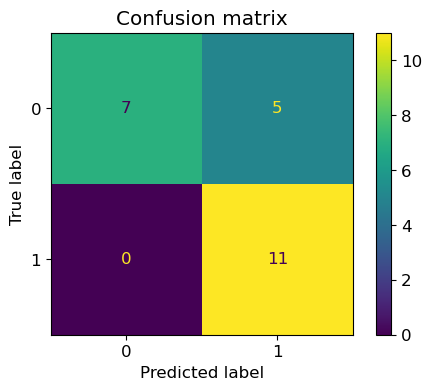

<Figure size 600x400 with 0 Axes>

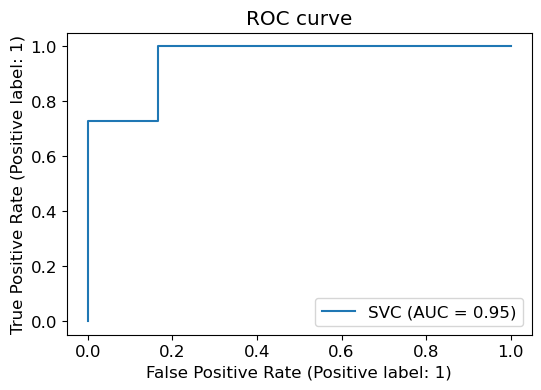

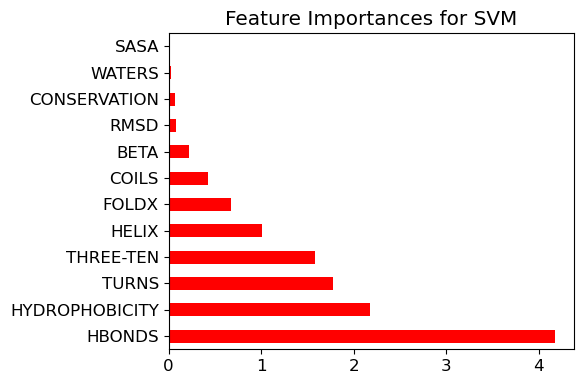

In [58]:
outputs = mlUtil.MLClassifier(df,features,output,classifier="SVM",display=display) 
cases['SVM'] = outputs

/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:255: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'


Training sample accuracy
Overall accuracy  0.7884615384615384
Test Accuracy
Overall accuracy  0.5652173913043478
                 precision    recall  f1-score   support

non-trafficking       1.00      0.17      0.29        12
    trafficking       0.52      1.00      0.69        11

       accuracy                           0.57        23
      macro avg       0.76      0.58      0.49        23
   weighted avg       0.77      0.57      0.48        23



<Figure size 600x400 with 0 Axes>

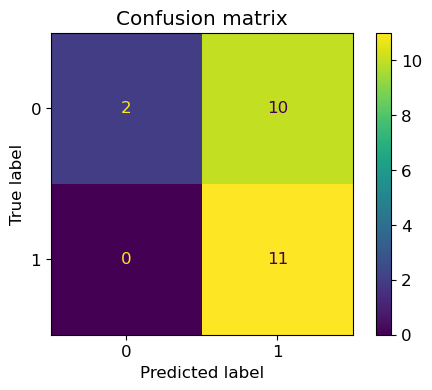

<Figure size 600x400 with 0 Axes>

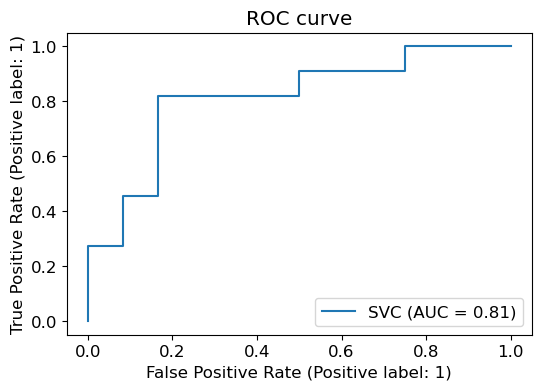

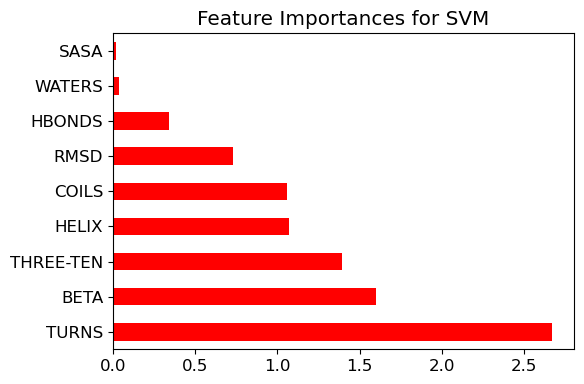

In [59]:
# MD
outputs = mlUtil.MLClassifier(df,tagsMD1,output,classifier="SVM",display=display)

/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils

Training sample accuracy
Overall accuracy  0.6346153846153846
Test Accuracy
Overall accuracy  0.4782608695652174
                 precision    recall  f1-score   support

non-trafficking       0.50      0.42      0.45        12
    trafficking       0.46      0.55      0.50        11

       accuracy                           0.48        23
      macro avg       0.48      0.48      0.48        23
   weighted avg       0.48      0.48      0.48        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


<Figure size 640x480 with 0 Axes>

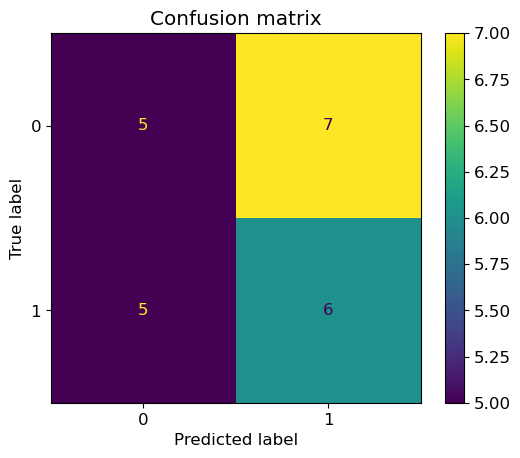

<Figure size 640x480 with 0 Axes>

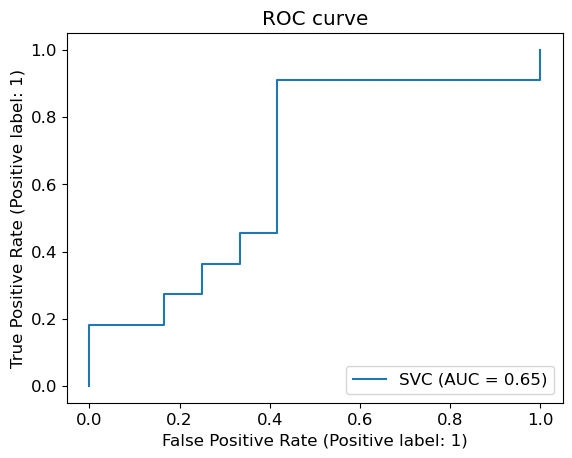

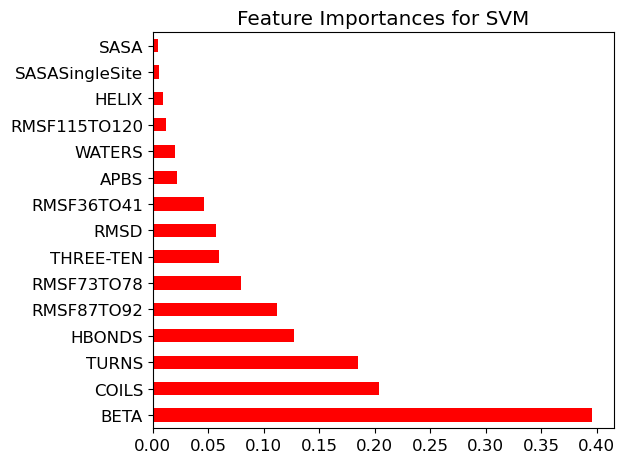

In [23]:
# MD
outputs = mlUtil.MLClassifier(df,tagsMD2,output,classifier="SVM",display=display)
mlData['SVM']['MD']=outputs

Training sample accuracy
Overall accuracy  0.6730769230769231
Test Accuracy
Overall accuracy  0.6521739130434783
                 precision    recall  f1-score   support

non-trafficking       1.00      0.33      0.50        12
    trafficking       0.58      1.00      0.73        11

       accuracy                           0.65        23
      macro avg       0.79      0.67      0.62        23
   weighted avg       0.80      0.65      0.61        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_confusion_matrix is deprecated; Function `plot_confusion_matrix` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: ConfusionMatrixDisplay.from_predict

<Figure size 640x480 with 0 Axes>

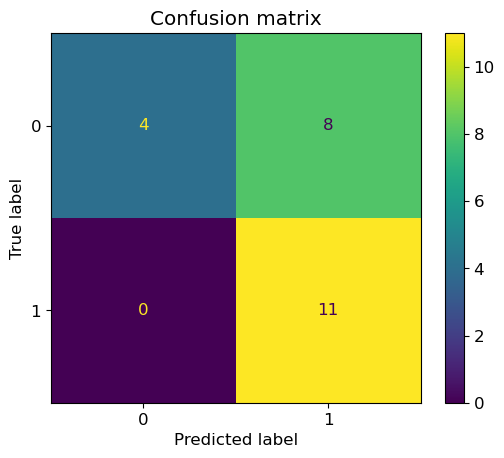

<Figure size 640x480 with 0 Axes>

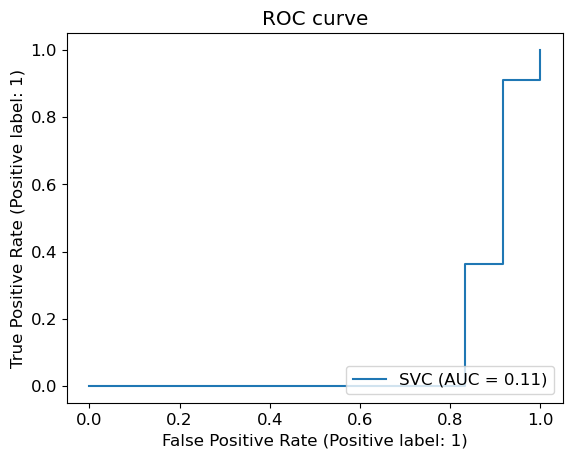

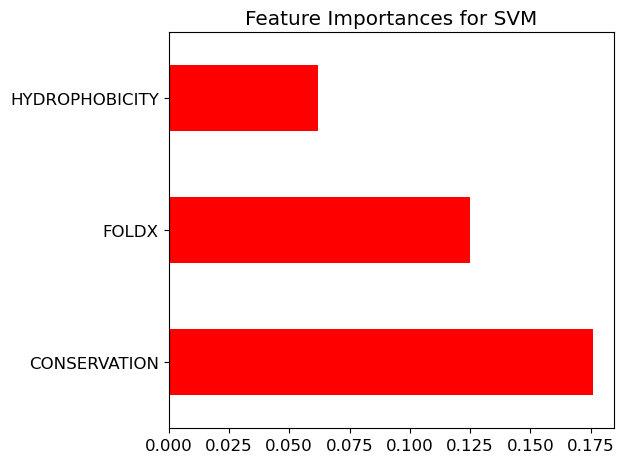

In [24]:
# Bio
outputs = mlUtil.MLClassifier(df,tagsBio,output,classifier="SVM",display=display)
mlData['SVM']['Bio']=outputs

/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:255: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'


Training sample accuracy
Overall accuracy  0.75
Test Accuracy
Overall accuracy  0.782608695652174
                 precision    recall  f1-score   support

non-trafficking       1.00      0.58      0.74        12
    trafficking       0.69      1.00      0.81        11

       accuracy                           0.78        23
      macro avg       0.84      0.79      0.78        23
   weighted avg       0.85      0.78      0.77        23



<Figure size 600x400 with 0 Axes>

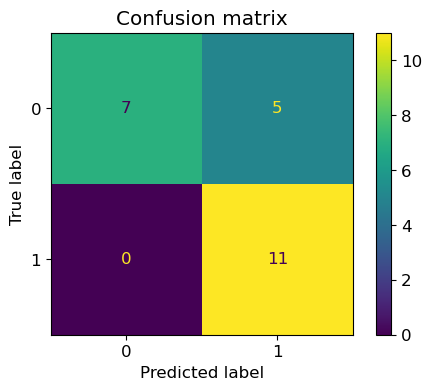

<Figure size 600x400 with 0 Axes>

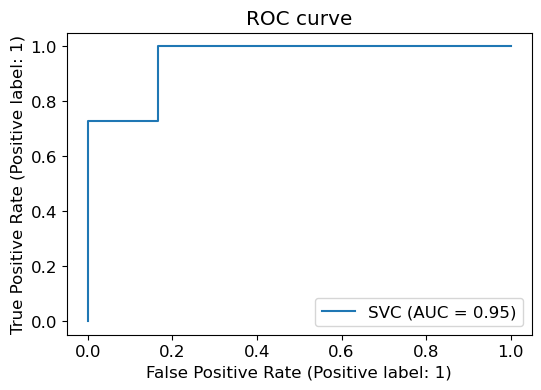

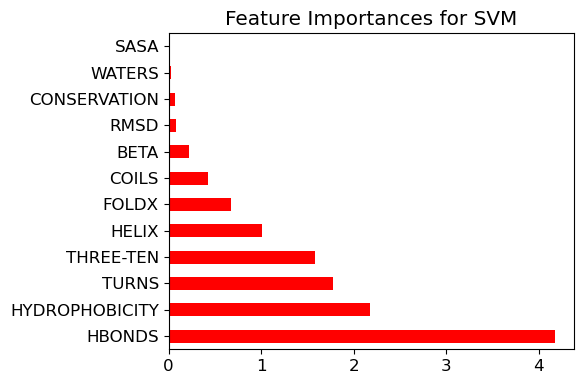

In [62]:
# All
outputs = mlUtil.MLClassifier(df,tagsAll1,output,classifier="SVM",display=display)

/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils

Training sample accuracy
Overall accuracy  0.5384615384615384
Test Accuracy
Overall accuracy  0.30434782608695654
                 precision    recall  f1-score   support

non-trafficking       0.36      0.42      0.38        12
    trafficking       0.22      0.18      0.20        11

       accuracy                           0.30        23
      macro avg       0.29      0.30      0.29        23
   weighted avg       0.29      0.30      0.30        23



/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_roc_curve is deprecated; Function :func:`plot_roc_curve` is deprecated in 1.0 and will be removed in 1.2. Use one of the class methods: :meth:`sklearn.metric.RocCurveDisplay.from_predictions` or :meth:`sklearn.metric.RocCurveDisplay.from_estimator`.
  warnings.warn(msg, category=FutureWarning)


<Figure size 640x480 with 0 Axes>

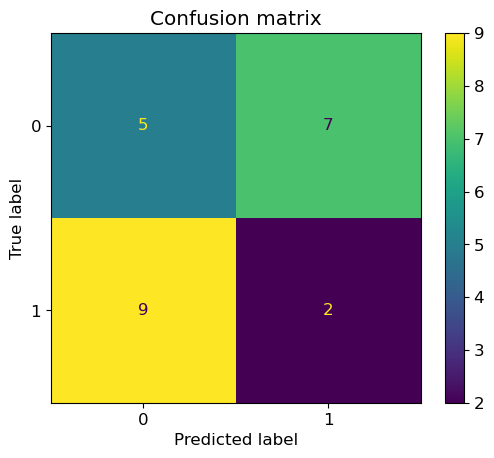

<Figure size 640x480 with 0 Axes>

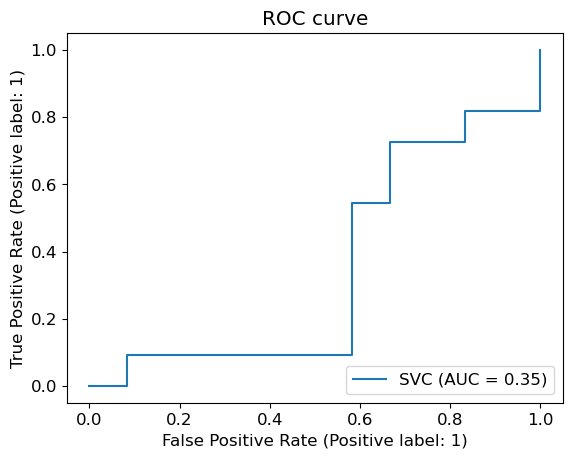

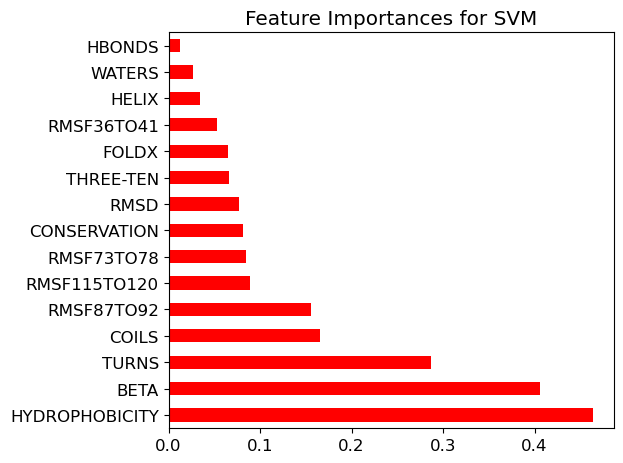

In [25]:
# All
outputs = mlUtil.MLClassifier(df,tagsAll2,output,classifier="SVM",display=display)
mlData['SVM']['All']=outputs

#### plot ROC curves

MD
Bio
All


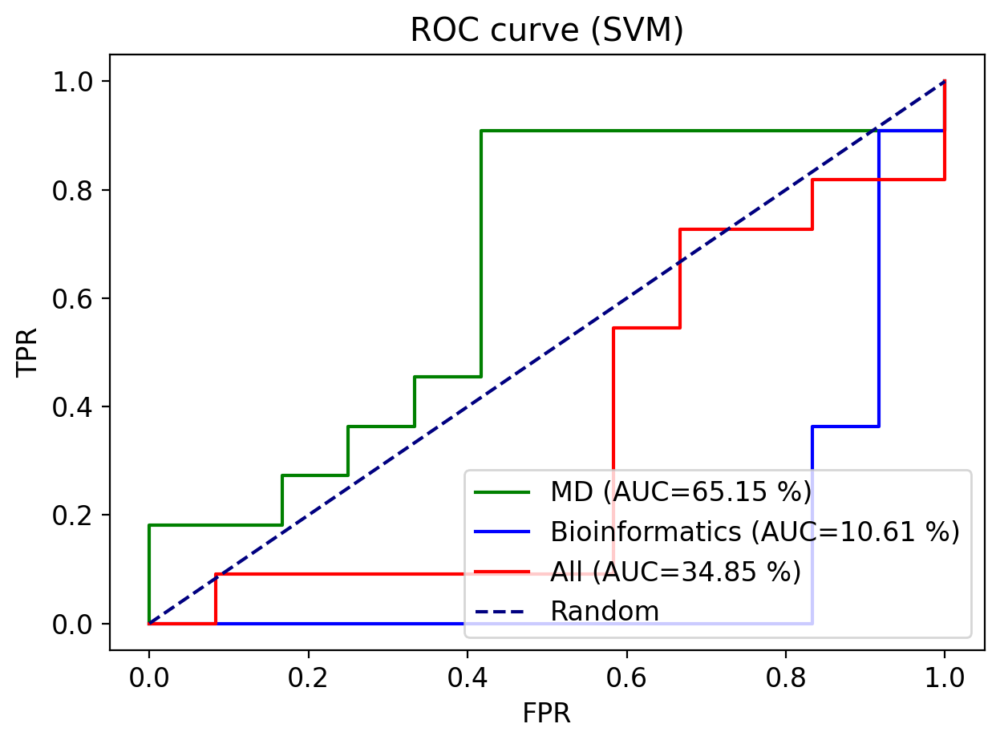

In [26]:
# compare different feature sets
labels=['MD','Bioinformatics','All']
cols=['green','blue','red']

#rcParams['figure.figsize']=7,4
rcParams['font.size']=12
rcParams['figure.dpi']=200
plt.figure()
plt.title('ROC curve (SVM)')
for i,key in enumerate(mlData['SVM'].keys()):
    print(key)
    fpr,tpr,auc=mlData['SVM'][key]['fprs'], mlData['SVM'][key]['tprs'], mlData['SVM'][key]['auc']
    auc=np.around(auc*100,decimals=2)
    plt.plot(fpr,tpr,label="{} (AUC={} %)".format(labels[i],auc),color=cols[i])

plt.plot([0, 1], [0, 1], color='navy', linestyle='--', label='Random')
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.legend(loc=4)
plt.tight_layout()
plt.savefig('roc_SVM.png')
rcParams['figure.dpi']=100

/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:301: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter

Training sample accuracy
Overall accuracy  0.6538461538461539
Test Accuracy
Overall accuracy  0.4782608695652174
                 precision    recall  f1-score   support

non-trafficking       0.00      0.00      0.00        12
    trafficking       0.48      1.00      0.65        11

       accuracy                           0.48        23
      macro avg       0.24      0.50      0.32        23
   weighted avg       0.23      0.48      0.31        23

Training sample accuracy
Overall accuracy  0.7115384615384616
Test Accuracy
Overall accuracy  0.5217391304347826
                 precision    recall  f1-score   support

non-trafficking       1.00      0.08      0.15        12
    trafficking       0.50      1.00      0.67        11

       accuracy                           0.52        23
      macro avg       0.75      0.54      0.41        23
   weighted avg       0.76      0.52      0.40        23

Training sample accuracy
Overall accuracy  0.6538461538461539
Test Accuracy
Overall 

/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(


                 precision    recall  f1-score   support

non-trafficking       0.00      0.00      0.00        12
    trafficking       0.48      1.00      0.65        11

       accuracy                           0.48        23
      macro avg       0.24      0.50      0.32        23
   weighted avg       0.23      0.48      0.31        23

Training sample accuracy
Overall accuracy  0.6538461538461539
Test Accuracy
Overall accuracy  0.4782608695652174
                 precision    recall  f1-score   support

non-trafficking       0.00      0.00      0.00        12
    trafficking       0.48      1.00      0.65        11

       accuracy                           0.48        23
      macro avg       0.24      0.50      0.32        23
   weighted avg       0.23      0.48      0.31        23

Training sample accuracy
Overall accuracy  0.6538461538461539
Test Accuracy
Overall accuracy  0.6521739130434783
                 precision    recall  f1-score   support

non-trafficking       1.00

/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1327: UndefinedMetricWarning: Precision and F-score are ill-

                 precision    recall  f1-score   support

non-trafficking       0.00      0.00      0.00        12
    trafficking       0.48      1.00      0.65        11

       accuracy                           0.48        23
      macro avg       0.24      0.50      0.32        23
   weighted avg       0.23      0.48      0.31        23

Training sample accuracy
Overall accuracy  0.7115384615384616
Test Accuracy
Overall accuracy  0.5217391304347826
                 precision    recall  f1-score   support

non-trafficking       1.00      0.08      0.15        12
    trafficking       0.50      1.00      0.67        11

       accuracy                           0.52        23
      macro avg       0.75      0.54      0.41        23
   weighted avg       0.76      0.52      0.40        23

Training sample accuracy
Overall accuracy  0.6538461538461539
Test Accuracy
Overall accuracy  0.4782608695652174
                 precision    recall  f1-score   support

non-trafficking       0.00

/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but SVC was fitted with feature names
  warnings.warn(
/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature 

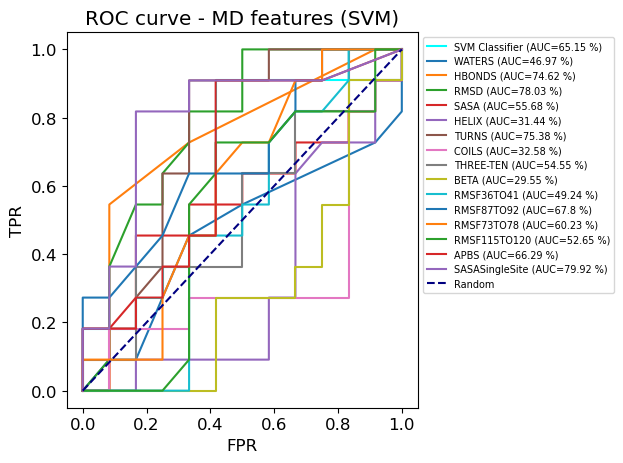

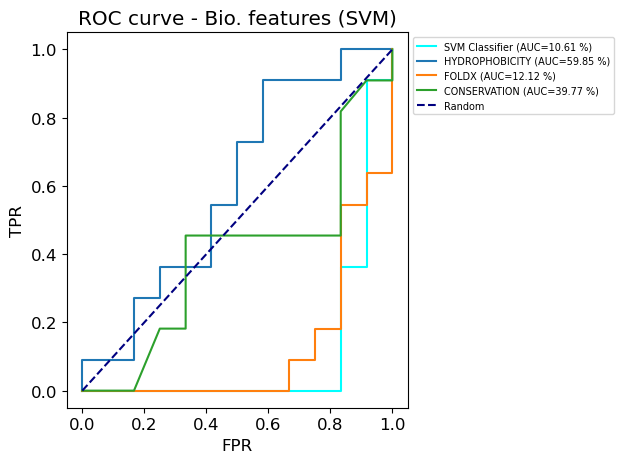

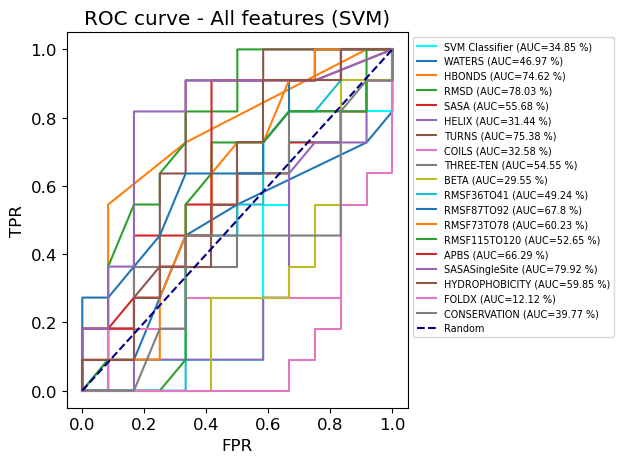

In [27]:
# plot individual features for different feature sets
featSets=[tagsMD2,tagsBio,tagsAll2]
keys=['MD','Bio','All']
labels=['MD', 'Bio.', 'All']
clf='SVM'
rcParams['figure.dpi']=100

for i,key in enumerate(keys):
    feats=featSets[i]    
    plt.figure()
    ax=plt.subplot()
    ax.set_xlabel('FPR')
    ax.set_ylabel('TPR')
    ax.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
    ax.set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
    ax.set_title('ROC curve - {} features ({})'.format(labels[i], clf))

    # plot classifier ROC
    tpr, fpr, auc = mlData[clf][key]['tprs'], mlData[clf][key]['fprs'], mlData[clf][key]['auc']
    auc=np.around(auc*100,decimals=2)
    plt.plot (fpr, tpr, color='cyan', label="{} Classifier (AUC={} %)".format(clf,auc))

    # plot feature ROC
    for feat in feats:
        outputs = mlUtil.MLClassifier(df,[feat],output,classifier=clf, display=False, random_state=random_state)
        tpr, fpr, auc = outputs['tprs'], outputs['fprs'], outputs['auc']
        auc=np.around(auc*100,decimals=2)
        plt.plot(fpr,tpr,label="{} (AUC={} %)".format(feat, auc))

    # plot random line
    plt.plot([0, 1], [0, 1], color='navy', linestyle='--', label='Random')
    plt.legend(bbox_to_anchor=(1,1), loc='upper left',fontsize=7)
    plt.tight_layout()
    plt.savefig('{}_indiFeature_{}.png'.format(clf,key))

rcParams['figure.dpi']=100

### Classfier performance comparison (F1 score)

findfont: Font family ['cursive'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'cursive' not found because none of the following families were found: Apple Chancery, Textile, Zapf Chancery, Sand, Script MT, Felipa, Comic Neue, Comic Sans MS, cursive
findfont: Font family ['cursive'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'cursive' not found because none of the following families were found: Apple Chancery, Textile, Zapf Chancery, Sand, Script MT, Felipa, Comic Neue, Comic Sans MS, cursive


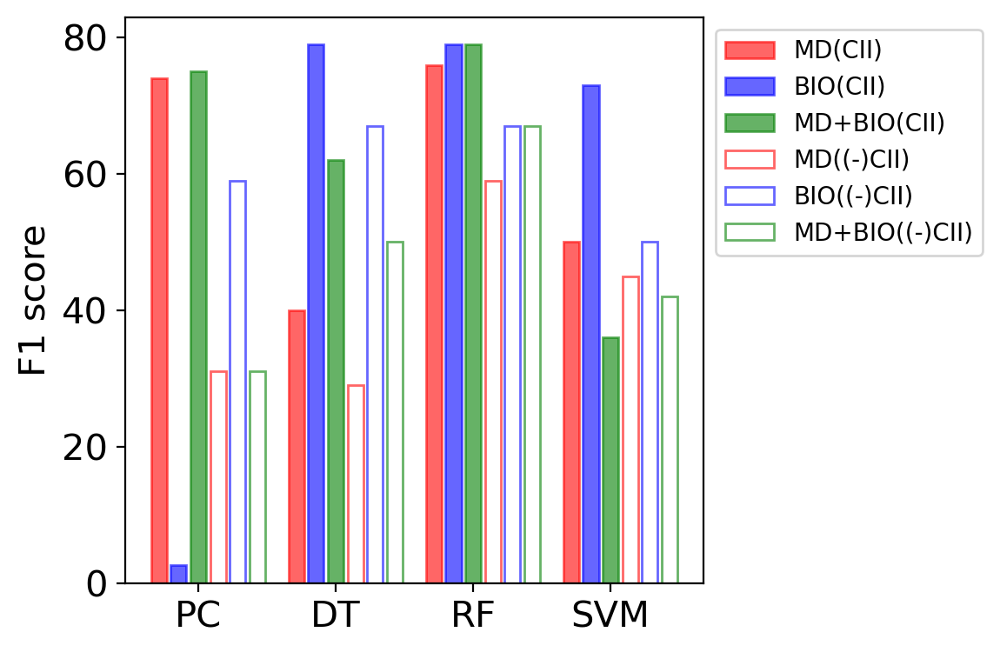

In [66]:
# [MD_T, BIO_T, ALL_T, MD_NT, BIO_NT, ALL_NT]
PCs=[0.74, 0.026, 0.75, 0.31, 0.59, 0.31] 
DTs=[0.40, 0.79, 0.62, 0.29, 0.67, 0.5]
RFs=[0.76, 0.79, 0.79, 0.59, 0.67, 0.67]
SVMs=[0.50, 0.73, 0.36, 0.45, 0.50, 0.42]
allData1=[0.74, 0.026, 0.75, 0.31, 0.59, 0.31,  0, 0.40, 0.79, 0.62, 0.29, 0.67, 0.5,  0,  0.76, 0.79, 0.79, 0.59, 0.67, 0.67,  0,  0.50, 0.73, 0.36, 0.45, 0.50, 0.42]
allData=[i*100 for i in allData1]
cols=['red','blue','green','red','blue','green','white']
labels=['MD(CII)', 'BIO(CII)', 'MD+BIO(CII)', 'MD((-)CII)', 'BIO((-)CII)', 'MD+BIO((-)CII)']
styles=['','','', '///' , '///', '///']

rcParams['figure.dpi']=200
rcParams['font.size']=15
plt.figure()
ax=plt.subplot()
ax.set_ylabel('F1 score')
ax.set_xticks([2,9,16,23])
ax.set_xticklabels(['PC','DT','RF','SVM'])
ax.set_yticks([0, 20, 40, 60, 80, 100])

for i,label in enumerate(labels):
    vals=[]
    xs=[]
    
    for j in range(len(allData)):
        if j % 7 == i:
            vals.append(allData[j])
            xs.append(j)

    if i < 3:
        fill=True
    else:
        fill=False
        
    #plt.bar(xs,vals,color=cols[i],alpha=0.6,hatch=styles[i],edgecolor=cols[i],label=label)
    plt.bar(xs,vals,color=cols[i],alpha=0.6,fill=fill,edgecolor=cols[i],label=label)
    
plt.legend(bbox_to_anchor=(1,1),fontsize=10)
plt.tight_layout()
plt.savefig('f1-scores-trafficking.png')


rcParams['figure.dpi']=100


### All classifiers

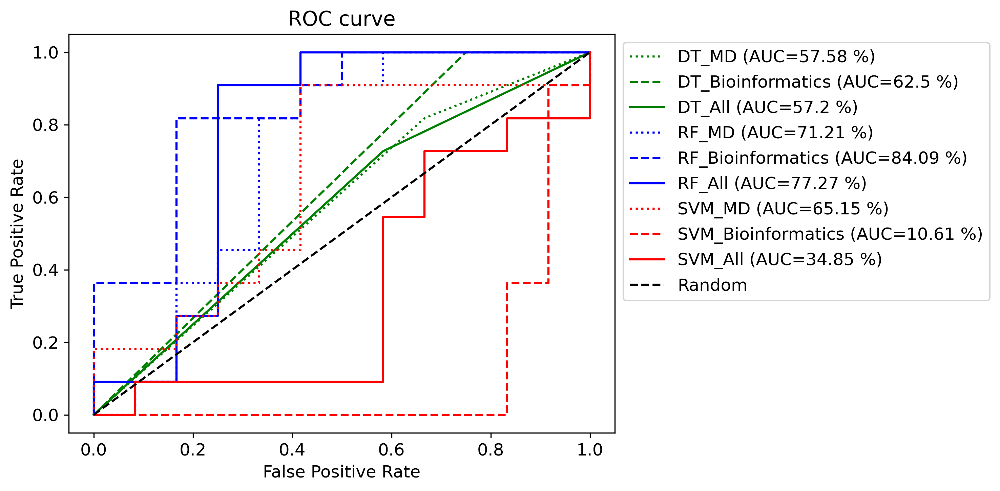

In [97]:
# compare different feature sets for different classifiers
labels=['MD','Bioinformatics','All']
cols=['green','blue','red']
styles=[':','--','-']

rcParams['font.size']=12
rcParams['figure.figsize']=10,5
rcParams['figure.dpi']=300
plt.figure()
plt.title('ROC curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')

for i,clf in enumerate(clfs):
    for j,key in enumerate(mlData[clf].keys()):
        fpr,tpr,auc=mlData[clf][key]['fprs'], mlData[clf][key]['tprs'], mlData[clf][key]['auc']
        auc=np.around(auc*100,decimals=2)
        plt.plot(fpr,tpr,label="{}_{} (AUC={} %)".format(clf,labels[j], auc),color=cols[i],linestyle=styles[j])

        
plt.plot([0, 1], [0, 1], color='black', linestyle='--', label='Random')
plt.legend(bbox_to_anchor=(1,1))
plt.tight_layout()
plt.savefig('roc_allClf.png')
rcParams['figure.dpi']=100

### Train using best 5 features

Decision tree classifier
Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.7391304347826086
                 precision    recall  f1-score   support

non-trafficking       0.88      0.58      0.70        12
    trafficking       0.67      0.91      0.77        11

       accuracy                           0.74        23
      macro avg       0.77      0.75      0.73        23
   weighted avg       0.78      0.74      0.73        23

k-fold crossvalidation results
[0.75       0.5        0.75       0.875      0.625      0.85714286
 0.71428571 0.42857143 0.71428571 0.71428571] 

results mean
0.6928571428571428 

Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.782608695652174
                 precision    recall  f1-score   support

non-trafficking       1.00      0.58      0.74        12
    trafficking       0.69      1.00      0.81        11

       accuracy                           0.78        23
      macro avg       0.8

/home/xfang2/anaconda3/lib/python3.9/site-packages/sklearn/svm/_base.py:255: ConvergenceWarning: Solver terminated early (max_iter=10000).  Consider pre-processing your data with StandardScaler or MinMaxScaler.
  warnings.warn('Solver terminated early (max_iter=%i).'


Training sample accuracy
Overall accuracy  0.8076923076923077
Test Accuracy
Overall accuracy  0.782608695652174
                 precision    recall  f1-score   support

non-trafficking       0.82      0.75      0.78        12
    trafficking       0.75      0.82      0.78        11

       accuracy                           0.78        23
      macro avg       0.78      0.78      0.78        23
   weighted avg       0.79      0.78      0.78        23



<Figure size 1000x500 with 0 Axes>

<Figure size 1000x500 with 0 Axes>

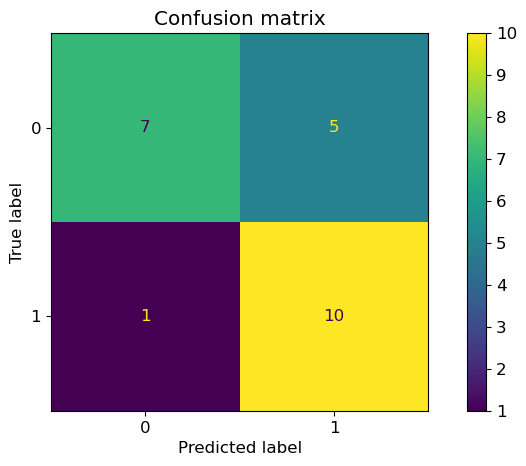

<Figure size 1000x500 with 0 Axes>

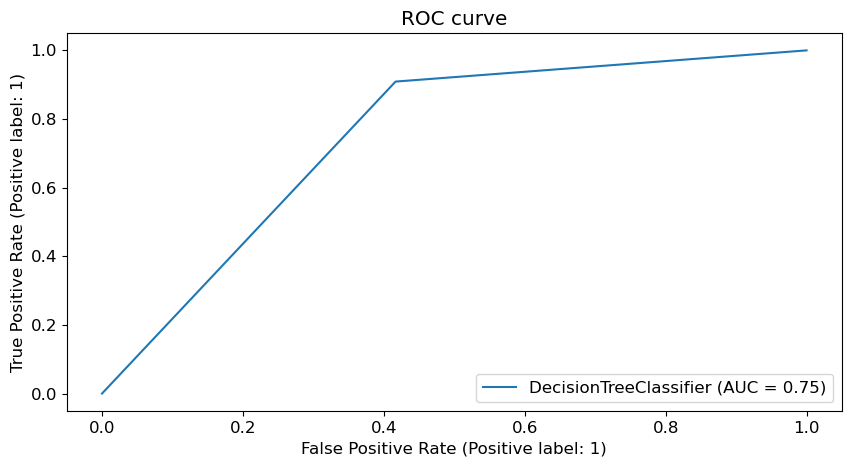

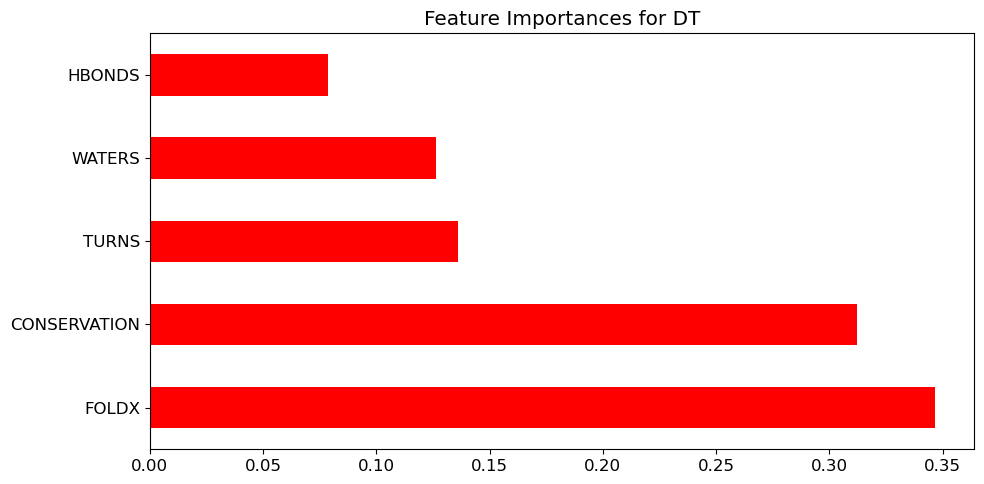

<Figure size 1000x500 with 0 Axes>

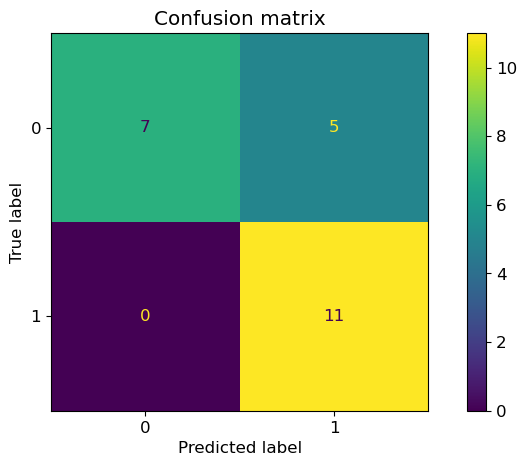

<Figure size 1000x500 with 0 Axes>

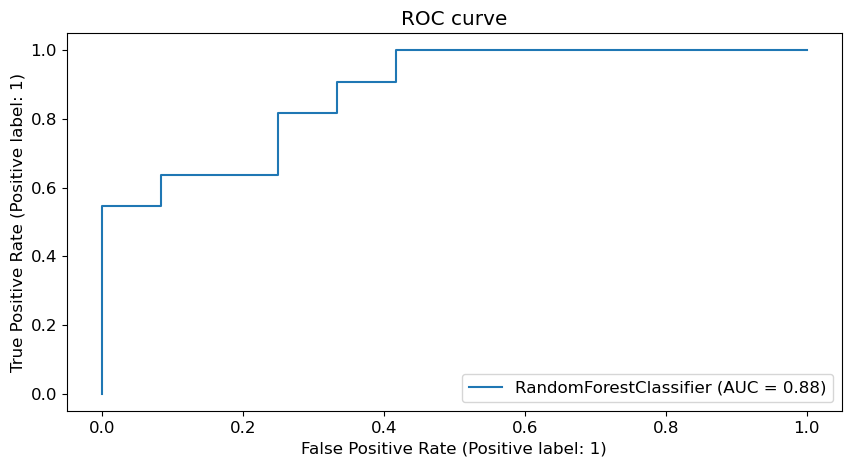

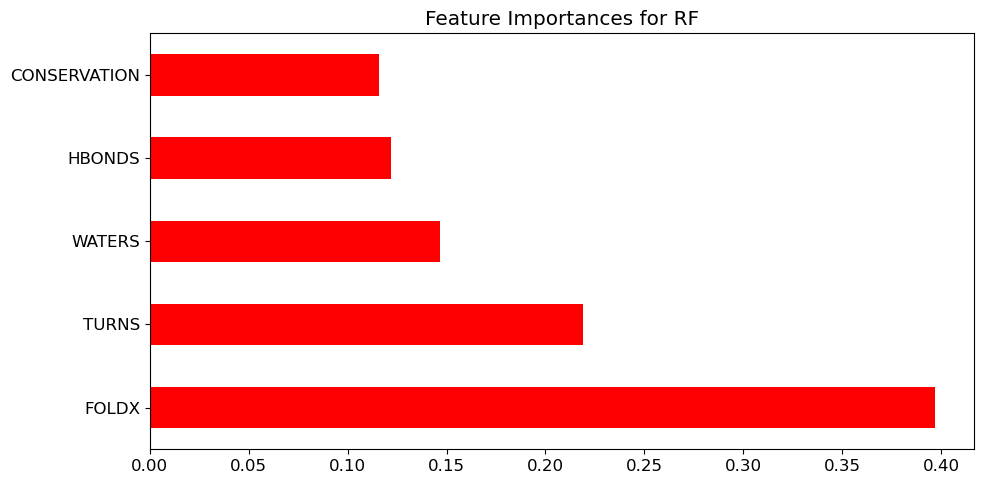

<Figure size 1000x500 with 0 Axes>

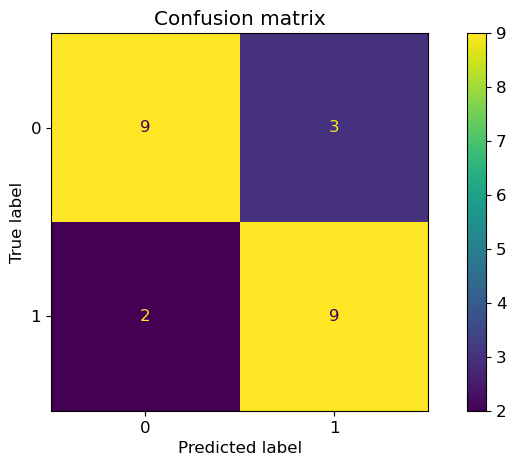

<Figure size 1000x500 with 0 Axes>

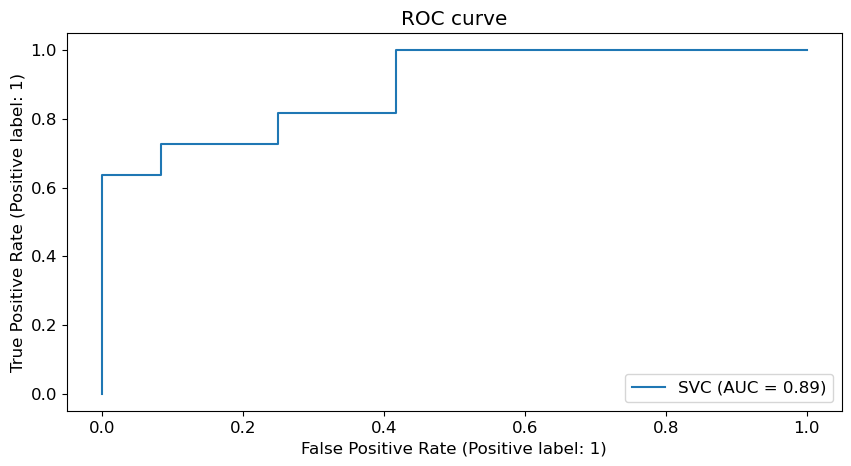

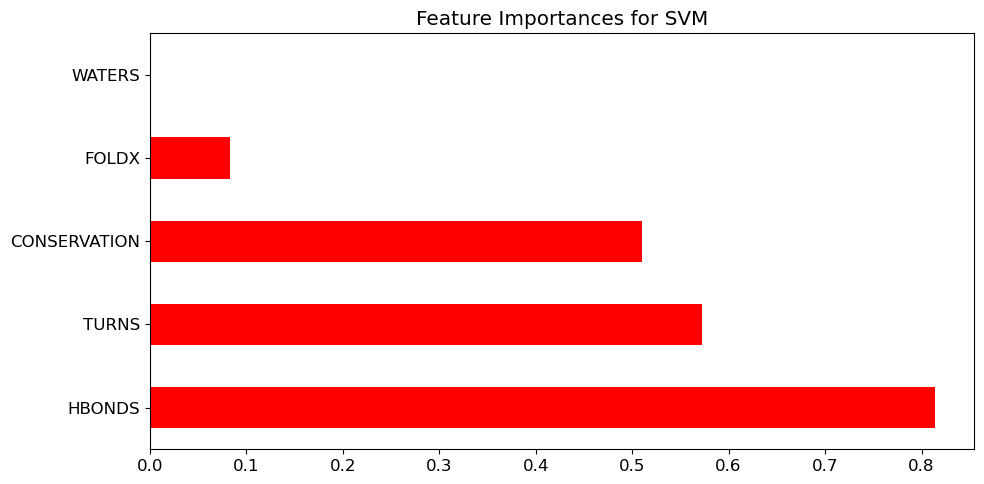

In [68]:
tagsBest=['WATERS','FOLDX','TURNS','HBONDS','CONSERVATION']
clfs=['DT','RF','SVM']
bestData={}

for clf in clfs:
    out=mlUtil.MLClassifier(df,tagsBest,output,classifier=clf,display=display,random_state=random_state) 
    bestData[clf]=out

### Predictions on colume E data using RF

In [69]:
# column E data
predictData = "feature_sets/cole_dataset.txt"
dfPred=pd.read_csv(predictData, sep="\s+", comment='#')


# additional features
feature.Calchydrophobicity(dfPred,newTag='HYDROPHOBICITY') #use feature.py to calculate hydrophobicity (same results as original data file)
feature.CalcAPBS(dfPred,'feature_sets/apbs_colE.dat',newTag="APBS")
feature.CalcSASASingleSite(dfPred,'feature_sets/sasaSingleSite_colE.dat',newTag="SASASingleSite")
for key,val in rmsf.items():
    feature.CalcRMSFLoc(dfPred,"feature_sets/%s"%val, newTag=key)


R92L  not found in input list
R92L  not found in input list
wt  not found in input list
l86p  not found in input list
t74p  not found in input list
v113g  not found in input list
l86r  not found in input list
v113e  not found in input list
v113p  not found in input list
a32t  not found in input list
a57p  not found in input list
a78p  not found in input list
a80p  not found in input list
a85v  not found in input list
c108r  not found in input list
c64a  not found in input list
c64f  not found in input list
c64i  not found in input list
c64l  not found in input list
c64m  not found in input list
c64w  not found in input list
c64w-c39g  not found in input list
c64w-q61g  not found in input list
c64y  not found in input list
c66g  not found in input list
d102a  not found in input list
e130k  not found in input list
e58a  not found in input list
e58d  not found in input list
e58g  not found in input list
e58k  not found in input list
f106l  not found in input list
f106y  not found in input

In [70]:
dfPred.to_csv('./feature_sets/predict_data.csv')

k-fold crossvalidation results
[0.75       0.5        0.875      1.         0.75       0.71428571
 0.57142857 0.85714286 0.71428571 0.57142857] 

results mean
0.7303571428571428 

Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.6956521739130435
                 precision    recall  f1-score   support

non-trafficking       1.00      0.42      0.59        12
    trafficking       0.61      1.00      0.76        11

       accuracy                           0.70        23
      macro avg       0.81      0.71      0.67        23
   weighted avg       0.81      0.70      0.67        23

   VARIANT  Prediction
0     A79T           1
1     C39R           1
2     C49S           1
3    D119H           1
4     D46E           1
5     D46N           0
6     F98L           1
7    L107P           1
8     L87R           1
9    M124I           1
10   M133T           1
11   N117S           1
12   N128S           1
13    R27L           1
14    R35L           1
15    R76

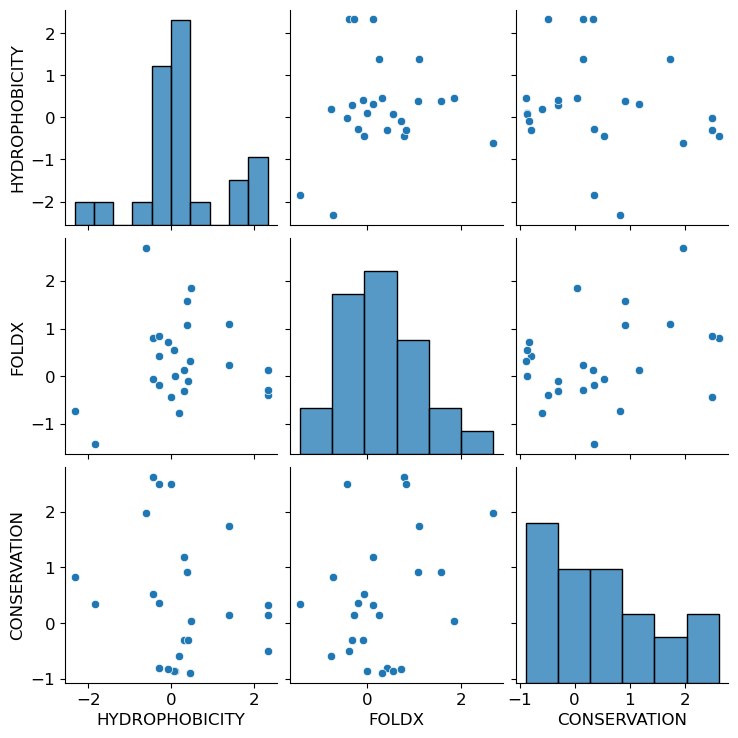

<Figure size 1000x500 with 0 Axes>

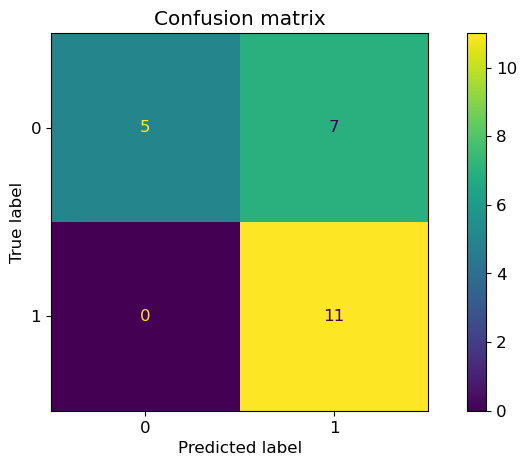

<Figure size 1000x500 with 0 Axes>

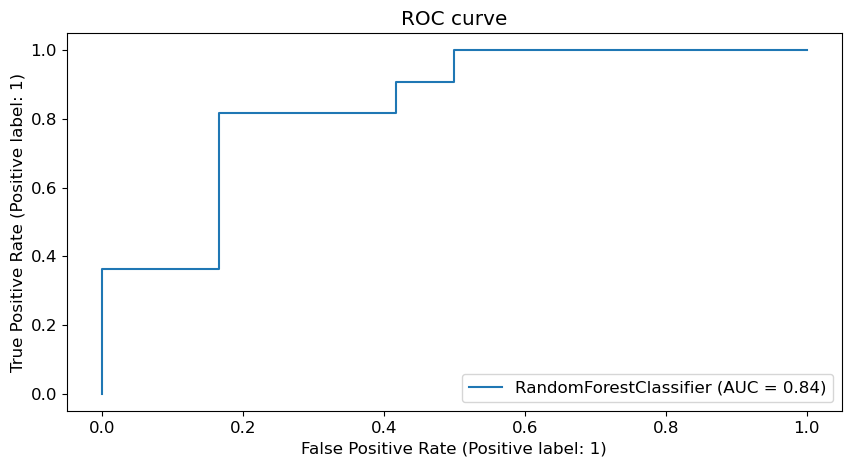

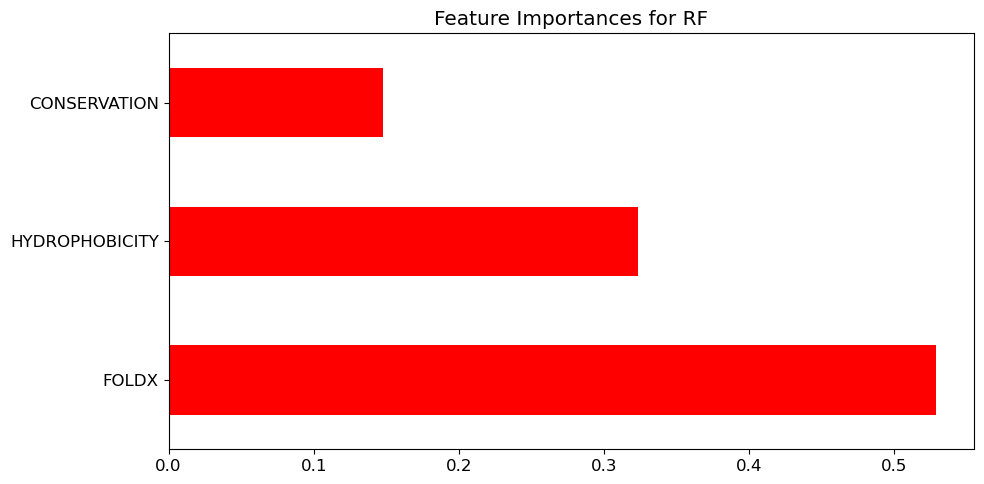

In [71]:
# trimmed feature set - Bio only
featuresPred=["FOLDX",'HYDROPHOBICITY','CONSERVATION']
predictions = mlUtil.MLClassifier(df,tagsBio,output,classifier="RF",display=display,predict=True,dfPred=dfPred) 


k-fold crossvalidation results
[0.75       0.875      0.75       0.625      0.625      1.
 0.57142857 0.57142857 0.42857143 0.71428571] 

results mean
0.6910714285714286 

Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.6956521739130435
                 precision    recall  f1-score   support

non-trafficking       1.00      0.42      0.59        12
    trafficking       0.61      1.00      0.76        11

       accuracy                           0.70        23
      macro avg       0.81      0.71      0.67        23
   weighted avg       0.81      0.70      0.67        23

   VARIANT  Prediction
0     A79T           1
1     C39R           1
2     C49S           1
3    D119H           0
4     D46E           1
5     D46N           0
6     F98L           1
7    L107P           0
8     L87R           1
9    M124I           1
10   M133T           1
11   N117S           1
12   N128S           1
13    R27L           1
14    R35L           1
15    R76H       

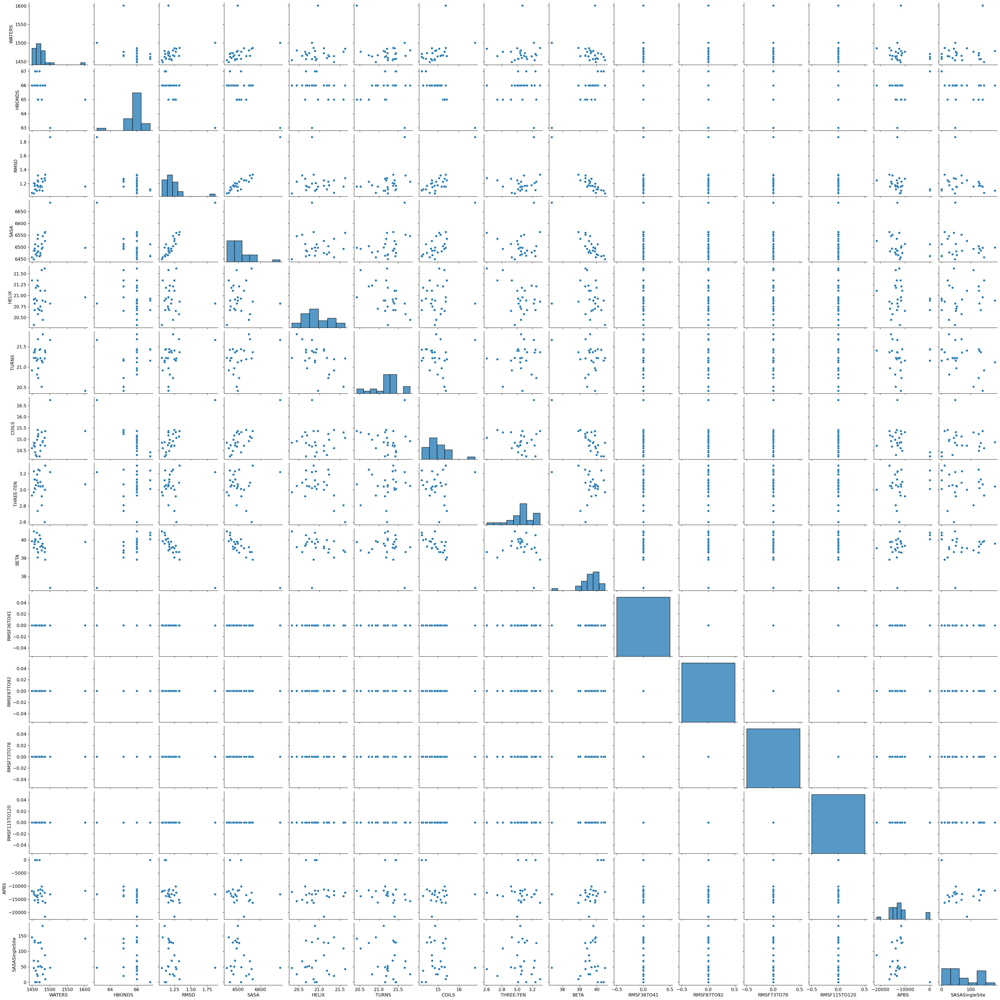

<Figure size 1000x500 with 0 Axes>

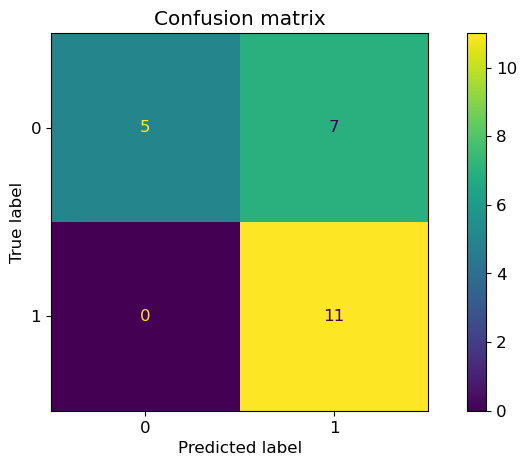

<Figure size 1000x500 with 0 Axes>

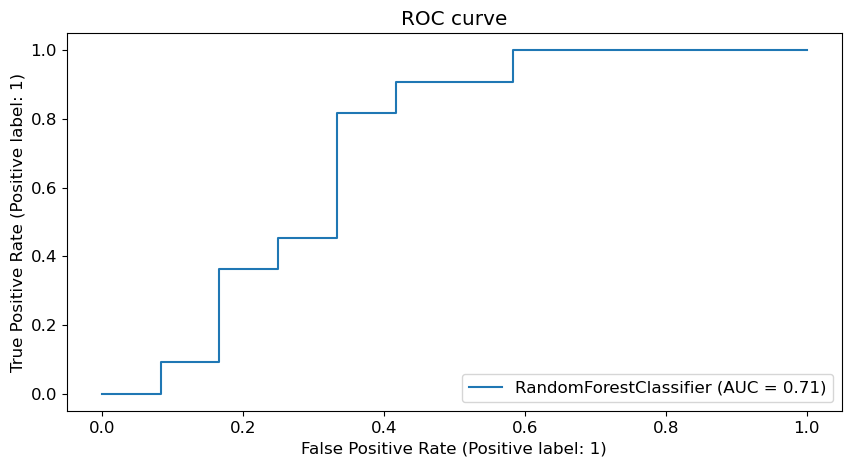

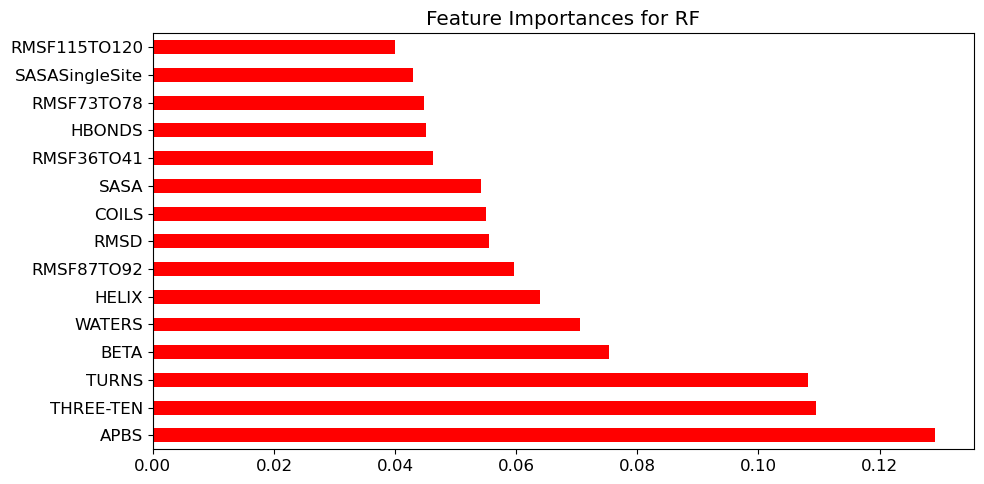

In [72]:
# trimmed feature set - MD only
featuresPred=["HELIX","TURNS","COILS","THREE-TEN","BETA","RMSD","HBONDS","SASA","WATERS"]
predictions = mlUtil.MLClassifier(df,tagsMD2,output,classifier="RF",display=display,predict=True,dfPred=dfPred) 


k-fold crossvalidation results
[1.         0.625      0.75       0.625      0.625      1.
 0.57142857 0.57142857 0.71428571 0.71428571] 

results mean
0.7196428571428571 

Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.7391304347826086
                 precision    recall  f1-score   support

non-trafficking       1.00      0.50      0.67        12
    trafficking       0.65      1.00      0.79        11

       accuracy                           0.74        23
      macro avg       0.82      0.75      0.73        23
   weighted avg       0.83      0.74      0.72        23

   VARIANT  Prediction
0     A79T           1
1     C39R           1
2     C49S           1
3    D119H           1
4     D46E           1
5     D46N           0
6     F98L           1
7    L107P           1
8     L87R           1
9    M124I           1
10   M133T           1
11   N117S           1
12   N128S           1
13    R27L           1
14    R35L           1
15    R76H       

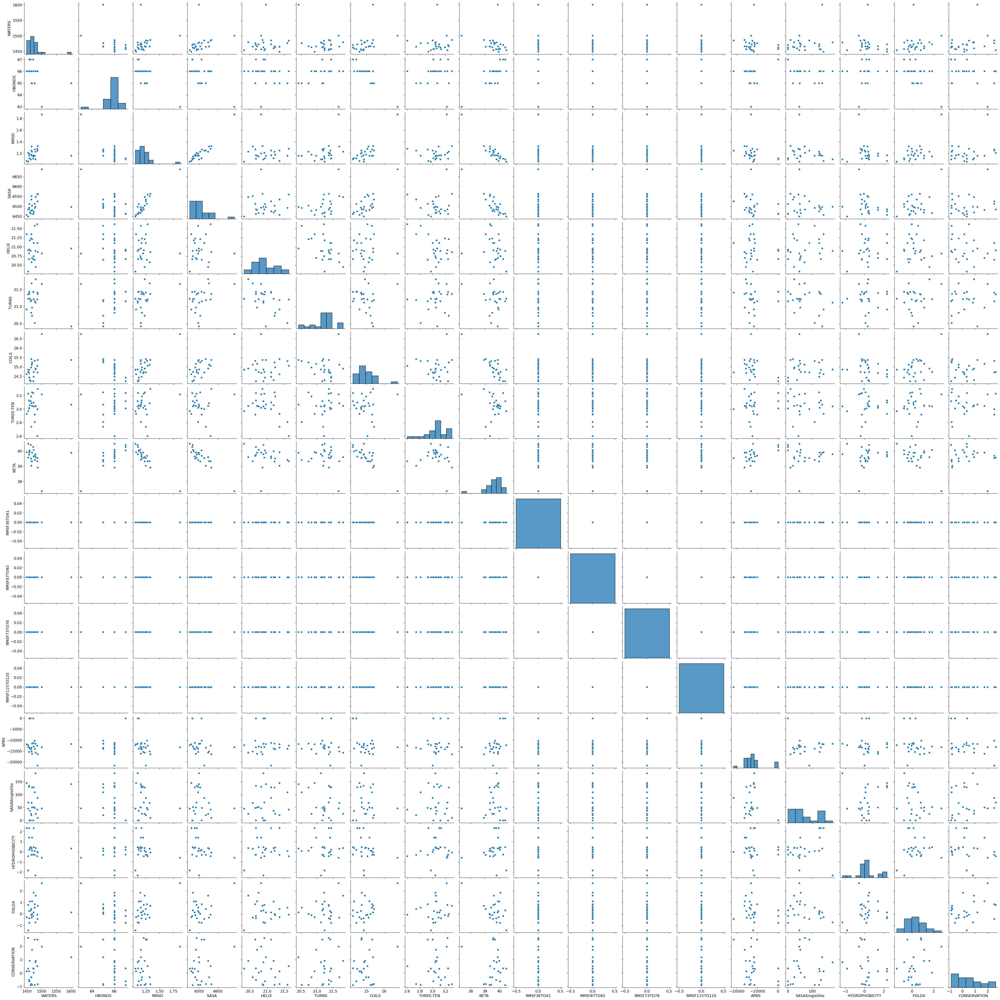

<Figure size 1000x500 with 0 Axes>

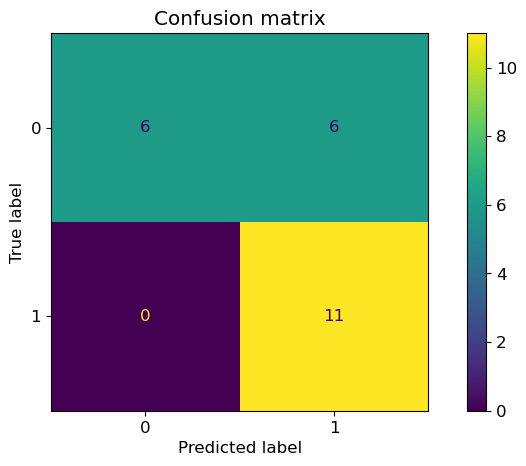

<Figure size 1000x500 with 0 Axes>

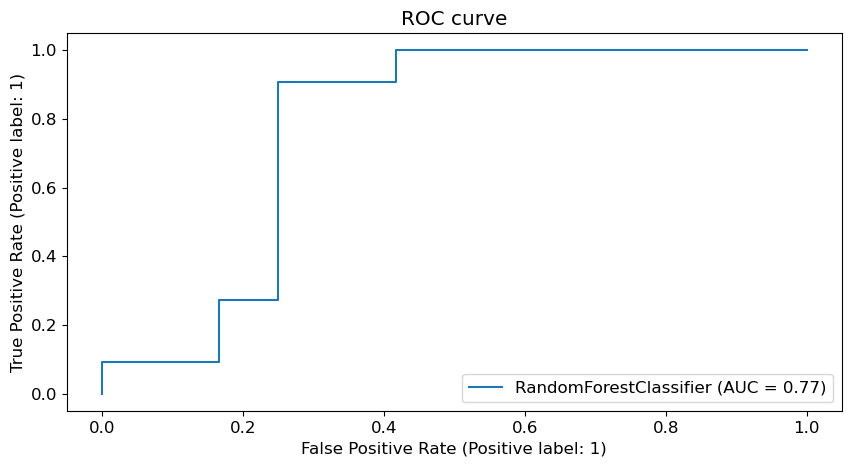

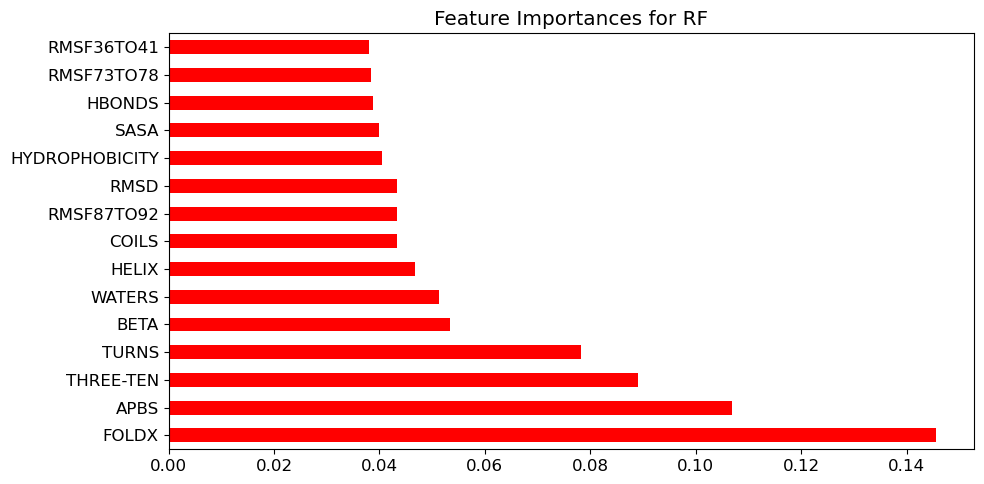

In [73]:
# trimmed feature set
featuresPred=["HELIX","TURNS","COILS","THREE-TEN","BETA","RMSD","HBONDS","SASA","WATERS","FOLDX"]
predictions = mlUtil.MLClassifier(df,tagsAll2,output,classifier="RF",display=display,predict=True,dfPred=dfPred) 



### Prediction on E58D and P114S

In [74]:
# column E data
predictData = "feature_sets/features_wt_e58d_p114s.txt"
dfPred=pd.read_csv(predictData, sep="\s+", comment='#')
dfPred = dfPred.loc[dfPred["VARIANT"] != 'wt'] # drop wt entry
dfPred=dfPred.drop(columns=['CLASS', 'TRAFFICKING'])

# additional features
feature.Calchydrophobicity(dfPred,newTag='HYDROPHOBICITY') #use feature.py to calculate hydrophobicity (same results as original data file)
feature.CalcAPBS(dfPred,'feature_sets/apbs_colE.dat',newTag="APBS")
feature.CalcSASASingleSite(dfPred,'feature_sets/sasaSingleSite_colE.dat',newTag="SASASingleSite")
for key,val in rmsf.items():
    feature.CalcRMSFLoc(dfPred,"feature_sets/%s"%val, newTag=key)

A79T  not found in input list
C39R  not found in input list
C49S  not found in input list
D119H  not found in input list
D46E  not found in input list
D46N  not found in input list
F98L  not found in input list
L107P  not found in input list
L87R  not found in input list
M124I  not found in input list
M133T  not found in input list
N117S  not found in input list
N128S  not found in input list
R27L  not found in input list
R35L  not found in input list
R76H  not found in input list
R76L  not found in input list
R92H  not found in input list
R92L  not found in input list
S26C  not found in input list
S26G  not found in input list
V131A  not found in input list
V131L  not found in input list
A79T  not found in input list
C39R  not found in input list
C49S  not found in input list
D119H  not found in input list
D46E  not found in input list
D46N  not found in input list
F98L  not found in input list
L107P  not found in input list
L87R  not found in input list
M124I  not found in input list

In [75]:
dfPred

,VARIANT,HELIX,TURNS,COILS,THREE-TEN,BETA,ISOLATED,RMSD,HBONDS,SASA,WATERS,FOLDX,CONSERVATION,HYDROPHOBICITY,APBS,SASASingleSite,RMSF36TO41,RMSF87TO92,RMSF73TO78,RMSF115TO120
0,e58d,20.7336,21.5751,14.1194,3.12481,40.2775,0.169517,1.11577,66.6009,6450.36,1442.91,-0.914945,-0.851,-0.10,0,0,1.34,0.81,0.90,1.76
1,p114s,21.3126,21.2196,14.2649,2.96430,39.9520,0.286528,1.14575,66.9960,6464.29,1459.95,3.553040,0.002,-0.19,0,0,1.47,0.90,0.83,1.70


In [76]:
# remove e58d and p114s entries from originla dataset
df = df.loc[(df["VARIANT"] != 'e58d') & (df["VARIANT"] != 'p114s')]

/home/xfang2/repos/herg/mlUtil.py:118: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[feature]=df[feature].round()
/home/xfang2/repos/herg/mlUtil.py:116: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[feature]=df[feature].round(2)


k-fold crossvalidation results
[1.         0.625      0.625      0.85714286 0.71428571 0.85714286
 0.42857143 0.57142857 0.71428571 0.71428571] 

results mean
0.7107142857142857 

Training sample accuracy
Overall accuracy  1.0
Test Accuracy
Overall accuracy  0.7272727272727273
                 precision    recall  f1-score   support

non-trafficking       1.00      0.50      0.67        12
    trafficking       0.62      1.00      0.77        10

       accuracy                           0.73        22
      macro avg       0.81      0.75      0.72        22
   weighted avg       0.83      0.73      0.71        22

  VARIANT  Prediction
0    e58d           1
1   p114s           1


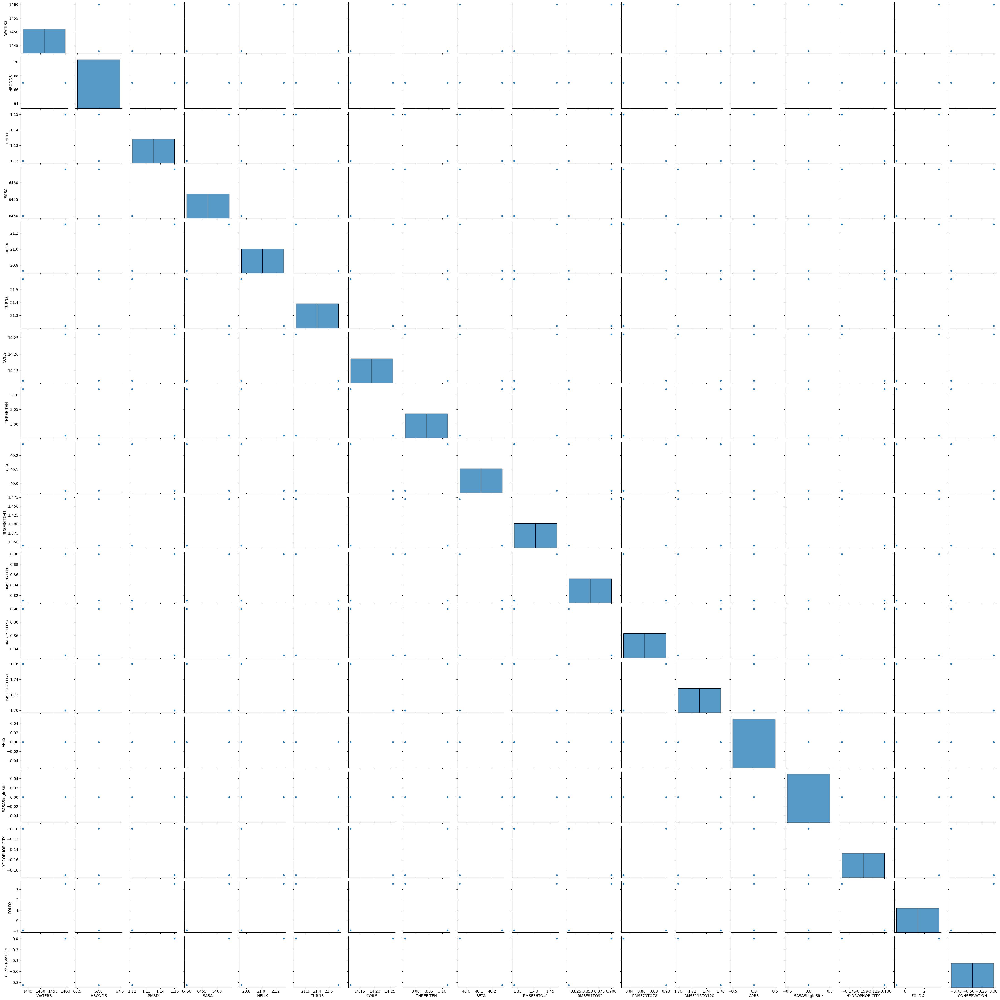

<Figure size 1000x500 with 0 Axes>

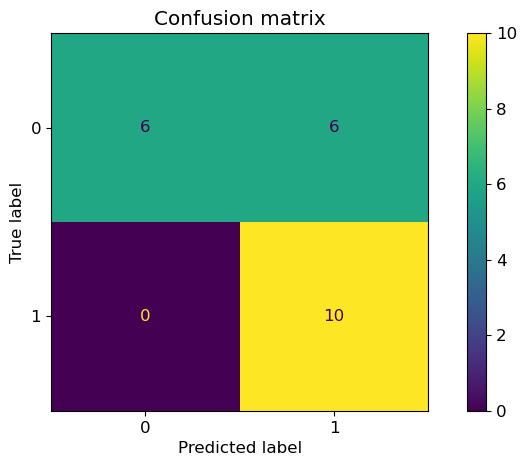

<Figure size 1000x500 with 0 Axes>

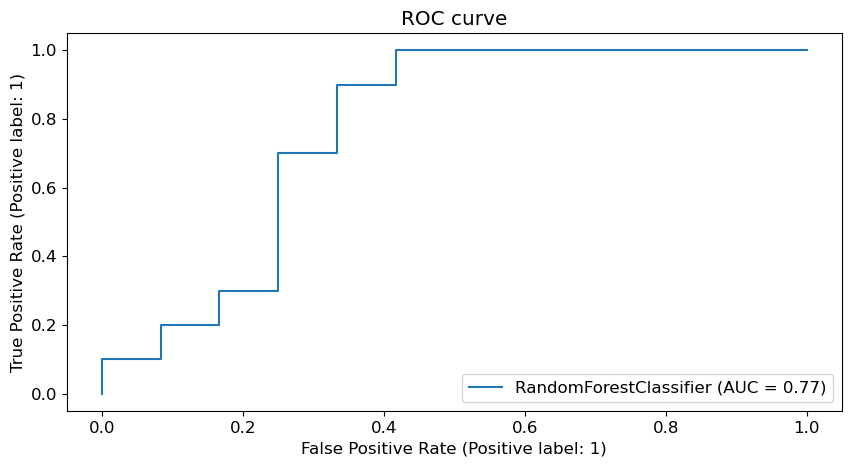

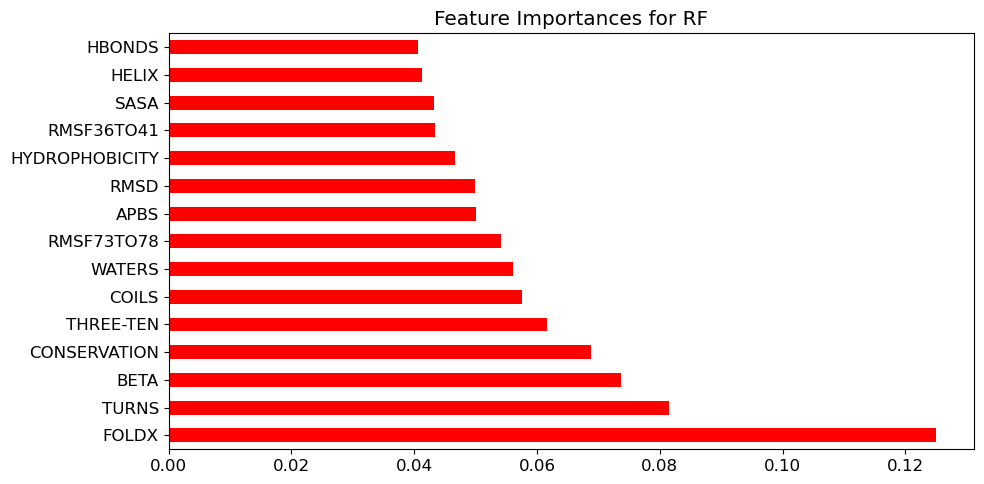

In [77]:
# trimmed feature set
featuresPred=["HELIX","TURNS","COILS","THREE-TEN","BETA","RMSD","HBONDS","SASA","WATERS","FOLDX"]
predictions = mlUtil.MLClassifier(df,tagsAll2,output,classifier="RF",display=display,predict=True,dfPred=dfPred) 


### Misc 
[under construction]

In [ ]:
case = cases["Prob"]
print("WARNING, IM NOT COMPUTING THE FPRs correctly")
case['fprs'] = case['fnrs']
plt.plot(case['fprs'],case['tprs'], label="Prob")

case = cases["DT"]
plt.plot(case['fprs'],case['tprs'], label="DT, auc=%f"%case['auc'])

case = cases["RF"]
plt.plot(case['fprs'],case['tprs'], label="RF, auc=%f"%case['auc'])

plt.legend()


*Displaying* features for all variants

Some complicated sorting

In [ ]:
df_alpha = df.sort_values(by='VARIANT') # alphabetically 

#df['position']
import re 

# finds all numbers in variant (position) 
nums = [re.findall(r'\d+',x) for x in df['VARIANT']]
#(lambda x: x[0] if len(x)>0 else 0)(nums)

# ugly, but returns the first number in each element, if defined, zero otherwise (for wt)
tables = [lambda x=x: int(x[0]) if len(x)>0 else 0 for x in nums]

df['Positions'] = [table() for table in tables]

df_seq = df.sort_values(by='Positions') # alphabetically 
df_seq.head()

In [ ]:
def zscore(xs):
  zs = xs - np.mean(xs)
  zs /= np.std(xs)
  return zs

def CalcFeatureMatrix(ldf):
  nVar = len(ldf['VARIANT'])   
  featureMatrix = np.zeros([nVar,len(tags)+1]) # added tag for trafficking  

  for i,tag in enumerate(tags):
    v = zscore(ldf[tag])
    featureMatrix[:,i] = v
  featureMatrix[:,len(tags)] = ldf['TRAFFICKING']

  l = np.where(ldf["VARIANT"] == 'wt')[0]
  wtVal = featureMatrix[l,]
  featureMatrix = np.subtract(featureMatrix,wtVal)

  return featureMatrix

import matplotlib as mpl
def DisplayFeatureMatrix(ldf, featureMatrix):
  daMin = np.min(featureMatrix)
  daMax = np.max(featureMatrix)
  print(tags)
  fig, ax = plt.subplots()
  #fig.subplots_adjust(bottom=0.5)
  #cmap = mpl.cm.cool
  norm = mpl.colors.Normalize(vmin=daMin, vmax=daMax)

  print("TRAFFIC: ")
  l = np.where(ldf["TRAFFICKING"] == 1)
  traf = ldf[ldf['TRAFFICKING']==1]
  for i,j in enumerate(traf['VARIANT']):
    print(j+" (%d) "%i,end="")
  tr = featureMatrix[l,:]
  ax.pcolormesh(tr[0,:,:])
  fig.colorbar(mpl.cm.ScalarMappable(norm=norm))
  ax.set_title("traffics")

  print("\nNONTRAFFIC: ")
  fig, ax = plt.subplots()
  l = np.where(ldf["TRAFFICKING"] == 0)
  traf = ldf[ldf['TRAFFICKING']==0]
  for i,j in enumerate(traf['VARIANT']):
    print(j+" (%d) "%i,end="")
  tr = featureMatrix[l,:]
  ax.pcolormesh(tr[0,:,:])
  fig.colorbar(mpl.cm.ScalarMappable(norm=norm))
  ax.set_title("no traffics")

featureMatrix = CalcFeatureMatrix(df_seq)
DisplayFeatureMatrix(df_seq,featureMatrix)

In [ ]:
df['Positions'].hist()

traf = df[df['TRAFFICKING']==1]
traf['Positions'].hist()

plt.figure()
nontraf = df[df['TRAFFICKING']==0]
nontraf['Positions'].hist()

In [ ]:
df_seq[df_seq['TRAFFICKING']==0]

In [ ]:
temp = df_seq[df_seq['Positions']==74]
temp[['VARIANT','TRAFFICKING']]

Plotting of correlation plots

In [ ]:

#cp /content/herg/*.txt /content/drive/MyDrive/herg-local/

In [ ]:
import numpy as np
xs = np.linspace(0,1,10)
df = pd.DataFrame()
trafix = np.zeros_like(xs)
trafix[::2]=1
df['CLASS'] = trafix
df['A'] = xs*2 + np.random.rand(len(xs))
df['B'] = xs*1 + np.random.rand(len(xs))
df['C'] = -xs + np.random.rand(len(xs))
df['D'] =  np.random.rand(len(xs))

ndf = df[ df['CLASS']==0]

features = ["A", "B", "C", "D"]
idx = len(features)
#df['']
fig, axs = plt.subplots(idx, idx, sharex=True, sharey=True)

for i, featurei in enumerate(features):
  for j, featurej in enumerate(features):
    if i < j:
       axs[i, j].axis('off')

    #print(featurei, featurej)
    else:
      axs[i, j].scatter(
          df[featurei],df[featurej],
          color='b'
          )
      axs[i, j].scatter(
          ndf[featurei],ndf[featurej],
          color='r'
          )
    if j==0: 
       axs[i, j].set_ylabel(featurei)

Quasi-bootstrapping example
Repeat the following 'n' times:
- Divide set into training/testing (not done in general, but suitable for this)
- Compute statistic of interest  (s)
- Store statistic

Then: 
- compute smean from avg( s1...sn ) 
- rank order {s1..sn}
- use 5th percentile as s5th, 95th percentile as s95th
- report s5th, smean, s95

  

In [ ]:
import numpy as np

pts = np.random.randn(1000) # mean zero numbers
iters = 10000
means = np.zeros(iters)

for i in range(iters):
  itersTraining = int(0.7 * iters)
  ptsi = np.random.choice(pts,itersTraining) # random w replacement
  # use my probability-based classifier to get ROC curve
  ptsi # do stuff
  # train with ptsi 
  itersTest = int(0.3 * iters)
  ptsj = np.random.choice(pts,itersTest) # random w replacement
  ptsj # do stuff

  # you'll want to store a matrix of ROC curves (length iters)  
  means[i] = np.mean( ptsi )


Bootstrapped

In [ ]:
sorted = np.sort(means)
da5th = int(iters * 0.05)
da95th = int(iters * 0.95)

print("Mean %f"% np.mean(sorted))
print("Conf interval [%f,%f]"%( sorted[da5th],  sorted[da95th]))


Standard (using original sample)

In [ ]:
print("Mean %f"% np.mean(pts))
print("Conf interval [%f,%f]" %(np.mean(pts) - np.std(pts)/np.sqrt(iters), np.mean(pts) + np.std(pts)/np.sqrt(iters)))


In [ ]:
da95th

In [ ]:
len(df)